# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

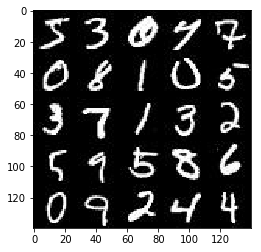

In [2]:
data_dir = './data'
import helper
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

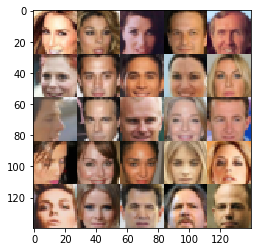

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(dtype=tf.float32, shape=(None, image_height, image_width, image_channels), name='input_real')
    z_data = tf.placeholder(dtype=tf.float32, shape=(None, z_dim), name='input_z')
    learn_rate = tf.placeholder(dtype=tf.float32)
    return real_input, z_data, learn_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def discriminator(images, reuse=False, alpha=0.2):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # Input layer is 28s28x(1 or 3)
        x1 = tf.layers.conv2d(images, filters=64, kernel_size=4, strides=2, padding='valid') 
        relu1 = tf.maximum(alpha * x1, x1)
        # 13x13x64
        
        x2 = tf.layers.conv2d(relu1, filters=128, kernel_size=3, strides=2, padding='valid') 
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 6x6x128
        
        x3 = tf.layers.conv2d(relu2, filters=256, kernel_size=2, strides=2, padding='valid') 
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 3x3x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 3*3*256))       
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    with tf.variable_scope('generator', reuse=not is_train):
        
        # First fully connected layer
        x1 = tf.layers.dense(z, 3*3*512)
        
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 3, 3, 512))
        
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 3x3x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, filters=256, kernel_size=2, strides=2, padding='valid') 
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 6x6x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, filters=128, kernel_size=3, strides=2, padding='valid') 
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 13x13x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, kernel_size=4, strides=2, padding='valid') 
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * 0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


## **Optimization**
Implement model_opt to create the optimization operations for the GANs. Use tf.trainable_variables to get all the trainable variables. Filter the variables with names that are in the discriminator and generator scope names. The function should return a tuple of (discriminator training operation, generator training operation)

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    
    d_vars = [var for var in t_vars if var.name.startswith("discriminator")]
    g_vars = [var for var in t_vars if var.name.startswith("generator")]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(d_loss, var_list = d_vars)
    
    g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(g_loss, var_list = g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #tf.reset_default_graph()
    steps = 0
    print_every = 4
    show_every = 40
    lr_alpha = 0.2 #leaky relu slope
    
    
#     img_channels = 0
#     if data_image_mode is "RGB":
#         img_channels = 3
#     if data_image_mode is "L":
#         img_channels = 1
        
#     print("Data shape: {}".format(*data_shape))
    
    width = data_shape[1]
    height = data_shape[2]
    channels = data_shape[3]
    
    
    input_real, input_z, learn_rate = model_inputs(width, height, channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,channels, alpha=lr_alpha)
    d_opt, g_opt = model_opt(d_loss, g_loss, learn_rate, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                image_input = 2 * batch_images #batch images is in range -0.5 to 0.5, so multiply by 2 to rescale
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: image_input, input_z: batch_z, learn_rate: learning_rate})
                '''
                Run the generator optimizer TWICE to avoid fast convergence of the discriminator network
                '''
                _ = sess.run(g_opt, feed_dict={input_real: image_input, input_z: batch_z, learn_rate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: image_input, input_z: batch_z, learn_rate: learning_rate})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: image_input, learn_rate: learning_rate })
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    #losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    n_images = 9
                    show_generator_output(sess, n_images, input_z, channels, data_image_mode)
    print("-------Done-------")

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/5... Discriminator Loss: 3.4581... Generator Loss: 0.0389
Epoch 1/5... Discriminator Loss: 3.4230... Generator Loss: 0.0429
Epoch 1/5... Discriminator Loss: 3.5303... Generator Loss: 0.0417
Epoch 1/5... Discriminator Loss: 3.3557... Generator Loss: 0.0479
Epoch 1/5... Discriminator Loss: 3.0844... Generator Loss: 0.0638
Epoch 1/5... Discriminator Loss: 2.9455... Generator Loss: 0.0776
Epoch 1/5... Discriminator Loss: 2.7566... Generator Loss: 0.1040
Epoch 1/5... Discriminator Loss: 2.4104... Generator Loss: 0.1444
Epoch 1/5... Discriminator Loss: 2.6959... Generator Loss: 0.1125
Epoch 1/5... Discriminator Loss: 2.2306... Generator Loss: 0.1988


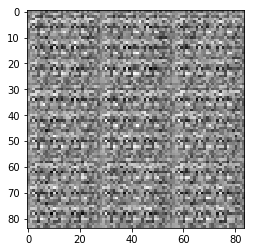

Epoch 1/5... Discriminator Loss: 2.1911... Generator Loss: 0.2074
Epoch 1/5... Discriminator Loss: 2.4010... Generator Loss: 0.1957
Epoch 1/5... Discriminator Loss: 2.2326... Generator Loss: 0.2477
Epoch 1/5... Discriminator Loss: 2.1811... Generator Loss: 0.2628
Epoch 1/5... Discriminator Loss: 2.4010... Generator Loss: 0.2593
Epoch 1/5... Discriminator Loss: 2.3193... Generator Loss: 0.2690
Epoch 1/5... Discriminator Loss: 2.4496... Generator Loss: 0.2960
Epoch 1/5... Discriminator Loss: 2.0807... Generator Loss: 0.3651
Epoch 1/5... Discriminator Loss: 1.9878... Generator Loss: 0.5094
Epoch 1/5... Discriminator Loss: 1.6766... Generator Loss: 0.5962


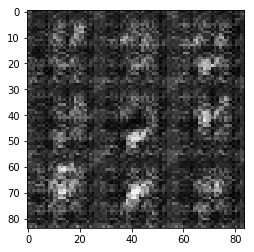

Epoch 1/5... Discriminator Loss: 1.6042... Generator Loss: 0.5727
Epoch 1/5... Discriminator Loss: 1.4442... Generator Loss: 0.6982
Epoch 1/5... Discriminator Loss: 1.3599... Generator Loss: 0.6906
Epoch 1/5... Discriminator Loss: 1.9218... Generator Loss: 0.4469
Epoch 1/5... Discriminator Loss: 1.5258... Generator Loss: 0.5777
Epoch 1/5... Discriminator Loss: 1.4659... Generator Loss: 0.5617
Epoch 1/5... Discriminator Loss: 1.8414... Generator Loss: 0.5134
Epoch 1/5... Discriminator Loss: 1.5356... Generator Loss: 0.6260
Epoch 1/5... Discriminator Loss: 1.5200... Generator Loss: 0.6376
Epoch 1/5... Discriminator Loss: 1.7144... Generator Loss: 0.5250


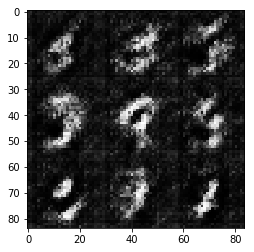

Epoch 1/5... Discriminator Loss: 1.6163... Generator Loss: 0.5376
Epoch 1/5... Discriminator Loss: 1.4552... Generator Loss: 0.6348
Epoch 1/5... Discriminator Loss: 1.5285... Generator Loss: 0.6167
Epoch 1/5... Discriminator Loss: 1.5345... Generator Loss: 0.5781
Epoch 1/5... Discriminator Loss: 1.4738... Generator Loss: 0.6118
Epoch 1/5... Discriminator Loss: 1.4934... Generator Loss: 0.6006
Epoch 1/5... Discriminator Loss: 1.5007... Generator Loss: 0.6125
Epoch 1/5... Discriminator Loss: 1.4521... Generator Loss: 0.6420
Epoch 1/5... Discriminator Loss: 1.4768... Generator Loss: 0.6000
Epoch 1/5... Discriminator Loss: 1.5391... Generator Loss: 0.5720


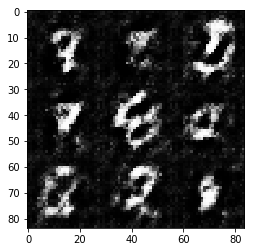

Epoch 1/5... Discriminator Loss: 1.4963... Generator Loss: 0.5805
Epoch 1/5... Discriminator Loss: 1.5420... Generator Loss: 0.5865
Epoch 1/5... Discriminator Loss: 1.4705... Generator Loss: 0.6176
Epoch 1/5... Discriminator Loss: 1.4613... Generator Loss: 0.6127
Epoch 1/5... Discriminator Loss: 1.4276... Generator Loss: 0.5938
Epoch 1/5... Discriminator Loss: 1.4413... Generator Loss: 0.6006
Epoch 1/5... Discriminator Loss: 1.4327... Generator Loss: 0.6325
Epoch 1/5... Discriminator Loss: 1.4225... Generator Loss: 0.6158
Epoch 1/5... Discriminator Loss: 1.4504... Generator Loss: 0.6345
Epoch 1/5... Discriminator Loss: 1.3685... Generator Loss: 0.6676


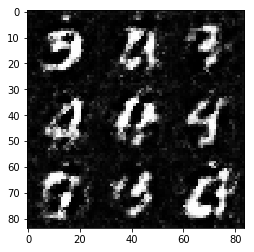

Epoch 1/5... Discriminator Loss: 1.3705... Generator Loss: 0.6529
Epoch 1/5... Discriminator Loss: 1.3758... Generator Loss: 0.6286
Epoch 1/5... Discriminator Loss: 1.3675... Generator Loss: 0.6474
Epoch 1/5... Discriminator Loss: 1.4032... Generator Loss: 0.6442
Epoch 1/5... Discriminator Loss: 1.4066... Generator Loss: 0.6314
Epoch 1/5... Discriminator Loss: 1.3693... Generator Loss: 0.6488
Epoch 1/5... Discriminator Loss: 1.3427... Generator Loss: 0.6786
Epoch 1/5... Discriminator Loss: 1.3876... Generator Loss: 0.6276
Epoch 1/5... Discriminator Loss: 1.3828... Generator Loss: 0.6145
Epoch 1/5... Discriminator Loss: 1.3610... Generator Loss: 0.6131


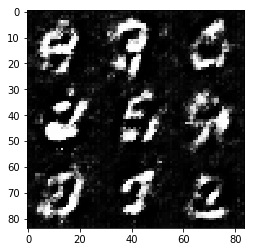

Epoch 1/5... Discriminator Loss: 1.3336... Generator Loss: 0.6447
Epoch 1/5... Discriminator Loss: 1.2955... Generator Loss: 0.6904
Epoch 1/5... Discriminator Loss: 1.3198... Generator Loss: 0.6531
Epoch 1/5... Discriminator Loss: 1.2947... Generator Loss: 0.7093
Epoch 1/5... Discriminator Loss: 1.2717... Generator Loss: 0.6889
Epoch 1/5... Discriminator Loss: 1.2733... Generator Loss: 0.6493
Epoch 1/5... Discriminator Loss: 1.2760... Generator Loss: 0.6531
Epoch 1/5... Discriminator Loss: 1.3038... Generator Loss: 0.6807
Epoch 1/5... Discriminator Loss: 1.3066... Generator Loss: 0.6625
Epoch 1/5... Discriminator Loss: 1.3148... Generator Loss: 0.6130


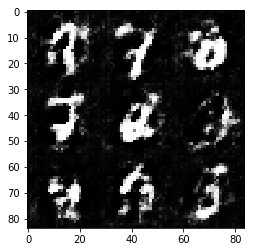

Epoch 1/5... Discriminator Loss: 1.2506... Generator Loss: 0.6952
Epoch 1/5... Discriminator Loss: 1.2497... Generator Loss: 0.7037
Epoch 1/5... Discriminator Loss: 1.2579... Generator Loss: 0.6656
Epoch 1/5... Discriminator Loss: 1.1900... Generator Loss: 0.7292
Epoch 1/5... Discriminator Loss: 1.2126... Generator Loss: 0.7008
Epoch 1/5... Discriminator Loss: 1.2654... Generator Loss: 0.6950
Epoch 1/5... Discriminator Loss: 1.2347... Generator Loss: 0.6871
Epoch 1/5... Discriminator Loss: 1.2678... Generator Loss: 0.7452
Epoch 1/5... Discriminator Loss: 1.2330... Generator Loss: 0.6576
Epoch 1/5... Discriminator Loss: 1.2094... Generator Loss: 0.7097


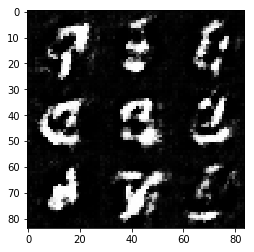

Epoch 1/5... Discriminator Loss: 1.2210... Generator Loss: 0.7551
Epoch 1/5... Discriminator Loss: 1.2332... Generator Loss: 0.7314
Epoch 1/5... Discriminator Loss: 1.2023... Generator Loss: 0.7063
Epoch 1/5... Discriminator Loss: 1.2345... Generator Loss: 0.6666
Epoch 1/5... Discriminator Loss: 1.2092... Generator Loss: 0.8157
Epoch 1/5... Discriminator Loss: 1.1440... Generator Loss: 0.7961
Epoch 1/5... Discriminator Loss: 1.2171... Generator Loss: 0.6195
Epoch 1/5... Discriminator Loss: 1.1903... Generator Loss: 0.7071
Epoch 1/5... Discriminator Loss: 1.2156... Generator Loss: 0.7063
Epoch 1/5... Discriminator Loss: 1.1636... Generator Loss: 0.8903


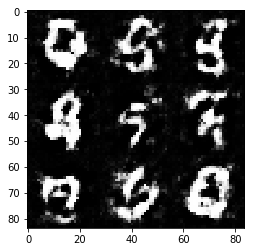

Epoch 1/5... Discriminator Loss: 1.2434... Generator Loss: 0.5674
Epoch 1/5... Discriminator Loss: 1.1708... Generator Loss: 0.6788
Epoch 1/5... Discriminator Loss: 1.2465... Generator Loss: 0.7767
Epoch 1/5... Discriminator Loss: 1.1666... Generator Loss: 0.7224
Epoch 1/5... Discriminator Loss: 1.2945... Generator Loss: 0.5305
Epoch 1/5... Discriminator Loss: 1.2412... Generator Loss: 0.7259
Epoch 1/5... Discriminator Loss: 1.1828... Generator Loss: 0.7124
Epoch 1/5... Discriminator Loss: 1.2463... Generator Loss: 0.8414
Epoch 1/5... Discriminator Loss: 1.1908... Generator Loss: 0.8755
Epoch 1/5... Discriminator Loss: 1.2126... Generator Loss: 0.6991


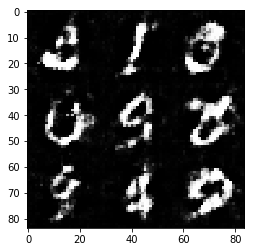

Epoch 1/5... Discriminator Loss: 1.2467... Generator Loss: 0.7096
Epoch 1/5... Discriminator Loss: 1.2265... Generator Loss: 0.8928
Epoch 1/5... Discriminator Loss: 1.2630... Generator Loss: 0.7314
Epoch 1/5... Discriminator Loss: 1.1878... Generator Loss: 0.8507
Epoch 1/5... Discriminator Loss: 1.2749... Generator Loss: 0.5752
Epoch 1/5... Discriminator Loss: 1.2953... Generator Loss: 0.5719
Epoch 1/5... Discriminator Loss: 1.2032... Generator Loss: 0.8026
Epoch 1/5... Discriminator Loss: 1.2680... Generator Loss: 0.6718
Epoch 1/5... Discriminator Loss: 1.2950... Generator Loss: 0.5952
Epoch 1/5... Discriminator Loss: 1.2800... Generator Loss: 0.8257


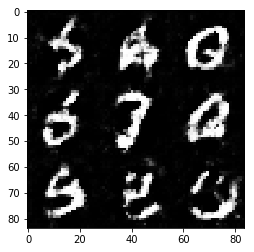

Epoch 1/5... Discriminator Loss: 1.3099... Generator Loss: 0.5387
Epoch 1/5... Discriminator Loss: 1.5118... Generator Loss: 0.3480
Epoch 1/5... Discriminator Loss: 1.2849... Generator Loss: 0.7472
Epoch 1/5... Discriminator Loss: 1.2705... Generator Loss: 0.5968
Epoch 1/5... Discriminator Loss: 1.3295... Generator Loss: 0.5292
Epoch 1/5... Discriminator Loss: 1.3690... Generator Loss: 0.4869
Epoch 1/5... Discriminator Loss: 1.2780... Generator Loss: 0.6350
Epoch 2/5... Discriminator Loss: 1.4466... Generator Loss: 0.4109
Epoch 2/5... Discriminator Loss: 1.3341... Generator Loss: 0.5447
Epoch 2/5... Discriminator Loss: 1.3034... Generator Loss: 0.7705


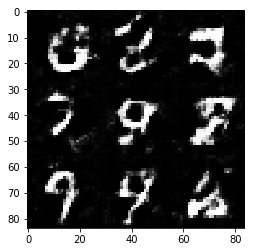

Epoch 2/5... Discriminator Loss: 1.2895... Generator Loss: 0.7515
Epoch 2/5... Discriminator Loss: 1.2574... Generator Loss: 0.6661
Epoch 2/5... Discriminator Loss: 1.3046... Generator Loss: 0.7131
Epoch 2/5... Discriminator Loss: 1.4018... Generator Loss: 0.8991
Epoch 2/5... Discriminator Loss: 1.4496... Generator Loss: 0.4464
Epoch 2/5... Discriminator Loss: 1.3111... Generator Loss: 0.6125
Epoch 2/5... Discriminator Loss: 1.4610... Generator Loss: 0.3950
Epoch 2/5... Discriminator Loss: 1.3208... Generator Loss: 0.5979
Epoch 2/5... Discriminator Loss: 1.3611... Generator Loss: 0.4885
Epoch 2/5... Discriminator Loss: 1.3551... Generator Loss: 0.8190


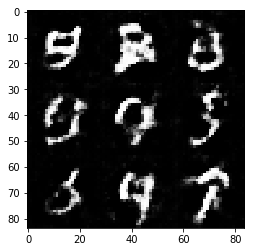

Epoch 2/5... Discriminator Loss: 1.3182... Generator Loss: 0.5896
Epoch 2/5... Discriminator Loss: 1.4635... Generator Loss: 0.3820
Epoch 2/5... Discriminator Loss: 1.3540... Generator Loss: 0.6084
Epoch 2/5... Discriminator Loss: 1.2965... Generator Loss: 0.8523
Epoch 2/5... Discriminator Loss: 1.4073... Generator Loss: 0.4749
Epoch 2/5... Discriminator Loss: 1.3105... Generator Loss: 0.6463
Epoch 2/5... Discriminator Loss: 1.3499... Generator Loss: 0.7222
Epoch 2/5... Discriminator Loss: 1.3931... Generator Loss: 0.5464
Epoch 2/5... Discriminator Loss: 1.4110... Generator Loss: 0.5041
Epoch 2/5... Discriminator Loss: 1.6287... Generator Loss: 0.3052


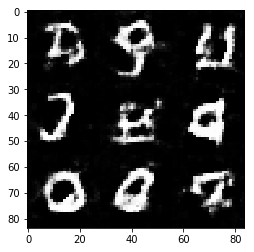

Epoch 2/5... Discriminator Loss: 1.3608... Generator Loss: 0.5676
Epoch 2/5... Discriminator Loss: 1.3033... Generator Loss: 0.6745
Epoch 2/5... Discriminator Loss: 1.3500... Generator Loss: 0.8823
Epoch 2/5... Discriminator Loss: 1.3740... Generator Loss: 0.4959
Epoch 2/5... Discriminator Loss: 1.4213... Generator Loss: 0.5007
Epoch 2/5... Discriminator Loss: 1.3260... Generator Loss: 0.5582
Epoch 2/5... Discriminator Loss: 1.3351... Generator Loss: 0.5158
Epoch 2/5... Discriminator Loss: 1.3952... Generator Loss: 0.5252
Epoch 2/5... Discriminator Loss: 1.3061... Generator Loss: 0.6719
Epoch 2/5... Discriminator Loss: 1.3654... Generator Loss: 0.6371


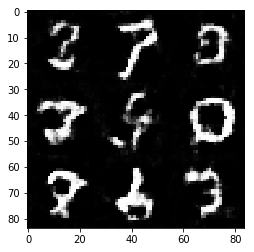

Epoch 2/5... Discriminator Loss: 1.3519... Generator Loss: 0.5045
Epoch 2/5... Discriminator Loss: 1.5418... Generator Loss: 0.3728
Epoch 2/5... Discriminator Loss: 1.3918... Generator Loss: 0.5262
Epoch 2/5... Discriminator Loss: 1.4248... Generator Loss: 0.6160
Epoch 2/5... Discriminator Loss: 1.3502... Generator Loss: 0.6864
Epoch 2/5... Discriminator Loss: 1.3621... Generator Loss: 0.7764
Epoch 2/5... Discriminator Loss: 1.3795... Generator Loss: 0.7945
Epoch 2/5... Discriminator Loss: 1.3183... Generator Loss: 0.6161
Epoch 2/5... Discriminator Loss: 1.4441... Generator Loss: 0.4477
Epoch 2/5... Discriminator Loss: 1.3949... Generator Loss: 0.5007


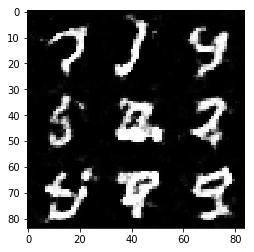

Epoch 2/5... Discriminator Loss: 1.3910... Generator Loss: 0.5300
Epoch 2/5... Discriminator Loss: 1.3999... Generator Loss: 0.6360
Epoch 2/5... Discriminator Loss: 1.3431... Generator Loss: 0.8613
Epoch 2/5... Discriminator Loss: 1.3298... Generator Loss: 0.6699
Epoch 2/5... Discriminator Loss: 1.3260... Generator Loss: 0.6704
Epoch 2/5... Discriminator Loss: 1.3252... Generator Loss: 0.7971
Epoch 2/5... Discriminator Loss: 1.3242... Generator Loss: 0.7228
Epoch 2/5... Discriminator Loss: 1.3724... Generator Loss: 0.6609
Epoch 2/5... Discriminator Loss: 1.3901... Generator Loss: 0.7717
Epoch 2/5... Discriminator Loss: 1.3747... Generator Loss: 0.5787


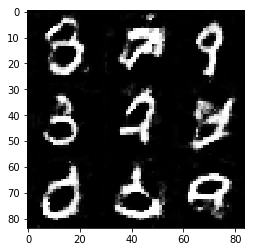

Epoch 2/5... Discriminator Loss: 1.5581... Generator Loss: 0.3254
Epoch 2/5... Discriminator Loss: 1.3544... Generator Loss: 0.7296
Epoch 2/5... Discriminator Loss: 1.3025... Generator Loss: 0.6752
Epoch 2/5... Discriminator Loss: 1.3201... Generator Loss: 0.6125
Epoch 2/5... Discriminator Loss: 1.3403... Generator Loss: 0.5240
Epoch 2/5... Discriminator Loss: 1.4787... Generator Loss: 0.4151
Epoch 2/5... Discriminator Loss: 1.5280... Generator Loss: 0.3599
Epoch 2/5... Discriminator Loss: 1.3877... Generator Loss: 0.6325
Epoch 2/5... Discriminator Loss: 1.2438... Generator Loss: 0.6638
Epoch 2/5... Discriminator Loss: 1.3571... Generator Loss: 0.6542


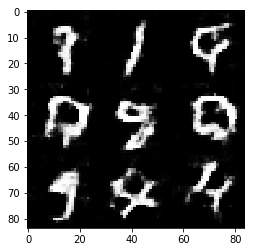

Epoch 2/5... Discriminator Loss: 1.3206... Generator Loss: 0.5990
Epoch 2/5... Discriminator Loss: 1.7035... Generator Loss: 0.2705
Epoch 2/5... Discriminator Loss: 1.4158... Generator Loss: 0.8319
Epoch 2/5... Discriminator Loss: 1.2571... Generator Loss: 0.6791
Epoch 2/5... Discriminator Loss: 1.3789... Generator Loss: 0.6583
Epoch 2/5... Discriminator Loss: 1.3321... Generator Loss: 0.5873
Epoch 2/5... Discriminator Loss: 1.3253... Generator Loss: 0.8081
Epoch 2/5... Discriminator Loss: 1.3889... Generator Loss: 0.4716
Epoch 2/5... Discriminator Loss: 1.3307... Generator Loss: 0.7087
Epoch 2/5... Discriminator Loss: 1.3147... Generator Loss: 0.7895


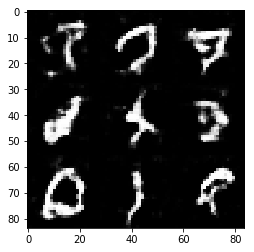

Epoch 2/5... Discriminator Loss: 1.4387... Generator Loss: 0.3965
Epoch 2/5... Discriminator Loss: 1.3845... Generator Loss: 0.4912
Epoch 2/5... Discriminator Loss: 1.3462... Generator Loss: 0.6070
Epoch 2/5... Discriminator Loss: 1.3480... Generator Loss: 0.8449
Epoch 2/5... Discriminator Loss: 1.3574... Generator Loss: 0.6550
Epoch 2/5... Discriminator Loss: 1.4905... Generator Loss: 0.3654
Epoch 2/5... Discriminator Loss: 1.4032... Generator Loss: 0.4446
Epoch 2/5... Discriminator Loss: 1.4158... Generator Loss: 0.5794
Epoch 2/5... Discriminator Loss: 1.3194... Generator Loss: 0.5715
Epoch 2/5... Discriminator Loss: 1.3791... Generator Loss: 0.5289


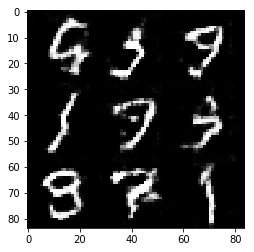

Epoch 2/5... Discriminator Loss: 1.3740... Generator Loss: 0.5500
Epoch 2/5... Discriminator Loss: 1.3139... Generator Loss: 0.6942
Epoch 2/5... Discriminator Loss: 1.3385... Generator Loss: 0.9980
Epoch 2/5... Discriminator Loss: 1.3937... Generator Loss: 0.7415
Epoch 2/5... Discriminator Loss: 1.3853... Generator Loss: 0.6148
Epoch 2/5... Discriminator Loss: 1.3705... Generator Loss: 0.6115
Epoch 2/5... Discriminator Loss: 1.3102... Generator Loss: 0.6447
Epoch 2/5... Discriminator Loss: 1.3607... Generator Loss: 0.8538
Epoch 2/5... Discriminator Loss: 1.3512... Generator Loss: 0.5654
Epoch 2/5... Discriminator Loss: 1.3735... Generator Loss: 0.6095


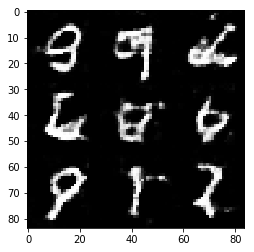

Epoch 2/5... Discriminator Loss: 1.3368... Generator Loss: 0.6275
Epoch 2/5... Discriminator Loss: 1.3636... Generator Loss: 0.5648
Epoch 2/5... Discriminator Loss: 1.5436... Generator Loss: 0.3515
Epoch 2/5... Discriminator Loss: 1.7906... Generator Loss: 0.2373
Epoch 2/5... Discriminator Loss: 1.5861... Generator Loss: 0.7081
Epoch 2/5... Discriminator Loss: 1.2986... Generator Loss: 0.5862
Epoch 2/5... Discriminator Loss: 1.3672... Generator Loss: 0.5485
Epoch 2/5... Discriminator Loss: 1.3542... Generator Loss: 0.6334
Epoch 2/5... Discriminator Loss: 1.2743... Generator Loss: 0.5619
Epoch 2/5... Discriminator Loss: 1.2979... Generator Loss: 0.7291


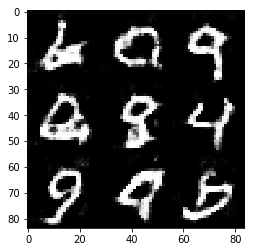

Epoch 2/5... Discriminator Loss: 1.5153... Generator Loss: 1.0018
Epoch 2/5... Discriminator Loss: 1.5350... Generator Loss: 0.3527
Epoch 2/5... Discriminator Loss: 1.2969... Generator Loss: 0.7436
Epoch 2/5... Discriminator Loss: 1.3592... Generator Loss: 0.5863
Epoch 2/5... Discriminator Loss: 1.3044... Generator Loss: 0.5634
Epoch 2/5... Discriminator Loss: 1.4661... Generator Loss: 0.3909
Epoch 2/5... Discriminator Loss: 1.3269... Generator Loss: 0.7866
Epoch 2/5... Discriminator Loss: 1.2572... Generator Loss: 0.6156
Epoch 2/5... Discriminator Loss: 1.3877... Generator Loss: 0.7036
Epoch 2/5... Discriminator Loss: 1.5526... Generator Loss: 0.3378


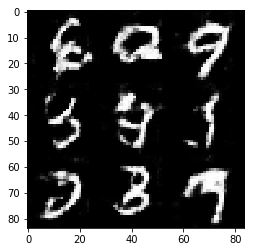

Epoch 2/5... Discriminator Loss: 1.3237... Generator Loss: 0.5749
Epoch 2/5... Discriminator Loss: 1.3272... Generator Loss: 0.6072
Epoch 2/5... Discriminator Loss: 1.3098... Generator Loss: 0.5462
Epoch 2/5... Discriminator Loss: 1.3118... Generator Loss: 0.6284
Epoch 3/5... Discriminator Loss: 1.2982... Generator Loss: 0.7402
Epoch 3/5... Discriminator Loss: 1.4034... Generator Loss: 0.4017
Epoch 3/5... Discriminator Loss: 1.3619... Generator Loss: 0.4945
Epoch 3/5... Discriminator Loss: 1.3475... Generator Loss: 0.5163
Epoch 3/5... Discriminator Loss: 1.3689... Generator Loss: 0.7926
Epoch 3/5... Discriminator Loss: 1.3642... Generator Loss: 0.6530


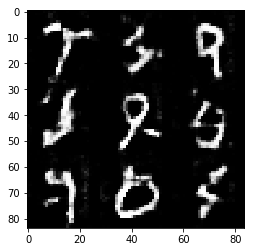

Epoch 3/5... Discriminator Loss: 1.3612... Generator Loss: 0.4885
Epoch 3/5... Discriminator Loss: 1.4249... Generator Loss: 0.4623
Epoch 3/5... Discriminator Loss: 1.4147... Generator Loss: 0.4449
Epoch 3/5... Discriminator Loss: 1.4797... Generator Loss: 0.3617
Epoch 3/5... Discriminator Loss: 1.4418... Generator Loss: 0.3547
Epoch 3/5... Discriminator Loss: 1.4758... Generator Loss: 0.3677
Epoch 3/5... Discriminator Loss: 1.2534... Generator Loss: 0.7516
Epoch 3/5... Discriminator Loss: 1.3624... Generator Loss: 0.5587
Epoch 3/5... Discriminator Loss: 1.3645... Generator Loss: 0.4829
Epoch 3/5... Discriminator Loss: 1.4464... Generator Loss: 0.4133


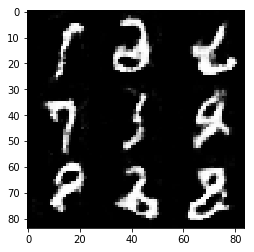

Epoch 3/5... Discriminator Loss: 1.3028... Generator Loss: 0.7727
Epoch 3/5... Discriminator Loss: 1.3351... Generator Loss: 0.6189
Epoch 3/5... Discriminator Loss: 1.3268... Generator Loss: 0.4785
Epoch 3/5... Discriminator Loss: 1.3068... Generator Loss: 0.6512
Epoch 3/5... Discriminator Loss: 1.3990... Generator Loss: 0.4771
Epoch 3/5... Discriminator Loss: 1.4120... Generator Loss: 0.4281
Epoch 3/5... Discriminator Loss: 1.5321... Generator Loss: 0.3674
Epoch 3/5... Discriminator Loss: 1.3415... Generator Loss: 0.4627
Epoch 3/5... Discriminator Loss: 1.4134... Generator Loss: 0.4610
Epoch 3/5... Discriminator Loss: 1.2413... Generator Loss: 0.6747


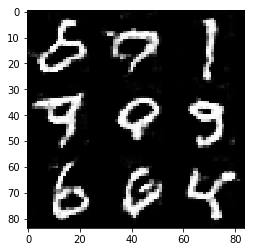

Epoch 3/5... Discriminator Loss: 1.4295... Generator Loss: 0.4133
Epoch 3/5... Discriminator Loss: 1.3404... Generator Loss: 0.5718
Epoch 3/5... Discriminator Loss: 1.2039... Generator Loss: 0.8106
Epoch 3/5... Discriminator Loss: 1.3820... Generator Loss: 0.4712
Epoch 3/5... Discriminator Loss: 1.3642... Generator Loss: 0.5561
Epoch 3/5... Discriminator Loss: 1.3086... Generator Loss: 0.8061
Epoch 3/5... Discriminator Loss: 1.3969... Generator Loss: 0.4649
Epoch 3/5... Discriminator Loss: 1.2537... Generator Loss: 0.6093
Epoch 3/5... Discriminator Loss: 1.3184... Generator Loss: 0.7177
Epoch 3/5... Discriminator Loss: 1.6050... Generator Loss: 0.3162


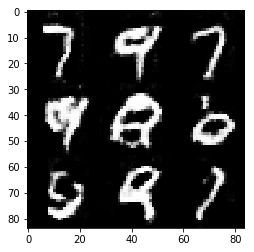

Epoch 3/5... Discriminator Loss: 1.8249... Generator Loss: 0.2255
Epoch 3/5... Discriminator Loss: 1.3792... Generator Loss: 0.5683
Epoch 3/5... Discriminator Loss: 1.2985... Generator Loss: 0.5728
Epoch 3/5... Discriminator Loss: 1.2695... Generator Loss: 0.6821
Epoch 3/5... Discriminator Loss: 1.3436... Generator Loss: 0.8986
Epoch 3/5... Discriminator Loss: 1.2770... Generator Loss: 0.7803
Epoch 3/5... Discriminator Loss: 1.3105... Generator Loss: 0.5168
Epoch 3/5... Discriminator Loss: 1.3281... Generator Loss: 0.5566
Epoch 3/5... Discriminator Loss: 1.3458... Generator Loss: 0.7123
Epoch 3/5... Discriminator Loss: 1.2973... Generator Loss: 0.7073


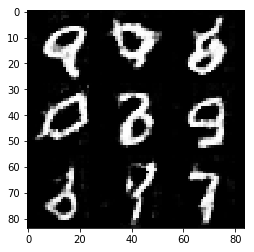

Epoch 3/5... Discriminator Loss: 1.2563... Generator Loss: 0.6956
Epoch 3/5... Discriminator Loss: 1.2640... Generator Loss: 0.6486
Epoch 3/5... Discriminator Loss: 1.2710... Generator Loss: 0.7137
Epoch 3/5... Discriminator Loss: 1.2918... Generator Loss: 0.7995
Epoch 3/5... Discriminator Loss: 1.3067... Generator Loss: 0.6053
Epoch 3/5... Discriminator Loss: 1.3692... Generator Loss: 0.7548
Epoch 3/5... Discriminator Loss: 1.5380... Generator Loss: 0.3342
Epoch 3/5... Discriminator Loss: 1.4127... Generator Loss: 0.4082
Epoch 3/5... Discriminator Loss: 1.2905... Generator Loss: 0.6792
Epoch 3/5... Discriminator Loss: 1.3109... Generator Loss: 0.4758


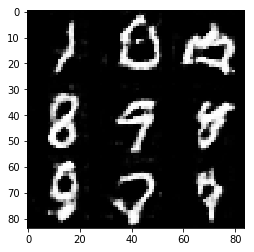

Epoch 3/5... Discriminator Loss: 1.2425... Generator Loss: 0.6607
Epoch 3/5... Discriminator Loss: 1.2651... Generator Loss: 0.5391
Epoch 3/5... Discriminator Loss: 1.4303... Generator Loss: 0.4189
Epoch 3/5... Discriminator Loss: 1.3517... Generator Loss: 0.4641
Epoch 3/5... Discriminator Loss: 1.8029... Generator Loss: 0.2244
Epoch 3/5... Discriminator Loss: 1.2170... Generator Loss: 1.1214
Epoch 3/5... Discriminator Loss: 1.2613... Generator Loss: 0.8002
Epoch 3/5... Discriminator Loss: 1.2063... Generator Loss: 0.6916
Epoch 3/5... Discriminator Loss: 1.2848... Generator Loss: 0.6449
Epoch 3/5... Discriminator Loss: 1.2479... Generator Loss: 0.7483


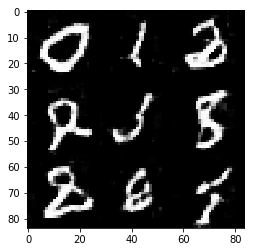

Epoch 3/5... Discriminator Loss: 1.3007... Generator Loss: 0.6508
Epoch 3/5... Discriminator Loss: 1.3052... Generator Loss: 0.6636
Epoch 3/5... Discriminator Loss: 1.3866... Generator Loss: 1.0781
Epoch 3/5... Discriminator Loss: 1.4122... Generator Loss: 0.4243
Epoch 3/5... Discriminator Loss: 1.3266... Generator Loss: 0.5986
Epoch 3/5... Discriminator Loss: 1.2127... Generator Loss: 0.7332
Epoch 3/5... Discriminator Loss: 1.2320... Generator Loss: 0.6546
Epoch 3/5... Discriminator Loss: 1.2545... Generator Loss: 0.5682
Epoch 3/5... Discriminator Loss: 1.3238... Generator Loss: 0.5506
Epoch 3/5... Discriminator Loss: 1.2828... Generator Loss: 0.5325


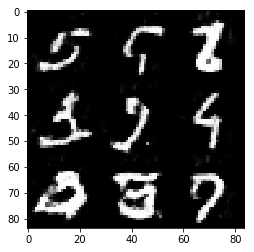

Epoch 3/5... Discriminator Loss: 1.3071... Generator Loss: 0.5567
Epoch 3/5... Discriminator Loss: 1.4000... Generator Loss: 0.4757
Epoch 3/5... Discriminator Loss: 1.3464... Generator Loss: 0.4833
Epoch 3/5... Discriminator Loss: 1.3288... Generator Loss: 0.5205
Epoch 3/5... Discriminator Loss: 1.3463... Generator Loss: 0.5917
Epoch 3/5... Discriminator Loss: 1.3889... Generator Loss: 0.4342
Epoch 3/5... Discriminator Loss: 1.3113... Generator Loss: 0.5162
Epoch 3/5... Discriminator Loss: 1.4880... Generator Loss: 0.3670
Epoch 3/5... Discriminator Loss: 1.2691... Generator Loss: 0.8293
Epoch 3/5... Discriminator Loss: 1.2356... Generator Loss: 1.1528


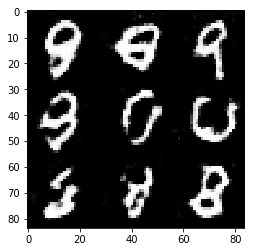

Epoch 3/5... Discriminator Loss: 1.4336... Generator Loss: 0.3894
Epoch 3/5... Discriminator Loss: 1.3608... Generator Loss: 0.4973
Epoch 3/5... Discriminator Loss: 1.3673... Generator Loss: 0.4660
Epoch 3/5... Discriminator Loss: 1.2065... Generator Loss: 0.7622
Epoch 3/5... Discriminator Loss: 1.5211... Generator Loss: 0.3662
Epoch 3/5... Discriminator Loss: 1.2520... Generator Loss: 0.5789
Epoch 3/5... Discriminator Loss: 1.2725... Generator Loss: 0.7837
Epoch 3/5... Discriminator Loss: 1.2484... Generator Loss: 0.6528
Epoch 3/5... Discriminator Loss: 1.3769... Generator Loss: 0.4544
Epoch 3/5... Discriminator Loss: 1.3662... Generator Loss: 0.7502


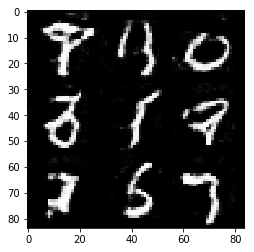

Epoch 3/5... Discriminator Loss: 1.4831... Generator Loss: 0.8637
Epoch 3/5... Discriminator Loss: 1.6292... Generator Loss: 0.4451
Epoch 3/5... Discriminator Loss: 1.3751... Generator Loss: 0.9505
Epoch 3/5... Discriminator Loss: 1.4161... Generator Loss: 0.4507
Epoch 3/5... Discriminator Loss: 1.3504... Generator Loss: 0.5450
Epoch 3/5... Discriminator Loss: 1.1902... Generator Loss: 0.7771
Epoch 3/5... Discriminator Loss: 1.2562... Generator Loss: 0.7023
Epoch 3/5... Discriminator Loss: 1.2100... Generator Loss: 0.6380
Epoch 3/5... Discriminator Loss: 1.3128... Generator Loss: 0.5904
Epoch 3/5... Discriminator Loss: 1.2273... Generator Loss: 0.6539


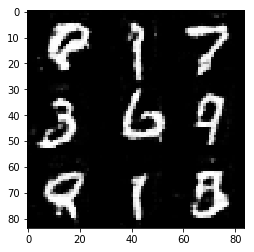

Epoch 3/5... Discriminator Loss: 1.2081... Generator Loss: 0.8334
Epoch 3/5... Discriminator Loss: 1.2820... Generator Loss: 0.5381
Epoch 3/5... Discriminator Loss: 1.3445... Generator Loss: 0.4550
Epoch 3/5... Discriminator Loss: 1.2428... Generator Loss: 0.6483
Epoch 3/5... Discriminator Loss: 1.2221... Generator Loss: 0.7221
Epoch 3/5... Discriminator Loss: 1.2886... Generator Loss: 0.6632
Epoch 3/5... Discriminator Loss: 1.4197... Generator Loss: 0.4210
Epoch 3/5... Discriminator Loss: 1.2155... Generator Loss: 0.5395
Epoch 3/5... Discriminator Loss: 1.2913... Generator Loss: 0.5490
Epoch 3/5... Discriminator Loss: 1.1901... Generator Loss: 0.7822


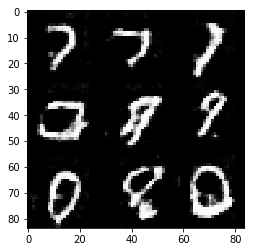

Epoch 3/5... Discriminator Loss: 1.5230... Generator Loss: 0.8081
Epoch 4/5... Discriminator Loss: 1.3004... Generator Loss: 0.7835
Epoch 4/5... Discriminator Loss: 1.2718... Generator Loss: 0.5223
Epoch 4/5... Discriminator Loss: 1.2327... Generator Loss: 0.6582
Epoch 4/5... Discriminator Loss: 1.2184... Generator Loss: 0.6504
Epoch 4/5... Discriminator Loss: 1.2728... Generator Loss: 0.7043
Epoch 4/5... Discriminator Loss: 1.2461... Generator Loss: 0.6577
Epoch 4/5... Discriminator Loss: 1.2293... Generator Loss: 0.6648
Epoch 4/5... Discriminator Loss: 1.3186... Generator Loss: 0.8317
Epoch 4/5... Discriminator Loss: 1.2675... Generator Loss: 0.5444


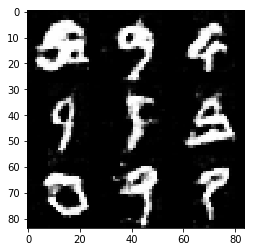

Epoch 4/5... Discriminator Loss: 1.4563... Generator Loss: 0.3509
Epoch 4/5... Discriminator Loss: 1.8622... Generator Loss: 0.2170
Epoch 4/5... Discriminator Loss: 1.6675... Generator Loss: 0.7056
Epoch 4/5... Discriminator Loss: 1.1487... Generator Loss: 0.7570
Epoch 4/5... Discriminator Loss: 1.3035... Generator Loss: 0.5149
Epoch 4/5... Discriminator Loss: 1.2975... Generator Loss: 0.5613
Epoch 4/5... Discriminator Loss: 1.3359... Generator Loss: 0.4612
Epoch 4/5... Discriminator Loss: 1.1418... Generator Loss: 0.8591
Epoch 4/5... Discriminator Loss: 1.2356... Generator Loss: 0.6949
Epoch 4/5... Discriminator Loss: 1.2528... Generator Loss: 0.5463


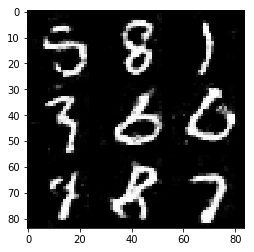

Epoch 4/5... Discriminator Loss: 1.2333... Generator Loss: 0.8031
Epoch 4/5... Discriminator Loss: 1.3247... Generator Loss: 0.6694
Epoch 4/5... Discriminator Loss: 1.2685... Generator Loss: 0.6869
Epoch 4/5... Discriminator Loss: 1.3898... Generator Loss: 0.4794
Epoch 4/5... Discriminator Loss: 1.2741... Generator Loss: 0.5393
Epoch 4/5... Discriminator Loss: 1.2334... Generator Loss: 0.5330
Epoch 4/5... Discriminator Loss: 1.2285... Generator Loss: 0.5012
Epoch 4/5... Discriminator Loss: 1.6406... Generator Loss: 0.3256
Epoch 4/5... Discriminator Loss: 1.3475... Generator Loss: 0.5064
Epoch 4/5... Discriminator Loss: 1.2319... Generator Loss: 0.7554


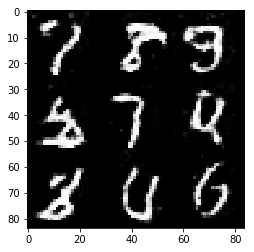

Epoch 4/5... Discriminator Loss: 1.2250... Generator Loss: 0.6195
Epoch 4/5... Discriminator Loss: 1.2074... Generator Loss: 0.7589
Epoch 4/5... Discriminator Loss: 1.2456... Generator Loss: 0.8713
Epoch 4/5... Discriminator Loss: 1.2586... Generator Loss: 0.5912
Epoch 4/5... Discriminator Loss: 1.3450... Generator Loss: 0.4435
Epoch 4/5... Discriminator Loss: 1.3615... Generator Loss: 0.4619
Epoch 4/5... Discriminator Loss: 1.4140... Generator Loss: 0.4265
Epoch 4/5... Discriminator Loss: 1.3237... Generator Loss: 0.5768
Epoch 4/5... Discriminator Loss: 1.2744... Generator Loss: 0.5758
Epoch 4/5... Discriminator Loss: 1.2369... Generator Loss: 0.6149


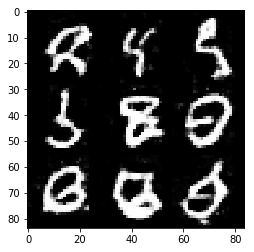

Epoch 4/5... Discriminator Loss: 1.3246... Generator Loss: 0.5275
Epoch 4/5... Discriminator Loss: 1.7112... Generator Loss: 1.3395
Epoch 4/5... Discriminator Loss: 1.3104... Generator Loss: 0.6746
Epoch 4/5... Discriminator Loss: 1.2434... Generator Loss: 0.6083
Epoch 4/5... Discriminator Loss: 1.2823... Generator Loss: 0.5677
Epoch 4/5... Discriminator Loss: 1.2564... Generator Loss: 0.7999
Epoch 4/5... Discriminator Loss: 1.1984... Generator Loss: 0.7675
Epoch 4/5... Discriminator Loss: 1.2162... Generator Loss: 0.6120
Epoch 4/5... Discriminator Loss: 1.2323... Generator Loss: 0.8617
Epoch 4/5... Discriminator Loss: 1.3852... Generator Loss: 0.5305


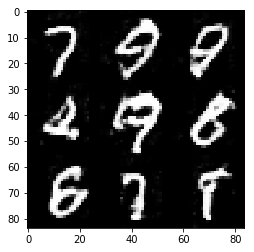

Epoch 4/5... Discriminator Loss: 1.2059... Generator Loss: 0.6964
Epoch 4/5... Discriminator Loss: 1.2032... Generator Loss: 0.8161
Epoch 4/5... Discriminator Loss: 1.3256... Generator Loss: 0.8787
Epoch 4/5... Discriminator Loss: 1.3737... Generator Loss: 0.4545
Epoch 4/5... Discriminator Loss: 1.2566... Generator Loss: 0.5640
Epoch 4/5... Discriminator Loss: 1.3555... Generator Loss: 0.5012
Epoch 4/5... Discriminator Loss: 1.4914... Generator Loss: 0.3448
Epoch 4/5... Discriminator Loss: 1.2198... Generator Loss: 0.6312
Epoch 4/5... Discriminator Loss: 1.2296... Generator Loss: 0.6035
Epoch 4/5... Discriminator Loss: 1.2196... Generator Loss: 0.8043


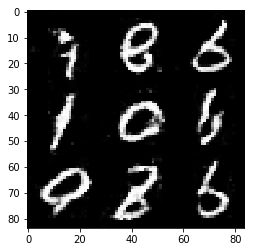

Epoch 4/5... Discriminator Loss: 1.3290... Generator Loss: 0.5694
Epoch 4/5... Discriminator Loss: 1.5307... Generator Loss: 0.3185
Epoch 4/5... Discriminator Loss: 1.5942... Generator Loss: 0.2820
Epoch 4/5... Discriminator Loss: 1.3722... Generator Loss: 0.4240
Epoch 4/5... Discriminator Loss: 1.1769... Generator Loss: 0.6462
Epoch 4/5... Discriminator Loss: 1.2629... Generator Loss: 0.6540
Epoch 4/5... Discriminator Loss: 1.2734... Generator Loss: 0.6924
Epoch 4/5... Discriminator Loss: 1.2513... Generator Loss: 0.6913
Epoch 4/5... Discriminator Loss: 1.1737... Generator Loss: 0.6765
Epoch 4/5... Discriminator Loss: 1.4042... Generator Loss: 0.3804


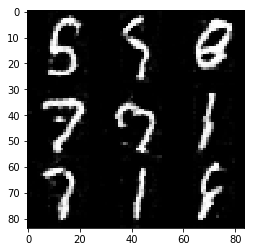

Epoch 4/5... Discriminator Loss: 1.3158... Generator Loss: 0.4834
Epoch 4/5... Discriminator Loss: 1.3105... Generator Loss: 0.5036
Epoch 4/5... Discriminator Loss: 1.1692... Generator Loss: 0.7171
Epoch 4/5... Discriminator Loss: 1.3596... Generator Loss: 0.7544
Epoch 4/5... Discriminator Loss: 1.2094... Generator Loss: 0.5838
Epoch 4/5... Discriminator Loss: 1.2917... Generator Loss: 0.8348
Epoch 4/5... Discriminator Loss: 1.2614... Generator Loss: 0.7076
Epoch 4/5... Discriminator Loss: 1.2271... Generator Loss: 0.9561
Epoch 4/5... Discriminator Loss: 1.5258... Generator Loss: 0.6262
Epoch 4/5... Discriminator Loss: 1.4107... Generator Loss: 0.4533


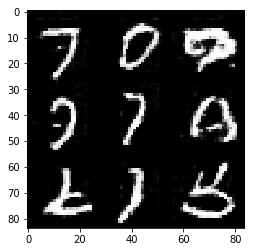

Epoch 4/5... Discriminator Loss: 1.2086... Generator Loss: 0.6422
Epoch 4/5... Discriminator Loss: 1.3555... Generator Loss: 0.4939
Epoch 4/5... Discriminator Loss: 1.3512... Generator Loss: 0.4731
Epoch 4/5... Discriminator Loss: 1.3322... Generator Loss: 0.4385
Epoch 4/5... Discriminator Loss: 1.5700... Generator Loss: 0.3164
Epoch 4/5... Discriminator Loss: 1.8759... Generator Loss: 0.6847
Epoch 4/5... Discriminator Loss: 1.4293... Generator Loss: 0.6399
Epoch 4/5... Discriminator Loss: 1.2170... Generator Loss: 0.7032
Epoch 4/5... Discriminator Loss: 1.3842... Generator Loss: 0.4672
Epoch 4/5... Discriminator Loss: 1.2780... Generator Loss: 0.6086


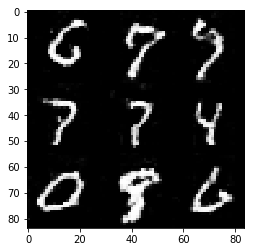

Epoch 4/5... Discriminator Loss: 1.2084... Generator Loss: 0.7536
Epoch 4/5... Discriminator Loss: 1.4508... Generator Loss: 0.4013
Epoch 4/5... Discriminator Loss: 1.2372... Generator Loss: 0.6483
Epoch 4/5... Discriminator Loss: 1.3979... Generator Loss: 0.4600
Epoch 4/5... Discriminator Loss: 1.1892... Generator Loss: 0.6011
Epoch 4/5... Discriminator Loss: 1.3858... Generator Loss: 0.4386
Epoch 4/5... Discriminator Loss: 1.2098... Generator Loss: 0.7572
Epoch 4/5... Discriminator Loss: 1.3522... Generator Loss: 0.4757
Epoch 4/5... Discriminator Loss: 1.2293... Generator Loss: 0.6123
Epoch 4/5... Discriminator Loss: 1.1479... Generator Loss: 0.7952


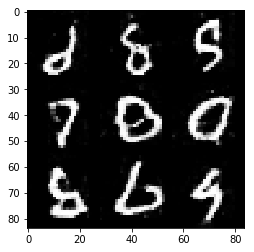

Epoch 4/5... Discriminator Loss: 1.2294... Generator Loss: 0.7866
Epoch 4/5... Discriminator Loss: 1.2338... Generator Loss: 0.7995
Epoch 4/5... Discriminator Loss: 1.1192... Generator Loss: 0.7375
Epoch 4/5... Discriminator Loss: 1.1463... Generator Loss: 0.7305
Epoch 4/5... Discriminator Loss: 1.1871... Generator Loss: 0.7046
Epoch 4/5... Discriminator Loss: 1.3588... Generator Loss: 0.9544
Epoch 4/5... Discriminator Loss: 1.2325... Generator Loss: 0.7164
Epoch 4/5... Discriminator Loss: 1.2457... Generator Loss: 0.7064
Epoch 4/5... Discriminator Loss: 1.2284... Generator Loss: 0.6845
Epoch 4/5... Discriminator Loss: 1.2942... Generator Loss: 0.5173


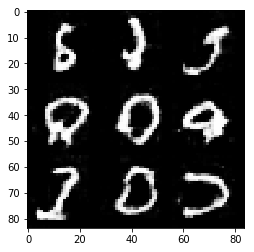

Epoch 4/5... Discriminator Loss: 1.3711... Generator Loss: 1.3120
Epoch 4/5... Discriminator Loss: 1.1952... Generator Loss: 0.9394
Epoch 4/5... Discriminator Loss: 1.3770... Generator Loss: 0.4530
Epoch 4/5... Discriminator Loss: 1.3374... Generator Loss: 0.5207
Epoch 4/5... Discriminator Loss: 1.2948... Generator Loss: 0.4763
Epoch 4/5... Discriminator Loss: 1.3689... Generator Loss: 0.4555
Epoch 4/5... Discriminator Loss: 1.1284... Generator Loss: 0.7787
Epoch 4/5... Discriminator Loss: 1.4210... Generator Loss: 0.4453
Epoch 5/5... Discriminator Loss: 1.2513... Generator Loss: 0.6053
Epoch 5/5... Discriminator Loss: 1.1839... Generator Loss: 0.6808


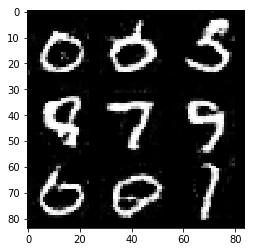

Epoch 5/5... Discriminator Loss: 1.3116... Generator Loss: 0.5188
Epoch 5/5... Discriminator Loss: 1.3154... Generator Loss: 0.4765
Epoch 5/5... Discriminator Loss: 1.2706... Generator Loss: 0.7269
Epoch 5/5... Discriminator Loss: 1.3609... Generator Loss: 0.8519
Epoch 5/5... Discriminator Loss: 1.1820... Generator Loss: 0.7609
Epoch 5/5... Discriminator Loss: 1.3508... Generator Loss: 0.5099
Epoch 5/5... Discriminator Loss: 1.3153... Generator Loss: 0.4975
Epoch 5/5... Discriminator Loss: 1.5630... Generator Loss: 0.3203
Epoch 5/5... Discriminator Loss: 1.4702... Generator Loss: 0.3387
Epoch 5/5... Discriminator Loss: 1.8403... Generator Loss: 0.6947


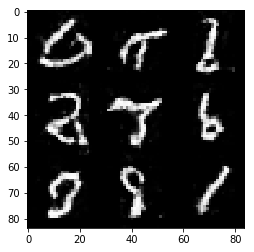

Epoch 5/5... Discriminator Loss: 1.4997... Generator Loss: 0.5690
Epoch 5/5... Discriminator Loss: 1.1663... Generator Loss: 0.7308
Epoch 5/5... Discriminator Loss: 1.4900... Generator Loss: 0.3853
Epoch 5/5... Discriminator Loss: 1.2448... Generator Loss: 0.6407
Epoch 5/5... Discriminator Loss: 1.1642... Generator Loss: 0.7947
Epoch 5/5... Discriminator Loss: 1.2328... Generator Loss: 0.5981
Epoch 5/5... Discriminator Loss: 1.2116... Generator Loss: 0.7158
Epoch 5/5... Discriminator Loss: 1.4251... Generator Loss: 0.4101
Epoch 5/5... Discriminator Loss: 1.3811... Generator Loss: 0.4912
Epoch 5/5... Discriminator Loss: 1.1881... Generator Loss: 0.6098


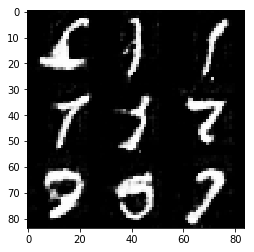

Epoch 5/5... Discriminator Loss: 1.3149... Generator Loss: 0.5198
Epoch 5/5... Discriminator Loss: 1.2373... Generator Loss: 0.5675
Epoch 5/5... Discriminator Loss: 1.1862... Generator Loss: 0.6748
Epoch 5/5... Discriminator Loss: 1.2434... Generator Loss: 0.4922
Epoch 5/5... Discriminator Loss: 1.2947... Generator Loss: 0.6133
Epoch 5/5... Discriminator Loss: 1.3515... Generator Loss: 0.4474
Epoch 5/5... Discriminator Loss: 1.2096... Generator Loss: 0.7661
Epoch 5/5... Discriminator Loss: 1.3072... Generator Loss: 0.7226
Epoch 5/5... Discriminator Loss: 1.1999... Generator Loss: 0.8164
Epoch 5/5... Discriminator Loss: 1.1628... Generator Loss: 0.7974


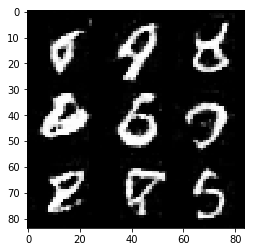

Epoch 5/5... Discriminator Loss: 1.3154... Generator Loss: 0.4496
Epoch 5/5... Discriminator Loss: 1.3221... Generator Loss: 0.4746
Epoch 5/5... Discriminator Loss: 1.3414... Generator Loss: 0.4979
Epoch 5/5... Discriminator Loss: 1.4389... Generator Loss: 0.4107
Epoch 5/5... Discriminator Loss: 1.2117... Generator Loss: 0.9160
Epoch 5/5... Discriminator Loss: 1.3923... Generator Loss: 0.7422
Epoch 5/5... Discriminator Loss: 1.1100... Generator Loss: 0.8393
Epoch 5/5... Discriminator Loss: 1.3986... Generator Loss: 0.3823
Epoch 5/5... Discriminator Loss: 1.3606... Generator Loss: 0.4273
Epoch 5/5... Discriminator Loss: 1.3934... Generator Loss: 0.4719


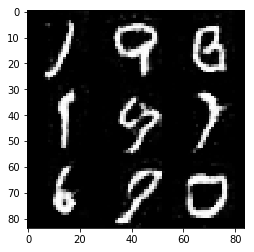

Epoch 5/5... Discriminator Loss: 1.2327... Generator Loss: 0.5862
Epoch 5/5... Discriminator Loss: 1.4677... Generator Loss: 1.1024
Epoch 5/5... Discriminator Loss: 1.3379... Generator Loss: 0.4898
Epoch 5/5... Discriminator Loss: 1.2154... Generator Loss: 0.6027
Epoch 5/5... Discriminator Loss: 1.3298... Generator Loss: 0.4768
Epoch 5/5... Discriminator Loss: 1.2469... Generator Loss: 0.7116
Epoch 5/5... Discriminator Loss: 1.1825... Generator Loss: 0.7578
Epoch 5/5... Discriminator Loss: 1.2139... Generator Loss: 0.7120
Epoch 5/5... Discriminator Loss: 1.1956... Generator Loss: 0.9315
Epoch 5/5... Discriminator Loss: 1.2533... Generator Loss: 1.0257


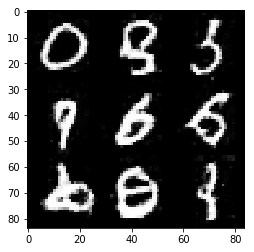

Epoch 5/5... Discriminator Loss: 1.2964... Generator Loss: 0.4941
Epoch 5/5... Discriminator Loss: 1.1922... Generator Loss: 0.8989
Epoch 5/5... Discriminator Loss: 1.2891... Generator Loss: 0.8711
Epoch 5/5... Discriminator Loss: 1.1026... Generator Loss: 0.6452
Epoch 5/5... Discriminator Loss: 1.2466... Generator Loss: 0.5184
Epoch 5/5... Discriminator Loss: 1.1448... Generator Loss: 0.7707
Epoch 5/5... Discriminator Loss: 1.2244... Generator Loss: 1.1086
Epoch 5/5... Discriminator Loss: 1.1331... Generator Loss: 0.8775
Epoch 5/5... Discriminator Loss: 1.1987... Generator Loss: 0.6918
Epoch 5/5... Discriminator Loss: 1.2320... Generator Loss: 0.6483


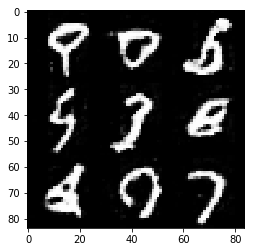

Epoch 5/5... Discriminator Loss: 1.2342... Generator Loss: 0.7684
Epoch 5/5... Discriminator Loss: 1.4638... Generator Loss: 0.3464
Epoch 5/5... Discriminator Loss: 1.2088... Generator Loss: 0.6903
Epoch 5/5... Discriminator Loss: 1.1788... Generator Loss: 0.6730
Epoch 5/5... Discriminator Loss: 1.3027... Generator Loss: 0.7090
Epoch 5/5... Discriminator Loss: 1.2061... Generator Loss: 0.9942
Epoch 5/5... Discriminator Loss: 1.3051... Generator Loss: 0.7202
Epoch 5/5... Discriminator Loss: 1.2723... Generator Loss: 0.5006
Epoch 5/5... Discriminator Loss: 1.3094... Generator Loss: 0.4755
Epoch 5/5... Discriminator Loss: 1.1696... Generator Loss: 0.6451


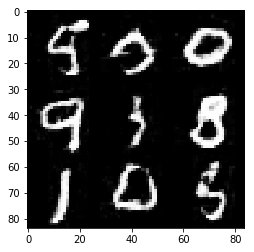

Epoch 5/5... Discriminator Loss: 1.1390... Generator Loss: 0.7647
Epoch 5/5... Discriminator Loss: 1.2380... Generator Loss: 0.5466
Epoch 5/5... Discriminator Loss: 1.2369... Generator Loss: 0.6887
Epoch 5/5... Discriminator Loss: 1.3103... Generator Loss: 0.5925
Epoch 5/5... Discriminator Loss: 1.2680... Generator Loss: 0.9050
Epoch 5/5... Discriminator Loss: 1.1994... Generator Loss: 0.7186
Epoch 5/5... Discriminator Loss: 1.3725... Generator Loss: 0.4515
Epoch 5/5... Discriminator Loss: 1.2814... Generator Loss: 0.5034
Epoch 5/5... Discriminator Loss: 1.3648... Generator Loss: 0.5206
Epoch 5/5... Discriminator Loss: 1.3809... Generator Loss: 0.4368


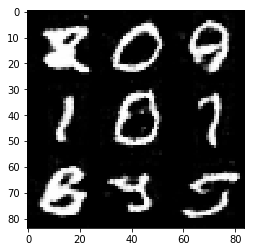

Epoch 5/5... Discriminator Loss: 1.3002... Generator Loss: 0.5474
Epoch 5/5... Discriminator Loss: 1.3149... Generator Loss: 0.4541
Epoch 5/5... Discriminator Loss: 1.2193... Generator Loss: 1.4434
Epoch 5/5... Discriminator Loss: 1.1914... Generator Loss: 0.8821
Epoch 5/5... Discriminator Loss: 1.3677... Generator Loss: 0.4061
Epoch 5/5... Discriminator Loss: 1.2727... Generator Loss: 0.5731
Epoch 5/5... Discriminator Loss: 1.3395... Generator Loss: 0.5575
Epoch 5/5... Discriminator Loss: 1.2001... Generator Loss: 0.8239
Epoch 5/5... Discriminator Loss: 1.4516... Generator Loss: 0.5072
Epoch 5/5... Discriminator Loss: 1.3365... Generator Loss: 0.4500


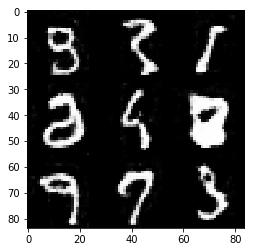

Epoch 5/5... Discriminator Loss: 1.3231... Generator Loss: 0.5112
Epoch 5/5... Discriminator Loss: 1.2197... Generator Loss: 0.6587
Epoch 5/5... Discriminator Loss: 1.2094... Generator Loss: 0.7470
Epoch 5/5... Discriminator Loss: 1.8577... Generator Loss: 1.3311
Epoch 5/5... Discriminator Loss: 1.7117... Generator Loss: 0.3436
Epoch 5/5... Discriminator Loss: 1.4850... Generator Loss: 0.7035
Epoch 5/5... Discriminator Loss: 1.2101... Generator Loss: 0.7322
Epoch 5/5... Discriminator Loss: 1.2340... Generator Loss: 0.7162
Epoch 5/5... Discriminator Loss: 1.2210... Generator Loss: 0.6807
Epoch 5/5... Discriminator Loss: 1.1391... Generator Loss: 0.6905


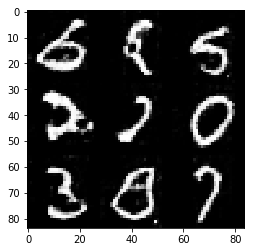

Epoch 5/5... Discriminator Loss: 1.1187... Generator Loss: 0.7696
Epoch 5/5... Discriminator Loss: 1.3367... Generator Loss: 0.5320
Epoch 5/5... Discriminator Loss: 1.2946... Generator Loss: 0.6503
Epoch 5/5... Discriminator Loss: 1.1957... Generator Loss: 0.6847
Epoch 5/5... Discriminator Loss: 1.1943... Generator Loss: 0.9058
Epoch 5/5... Discriminator Loss: 1.1518... Generator Loss: 0.6543
Epoch 5/5... Discriminator Loss: 1.2053... Generator Loss: 0.5840
Epoch 5/5... Discriminator Loss: 1.1386... Generator Loss: 0.9327
Epoch 5/5... Discriminator Loss: 1.1881... Generator Loss: 0.6042
Epoch 5/5... Discriminator Loss: 1.2869... Generator Loss: 0.6345


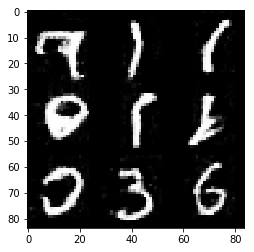

Epoch 5/5... Discriminator Loss: 1.5946... Generator Loss: 0.3116
Epoch 5/5... Discriminator Loss: 1.3634... Generator Loss: 0.3916
Epoch 5/5... Discriminator Loss: 1.3562... Generator Loss: 0.4131
Epoch 5/5... Discriminator Loss: 1.1609... Generator Loss: 0.6486
Epoch 5/5... Discriminator Loss: 1.3527... Generator Loss: 0.5326
-------Done-------


In [12]:
batch_size = 128
z_dim = 200
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 5.5456... Generator Loss: 0.0078
Epoch 1/5... Discriminator Loss: 5.0598... Generator Loss: 0.0146
Epoch 1/5... Discriminator Loss: 3.9753... Generator Loss: 0.0740
Epoch 1/5... Discriminator Loss: 3.8723... Generator Loss: 0.1905
Epoch 1/5... Discriminator Loss: 3.0583... Generator Loss: 0.4933
Epoch 1/5... Discriminator Loss: 2.5308... Generator Loss: 0.6966
Epoch 1/5... Discriminator Loss: 2.3367... Generator Loss: 0.6699
Epoch 1/5... Discriminator Loss: 2.2866... Generator Loss: 0.6561
Epoch 1/5... Discriminator Loss: 1.9035... Generator Loss: 0.6272
Epoch 1/5... Discriminator Loss: 2.2904... Generator Loss: 0.3871


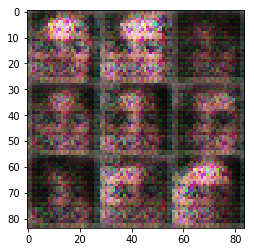

Epoch 1/5... Discriminator Loss: 2.4016... Generator Loss: 0.4010
Epoch 1/5... Discriminator Loss: 2.2389... Generator Loss: 0.3237
Epoch 1/5... Discriminator Loss: 2.0744... Generator Loss: 0.4194
Epoch 1/5... Discriminator Loss: 2.2069... Generator Loss: 0.3274
Epoch 1/5... Discriminator Loss: 2.1764... Generator Loss: 0.4342
Epoch 1/5... Discriminator Loss: 1.7637... Generator Loss: 0.4268
Epoch 1/5... Discriminator Loss: 1.9803... Generator Loss: 0.4478
Epoch 1/5... Discriminator Loss: 1.8833... Generator Loss: 0.4877
Epoch 1/5... Discriminator Loss: 1.7826... Generator Loss: 0.5138
Epoch 1/5... Discriminator Loss: 2.1280... Generator Loss: 0.4153


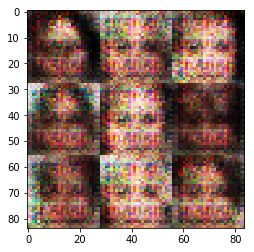

Epoch 1/5... Discriminator Loss: 1.8166... Generator Loss: 0.4748
Epoch 1/5... Discriminator Loss: 1.7872... Generator Loss: 0.5130
Epoch 1/5... Discriminator Loss: 1.9392... Generator Loss: 0.4516
Epoch 1/5... Discriminator Loss: 1.9639... Generator Loss: 0.4566
Epoch 1/5... Discriminator Loss: 1.7967... Generator Loss: 0.5056
Epoch 1/5... Discriminator Loss: 1.8183... Generator Loss: 0.5074
Epoch 1/5... Discriminator Loss: 1.8650... Generator Loss: 0.5214
Epoch 1/5... Discriminator Loss: 1.8331... Generator Loss: 0.5289
Epoch 1/5... Discriminator Loss: 1.9835... Generator Loss: 0.4517
Epoch 1/5... Discriminator Loss: 1.7936... Generator Loss: 0.4472


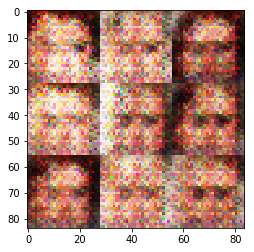

Epoch 1/5... Discriminator Loss: 2.2470... Generator Loss: 0.3921
Epoch 1/5... Discriminator Loss: 1.8150... Generator Loss: 0.4327
Epoch 1/5... Discriminator Loss: 1.6977... Generator Loss: 0.5097
Epoch 1/5... Discriminator Loss: 1.9749... Generator Loss: 0.4090
Epoch 1/5... Discriminator Loss: 1.7615... Generator Loss: 0.5161
Epoch 1/5... Discriminator Loss: 1.8771... Generator Loss: 0.5027
Epoch 1/5... Discriminator Loss: 1.6848... Generator Loss: 0.5168
Epoch 1/5... Discriminator Loss: 1.6390... Generator Loss: 0.5100
Epoch 1/5... Discriminator Loss: 1.7868... Generator Loss: 0.5569
Epoch 1/5... Discriminator Loss: 1.6350... Generator Loss: 0.4983


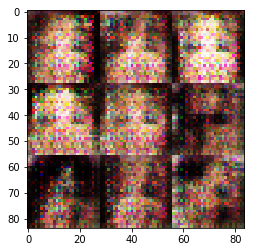

Epoch 1/5... Discriminator Loss: 1.6769... Generator Loss: 0.6154
Epoch 1/5... Discriminator Loss: 1.9744... Generator Loss: 0.4220
Epoch 1/5... Discriminator Loss: 1.5967... Generator Loss: 0.5426
Epoch 1/5... Discriminator Loss: 1.7262... Generator Loss: 0.4654
Epoch 1/5... Discriminator Loss: 1.6146... Generator Loss: 0.5578
Epoch 1/5... Discriminator Loss: 1.6083... Generator Loss: 0.5584
Epoch 1/5... Discriminator Loss: 1.7457... Generator Loss: 0.5042
Epoch 1/5... Discriminator Loss: 1.6491... Generator Loss: 0.5666
Epoch 1/5... Discriminator Loss: 1.7519... Generator Loss: 0.5609
Epoch 1/5... Discriminator Loss: 1.8817... Generator Loss: 0.4466


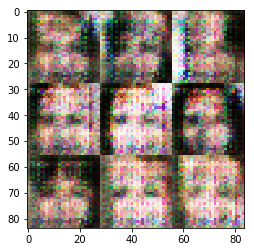

Epoch 1/5... Discriminator Loss: 1.7964... Generator Loss: 0.4796
Epoch 1/5... Discriminator Loss: 1.8777... Generator Loss: 0.4124
Epoch 1/5... Discriminator Loss: 1.6268... Generator Loss: 0.5208
Epoch 1/5... Discriminator Loss: 1.7379... Generator Loss: 0.5720
Epoch 1/5... Discriminator Loss: 1.6986... Generator Loss: 0.4985
Epoch 1/5... Discriminator Loss: 1.7949... Generator Loss: 0.4625
Epoch 1/5... Discriminator Loss: 1.5232... Generator Loss: 0.5991
Epoch 1/5... Discriminator Loss: 1.7911... Generator Loss: 0.4519
Epoch 1/5... Discriminator Loss: 1.8248... Generator Loss: 0.4564
Epoch 1/5... Discriminator Loss: 1.6106... Generator Loss: 0.5230


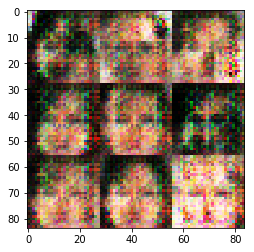

Epoch 1/5... Discriminator Loss: 2.1224... Generator Loss: 0.4179
Epoch 1/5... Discriminator Loss: 1.9737... Generator Loss: 0.4601
Epoch 1/5... Discriminator Loss: 2.0225... Generator Loss: 0.4022
Epoch 1/5... Discriminator Loss: 1.7702... Generator Loss: 0.4698
Epoch 1/5... Discriminator Loss: 1.9366... Generator Loss: 0.6245
Epoch 1/5... Discriminator Loss: 2.0964... Generator Loss: 0.4019
Epoch 1/5... Discriminator Loss: 1.8506... Generator Loss: 0.3959
Epoch 1/5... Discriminator Loss: 1.6972... Generator Loss: 0.4786
Epoch 1/5... Discriminator Loss: 1.6880... Generator Loss: 0.5811
Epoch 1/5... Discriminator Loss: 1.7495... Generator Loss: 0.5281


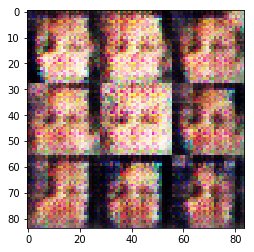

Epoch 1/5... Discriminator Loss: 1.5747... Generator Loss: 0.6096
Epoch 1/5... Discriminator Loss: 1.6141... Generator Loss: 0.5237
Epoch 1/5... Discriminator Loss: 1.5931... Generator Loss: 0.5725
Epoch 1/5... Discriminator Loss: 1.4896... Generator Loss: 0.6675
Epoch 1/5... Discriminator Loss: 1.5834... Generator Loss: 0.6293
Epoch 1/5... Discriminator Loss: 1.7446... Generator Loss: 0.5716
Epoch 1/5... Discriminator Loss: 1.7202... Generator Loss: 0.4914
Epoch 1/5... Discriminator Loss: 1.5433... Generator Loss: 0.6159
Epoch 1/5... Discriminator Loss: 1.5036... Generator Loss: 0.7117
Epoch 1/5... Discriminator Loss: 1.7254... Generator Loss: 0.5457


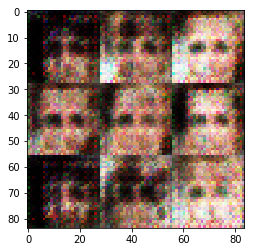

Epoch 1/5... Discriminator Loss: 1.6537... Generator Loss: 0.5886
Epoch 1/5... Discriminator Loss: 1.6356... Generator Loss: 0.5459
Epoch 1/5... Discriminator Loss: 1.7143... Generator Loss: 0.4795
Epoch 1/5... Discriminator Loss: 1.5915... Generator Loss: 0.5910
Epoch 1/5... Discriminator Loss: 1.6438... Generator Loss: 0.6069
Epoch 1/5... Discriminator Loss: 1.5688... Generator Loss: 0.5417
Epoch 1/5... Discriminator Loss: 1.5892... Generator Loss: 0.6131
Epoch 1/5... Discriminator Loss: 1.6369... Generator Loss: 0.5745
Epoch 1/5... Discriminator Loss: 1.5439... Generator Loss: 0.6377
Epoch 1/5... Discriminator Loss: 1.5650... Generator Loss: 0.5977


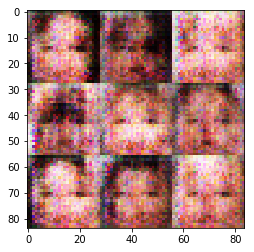

Epoch 1/5... Discriminator Loss: 1.7046... Generator Loss: 0.5160
Epoch 1/5... Discriminator Loss: 1.5865... Generator Loss: 0.5771
Epoch 1/5... Discriminator Loss: 1.5817... Generator Loss: 0.5501
Epoch 1/5... Discriminator Loss: 1.5087... Generator Loss: 0.5750
Epoch 1/5... Discriminator Loss: 1.6477... Generator Loss: 0.5327
Epoch 1/5... Discriminator Loss: 1.5460... Generator Loss: 0.5528
Epoch 1/5... Discriminator Loss: 1.6487... Generator Loss: 0.6471
Epoch 1/5... Discriminator Loss: 1.6338... Generator Loss: 0.5165
Epoch 1/5... Discriminator Loss: 1.6565... Generator Loss: 0.5809
Epoch 1/5... Discriminator Loss: 1.5454... Generator Loss: 0.7024


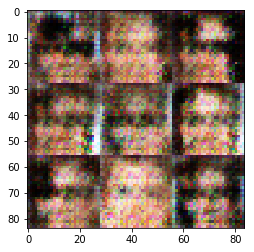

Epoch 1/5... Discriminator Loss: 1.7401... Generator Loss: 0.4965
Epoch 1/5... Discriminator Loss: 1.5078... Generator Loss: 0.6181
Epoch 1/5... Discriminator Loss: 1.6085... Generator Loss: 0.6064
Epoch 1/5... Discriminator Loss: 1.6712... Generator Loss: 0.5886
Epoch 1/5... Discriminator Loss: 1.5790... Generator Loss: 0.5375
Epoch 1/5... Discriminator Loss: 1.5774... Generator Loss: 0.5590
Epoch 1/5... Discriminator Loss: 1.5910... Generator Loss: 0.6133
Epoch 1/5... Discriminator Loss: 1.4746... Generator Loss: 0.6911
Epoch 1/5... Discriminator Loss: 1.6496... Generator Loss: 0.5872
Epoch 1/5... Discriminator Loss: 1.6562... Generator Loss: 0.4826


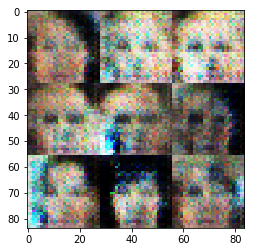

Epoch 1/5... Discriminator Loss: 1.5304... Generator Loss: 0.6044
Epoch 1/5... Discriminator Loss: 1.4606... Generator Loss: 0.7206
Epoch 1/5... Discriminator Loss: 1.5947... Generator Loss: 0.6089
Epoch 1/5... Discriminator Loss: 1.5082... Generator Loss: 0.5914
Epoch 1/5... Discriminator Loss: 1.5641... Generator Loss: 0.6451
Epoch 1/5... Discriminator Loss: 1.5645... Generator Loss: 0.5945
Epoch 1/5... Discriminator Loss: 1.5757... Generator Loss: 0.5375
Epoch 1/5... Discriminator Loss: 1.5096... Generator Loss: 0.6595
Epoch 1/5... Discriminator Loss: 1.6771... Generator Loss: 0.5150
Epoch 1/5... Discriminator Loss: 1.4479... Generator Loss: 0.6606


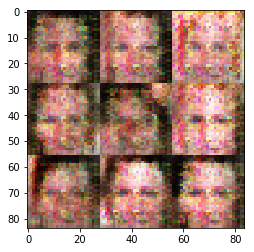

Epoch 1/5... Discriminator Loss: 1.5362... Generator Loss: 0.6008
Epoch 1/5... Discriminator Loss: 1.6010... Generator Loss: 0.5328
Epoch 1/5... Discriminator Loss: 1.5604... Generator Loss: 0.6180
Epoch 1/5... Discriminator Loss: 1.5195... Generator Loss: 0.5586
Epoch 1/5... Discriminator Loss: 1.6990... Generator Loss: 0.4897
Epoch 1/5... Discriminator Loss: 1.6084... Generator Loss: 0.5889
Epoch 1/5... Discriminator Loss: 1.6071... Generator Loss: 0.6004
Epoch 1/5... Discriminator Loss: 1.5633... Generator Loss: 0.5633
Epoch 1/5... Discriminator Loss: 1.4947... Generator Loss: 0.6126
Epoch 1/5... Discriminator Loss: 1.6571... Generator Loss: 0.5682


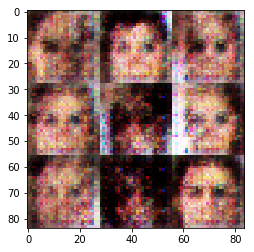

Epoch 1/5... Discriminator Loss: 1.5003... Generator Loss: 0.6839
Epoch 1/5... Discriminator Loss: 1.5123... Generator Loss: 0.6124
Epoch 1/5... Discriminator Loss: 1.4842... Generator Loss: 0.5521
Epoch 1/5... Discriminator Loss: 1.5838... Generator Loss: 0.5764
Epoch 1/5... Discriminator Loss: 1.6254... Generator Loss: 0.5634
Epoch 1/5... Discriminator Loss: 1.4201... Generator Loss: 0.6563
Epoch 1/5... Discriminator Loss: 1.5586... Generator Loss: 0.5862
Epoch 1/5... Discriminator Loss: 1.6737... Generator Loss: 0.5215
Epoch 1/5... Discriminator Loss: 1.7372... Generator Loss: 0.5067
Epoch 1/5... Discriminator Loss: 1.6535... Generator Loss: 0.5475


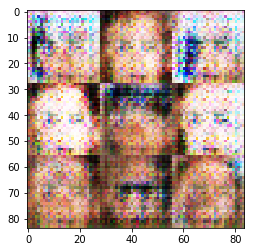

Epoch 1/5... Discriminator Loss: 1.5205... Generator Loss: 0.5700
Epoch 1/5... Discriminator Loss: 1.6003... Generator Loss: 0.5665
Epoch 1/5... Discriminator Loss: 1.5613... Generator Loss: 0.6906
Epoch 1/5... Discriminator Loss: 1.5924... Generator Loss: 0.6002
Epoch 1/5... Discriminator Loss: 1.4693... Generator Loss: 0.6915
Epoch 1/5... Discriminator Loss: 1.5712... Generator Loss: 0.5599
Epoch 1/5... Discriminator Loss: 1.4703... Generator Loss: 0.6702
Epoch 1/5... Discriminator Loss: 1.4322... Generator Loss: 0.6308
Epoch 1/5... Discriminator Loss: 1.6007... Generator Loss: 0.6161
Epoch 1/5... Discriminator Loss: 1.5335... Generator Loss: 0.5576


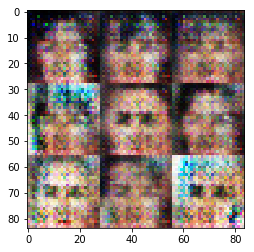

Epoch 1/5... Discriminator Loss: 1.6321... Generator Loss: 0.5516
Epoch 1/5... Discriminator Loss: 1.5440... Generator Loss: 0.6150
Epoch 1/5... Discriminator Loss: 1.6101... Generator Loss: 0.6000
Epoch 1/5... Discriminator Loss: 1.5745... Generator Loss: 0.5512
Epoch 1/5... Discriminator Loss: 1.6977... Generator Loss: 0.5422
Epoch 1/5... Discriminator Loss: 1.6854... Generator Loss: 0.5187
Epoch 1/5... Discriminator Loss: 1.6591... Generator Loss: 0.5631
Epoch 1/5... Discriminator Loss: 1.7598... Generator Loss: 0.5912
Epoch 1/5... Discriminator Loss: 1.5869... Generator Loss: 0.5831
Epoch 1/5... Discriminator Loss: 1.6563... Generator Loss: 0.5207


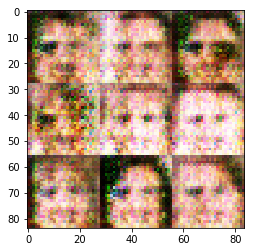

Epoch 1/5... Discriminator Loss: 1.4619... Generator Loss: 0.6004
Epoch 1/5... Discriminator Loss: 1.6370... Generator Loss: 0.5099
Epoch 1/5... Discriminator Loss: 1.8379... Generator Loss: 0.5386
Epoch 1/5... Discriminator Loss: 1.5933... Generator Loss: 0.5212
Epoch 1/5... Discriminator Loss: 1.8694... Generator Loss: 0.4850
Epoch 1/5... Discriminator Loss: 1.7562... Generator Loss: 0.5586
Epoch 1/5... Discriminator Loss: 1.5114... Generator Loss: 0.5835
Epoch 1/5... Discriminator Loss: 1.5333... Generator Loss: 0.6478
Epoch 1/5... Discriminator Loss: 1.5391... Generator Loss: 0.6029
Epoch 1/5... Discriminator Loss: 1.4591... Generator Loss: 0.6166


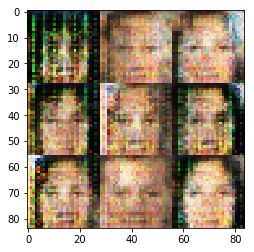

Epoch 1/5... Discriminator Loss: 1.5032... Generator Loss: 0.6614
Epoch 1/5... Discriminator Loss: 1.5165... Generator Loss: 0.6199
Epoch 1/5... Discriminator Loss: 1.5236... Generator Loss: 0.5971
Epoch 1/5... Discriminator Loss: 1.4846... Generator Loss: 0.5940
Epoch 1/5... Discriminator Loss: 1.4760... Generator Loss: 0.6678
Epoch 1/5... Discriminator Loss: 1.5510... Generator Loss: 0.5639
Epoch 1/5... Discriminator Loss: 1.4725... Generator Loss: 0.7093
Epoch 1/5... Discriminator Loss: 1.5085... Generator Loss: 0.5738
Epoch 1/5... Discriminator Loss: 1.4624... Generator Loss: 0.5711
Epoch 1/5... Discriminator Loss: 1.5754... Generator Loss: 0.6313


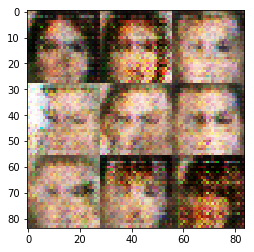

Epoch 1/5... Discriminator Loss: 1.5607... Generator Loss: 0.6264
Epoch 1/5... Discriminator Loss: 1.5851... Generator Loss: 0.5870
Epoch 1/5... Discriminator Loss: 1.6607... Generator Loss: 0.5912
Epoch 1/5... Discriminator Loss: 1.5839... Generator Loss: 0.5610
Epoch 1/5... Discriminator Loss: 1.4926... Generator Loss: 0.5854
Epoch 1/5... Discriminator Loss: 1.6828... Generator Loss: 0.5093
Epoch 1/5... Discriminator Loss: 1.7092... Generator Loss: 0.5066
Epoch 1/5... Discriminator Loss: 1.6062... Generator Loss: 0.6324
Epoch 1/5... Discriminator Loss: 1.6335... Generator Loss: 0.5316
Epoch 1/5... Discriminator Loss: 1.5687... Generator Loss: 0.6101


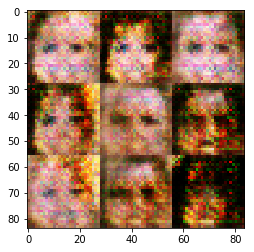

Epoch 1/5... Discriminator Loss: 1.5153... Generator Loss: 0.5656
Epoch 1/5... Discriminator Loss: 1.5468... Generator Loss: 0.6185
Epoch 1/5... Discriminator Loss: 1.5973... Generator Loss: 0.5691
Epoch 1/5... Discriminator Loss: 1.6706... Generator Loss: 0.5445
Epoch 1/5... Discriminator Loss: 1.5122... Generator Loss: 0.6204
Epoch 1/5... Discriminator Loss: 1.5599... Generator Loss: 0.6099
Epoch 1/5... Discriminator Loss: 1.6050... Generator Loss: 0.4893
Epoch 1/5... Discriminator Loss: 1.4795... Generator Loss: 0.6450
Epoch 1/5... Discriminator Loss: 1.4481... Generator Loss: 0.6590
Epoch 1/5... Discriminator Loss: 1.5571... Generator Loss: 0.5714


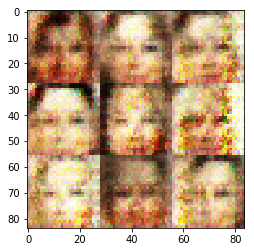

Epoch 1/5... Discriminator Loss: 1.4613... Generator Loss: 0.6448
Epoch 1/5... Discriminator Loss: 1.5914... Generator Loss: 0.5632
Epoch 1/5... Discriminator Loss: 1.6167... Generator Loss: 0.5737
Epoch 1/5... Discriminator Loss: 1.4434... Generator Loss: 0.5536
Epoch 1/5... Discriminator Loss: 1.4712... Generator Loss: 0.6736
Epoch 1/5... Discriminator Loss: 1.5573... Generator Loss: 0.5925
Epoch 1/5... Discriminator Loss: 1.4609... Generator Loss: 0.6377
Epoch 1/5... Discriminator Loss: 1.4845... Generator Loss: 0.6191
Epoch 1/5... Discriminator Loss: 1.5201... Generator Loss: 0.5482
Epoch 1/5... Discriminator Loss: 1.5016... Generator Loss: 0.6340


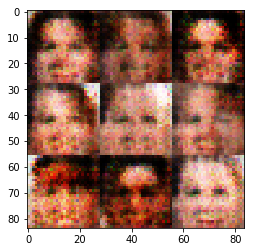

Epoch 1/5... Discriminator Loss: 1.5351... Generator Loss: 0.5956
Epoch 1/5... Discriminator Loss: 1.5933... Generator Loss: 0.6061
Epoch 1/5... Discriminator Loss: 1.5435... Generator Loss: 0.6153
Epoch 1/5... Discriminator Loss: 1.5407... Generator Loss: 0.6853
Epoch 1/5... Discriminator Loss: 1.4757... Generator Loss: 0.6148
Epoch 1/5... Discriminator Loss: 1.4892... Generator Loss: 0.5930
Epoch 1/5... Discriminator Loss: 1.4426... Generator Loss: 0.6503
Epoch 1/5... Discriminator Loss: 1.5592... Generator Loss: 0.6053
Epoch 1/5... Discriminator Loss: 1.5983... Generator Loss: 0.5784
Epoch 1/5... Discriminator Loss: 1.5803... Generator Loss: 0.6001


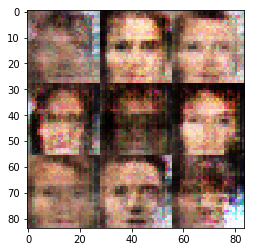

Epoch 1/5... Discriminator Loss: 1.5505... Generator Loss: 0.5956
Epoch 1/5... Discriminator Loss: 1.4898... Generator Loss: 0.5996
Epoch 1/5... Discriminator Loss: 1.4733... Generator Loss: 0.6672
Epoch 1/5... Discriminator Loss: 1.5660... Generator Loss: 0.5847
Epoch 1/5... Discriminator Loss: 1.5137... Generator Loss: 0.5688
Epoch 1/5... Discriminator Loss: 1.4486... Generator Loss: 0.6493
Epoch 1/5... Discriminator Loss: 1.6208... Generator Loss: 0.5213
Epoch 1/5... Discriminator Loss: 1.5160... Generator Loss: 0.6017
Epoch 1/5... Discriminator Loss: 1.5049... Generator Loss: 0.6143
Epoch 1/5... Discriminator Loss: 1.5411... Generator Loss: 0.5670


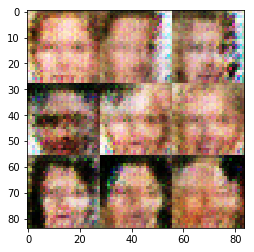

Epoch 1/5... Discriminator Loss: 1.4735... Generator Loss: 0.6308
Epoch 1/5... Discriminator Loss: 1.5182... Generator Loss: 0.5635
Epoch 1/5... Discriminator Loss: 1.5799... Generator Loss: 0.5963
Epoch 1/5... Discriminator Loss: 1.5136... Generator Loss: 0.7265
Epoch 1/5... Discriminator Loss: 1.5031... Generator Loss: 0.6264
Epoch 1/5... Discriminator Loss: 1.4644... Generator Loss: 0.5954
Epoch 1/5... Discriminator Loss: 1.5174... Generator Loss: 0.6607
Epoch 1/5... Discriminator Loss: 1.4902... Generator Loss: 0.6446
Epoch 1/5... Discriminator Loss: 1.5130... Generator Loss: 0.5756
Epoch 1/5... Discriminator Loss: 1.4816... Generator Loss: 0.6410


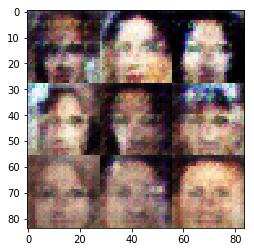

Epoch 1/5... Discriminator Loss: 1.4696... Generator Loss: 0.6399
Epoch 1/5... Discriminator Loss: 1.5018... Generator Loss: 0.6329
Epoch 1/5... Discriminator Loss: 1.5433... Generator Loss: 0.5484
Epoch 1/5... Discriminator Loss: 1.5053... Generator Loss: 0.6059
Epoch 1/5... Discriminator Loss: 1.4498... Generator Loss: 0.6819
Epoch 1/5... Discriminator Loss: 1.5711... Generator Loss: 0.5938
Epoch 1/5... Discriminator Loss: 1.3930... Generator Loss: 0.6892
Epoch 1/5... Discriminator Loss: 1.5089... Generator Loss: 0.6890
Epoch 1/5... Discriminator Loss: 1.4877... Generator Loss: 0.6512
Epoch 1/5... Discriminator Loss: 1.4915... Generator Loss: 0.6185


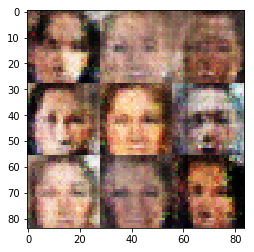

Epoch 1/5... Discriminator Loss: 1.4678... Generator Loss: 0.6849
Epoch 1/5... Discriminator Loss: 1.5127... Generator Loss: 0.6401
Epoch 1/5... Discriminator Loss: 1.4423... Generator Loss: 0.6247
Epoch 1/5... Discriminator Loss: 1.4781... Generator Loss: 0.6482
Epoch 1/5... Discriminator Loss: 1.5986... Generator Loss: 0.5487
Epoch 1/5... Discriminator Loss: 1.4692... Generator Loss: 0.6680
Epoch 1/5... Discriminator Loss: 1.5177... Generator Loss: 0.6691
Epoch 1/5... Discriminator Loss: 1.4048... Generator Loss: 0.6411
Epoch 1/5... Discriminator Loss: 1.4480... Generator Loss: 0.6335
Epoch 1/5... Discriminator Loss: 1.5845... Generator Loss: 0.5610


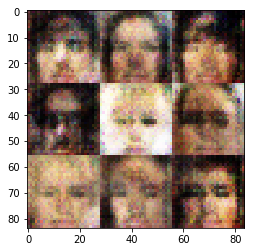

Epoch 1/5... Discriminator Loss: 1.4448... Generator Loss: 0.6933
Epoch 1/5... Discriminator Loss: 1.4799... Generator Loss: 0.6263
Epoch 1/5... Discriminator Loss: 1.5106... Generator Loss: 0.6097
Epoch 1/5... Discriminator Loss: 1.5183... Generator Loss: 0.6021
Epoch 1/5... Discriminator Loss: 1.5002... Generator Loss: 0.6541
Epoch 1/5... Discriminator Loss: 1.5000... Generator Loss: 0.6283
Epoch 1/5... Discriminator Loss: 1.5003... Generator Loss: 0.6970
Epoch 1/5... Discriminator Loss: 1.5554... Generator Loss: 0.6201
Epoch 1/5... Discriminator Loss: 1.4849... Generator Loss: 0.6083
Epoch 1/5... Discriminator Loss: 1.4938... Generator Loss: 0.6893


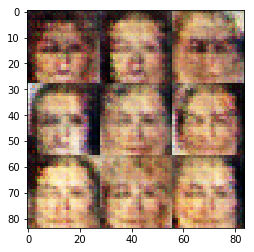

Epoch 1/5... Discriminator Loss: 1.5731... Generator Loss: 0.6481
Epoch 1/5... Discriminator Loss: 1.4587... Generator Loss: 0.6142
Epoch 1/5... Discriminator Loss: 1.4342... Generator Loss: 0.6932
Epoch 1/5... Discriminator Loss: 1.4386... Generator Loss: 0.6685
Epoch 1/5... Discriminator Loss: 1.4891... Generator Loss: 0.6778
Epoch 1/5... Discriminator Loss: 1.4645... Generator Loss: 0.6552
Epoch 1/5... Discriminator Loss: 1.5032... Generator Loss: 0.5674
Epoch 1/5... Discriminator Loss: 1.4745... Generator Loss: 0.6451
Epoch 1/5... Discriminator Loss: 1.4894... Generator Loss: 0.6316
Epoch 1/5... Discriminator Loss: 1.4934... Generator Loss: 0.6399


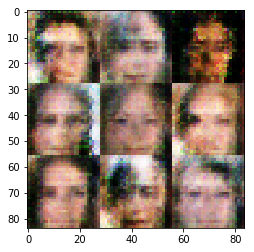

Epoch 1/5... Discriminator Loss: 1.5060... Generator Loss: 0.6338
Epoch 1/5... Discriminator Loss: 1.5646... Generator Loss: 0.5950
Epoch 1/5... Discriminator Loss: 1.3841... Generator Loss: 0.6882
Epoch 1/5... Discriminator Loss: 1.4388... Generator Loss: 0.6769
Epoch 1/5... Discriminator Loss: 1.5606... Generator Loss: 0.5557
Epoch 1/5... Discriminator Loss: 1.4336... Generator Loss: 0.6657
Epoch 1/5... Discriminator Loss: 1.5583... Generator Loss: 0.6031
Epoch 1/5... Discriminator Loss: 1.5196... Generator Loss: 0.5799
Epoch 1/5... Discriminator Loss: 1.4934... Generator Loss: 0.6139
Epoch 1/5... Discriminator Loss: 1.5278... Generator Loss: 0.6579


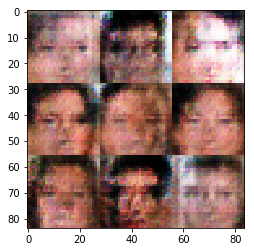

Epoch 1/5... Discriminator Loss: 1.4458... Generator Loss: 0.6523
Epoch 1/5... Discriminator Loss: 1.5528... Generator Loss: 0.6022
Epoch 1/5... Discriminator Loss: 1.4869... Generator Loss: 0.6414
Epoch 1/5... Discriminator Loss: 1.4943... Generator Loss: 0.6950
Epoch 1/5... Discriminator Loss: 1.5488... Generator Loss: 0.5811
Epoch 1/5... Discriminator Loss: 1.4329... Generator Loss: 0.6133
Epoch 1/5... Discriminator Loss: 1.5307... Generator Loss: 0.6243
Epoch 1/5... Discriminator Loss: 1.4674... Generator Loss: 0.6702
Epoch 1/5... Discriminator Loss: 1.4920... Generator Loss: 0.5790
Epoch 1/5... Discriminator Loss: 1.4707... Generator Loss: 0.6255


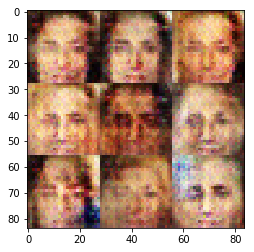

Epoch 1/5... Discriminator Loss: 1.4683... Generator Loss: 0.6769
Epoch 1/5... Discriminator Loss: 1.4214... Generator Loss: 0.6745
Epoch 1/5... Discriminator Loss: 1.4900... Generator Loss: 0.6233
Epoch 1/5... Discriminator Loss: 1.4162... Generator Loss: 0.6671
Epoch 1/5... Discriminator Loss: 1.4410... Generator Loss: 0.5783
Epoch 1/5... Discriminator Loss: 1.4859... Generator Loss: 0.6233
Epoch 1/5... Discriminator Loss: 1.4687... Generator Loss: 0.6542
Epoch 1/5... Discriminator Loss: 1.4673... Generator Loss: 0.6298
Epoch 1/5... Discriminator Loss: 1.4046... Generator Loss: 0.7305
Epoch 1/5... Discriminator Loss: 1.4588... Generator Loss: 0.6980


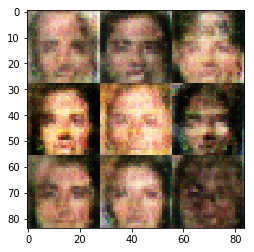

Epoch 1/5... Discriminator Loss: 1.4472... Generator Loss: 0.6533
Epoch 1/5... Discriminator Loss: 1.4553... Generator Loss: 0.6793
Epoch 1/5... Discriminator Loss: 1.4496... Generator Loss: 0.6157
Epoch 1/5... Discriminator Loss: 1.5021... Generator Loss: 0.6534
Epoch 1/5... Discriminator Loss: 1.4345... Generator Loss: 0.6044
Epoch 1/5... Discriminator Loss: 1.4405... Generator Loss: 0.6218
Epoch 1/5... Discriminator Loss: 1.4651... Generator Loss: 0.6429
Epoch 1/5... Discriminator Loss: 1.4791... Generator Loss: 0.6279
Epoch 1/5... Discriminator Loss: 1.4047... Generator Loss: 0.6274
Epoch 1/5... Discriminator Loss: 1.5444... Generator Loss: 0.6662


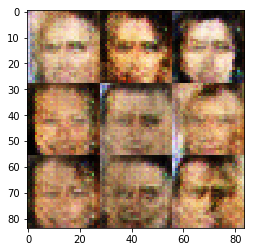

Epoch 1/5... Discriminator Loss: 1.4225... Generator Loss: 0.6628
Epoch 1/5... Discriminator Loss: 1.5140... Generator Loss: 0.6080
Epoch 1/5... Discriminator Loss: 1.5071... Generator Loss: 0.5751
Epoch 1/5... Discriminator Loss: 1.4625... Generator Loss: 0.6665
Epoch 1/5... Discriminator Loss: 1.5090... Generator Loss: 0.6310
Epoch 1/5... Discriminator Loss: 1.4108... Generator Loss: 0.6901
Epoch 1/5... Discriminator Loss: 1.4585... Generator Loss: 0.6344
Epoch 1/5... Discriminator Loss: 1.5156... Generator Loss: 0.6106
Epoch 1/5... Discriminator Loss: 1.4523... Generator Loss: 0.6799
Epoch 1/5... Discriminator Loss: 1.5726... Generator Loss: 0.6434


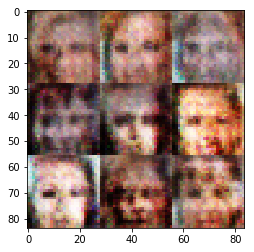

Epoch 1/5... Discriminator Loss: 1.4595... Generator Loss: 0.6362
Epoch 1/5... Discriminator Loss: 1.4560... Generator Loss: 0.6249
Epoch 1/5... Discriminator Loss: 1.4093... Generator Loss: 0.6751
Epoch 1/5... Discriminator Loss: 1.4103... Generator Loss: 0.5985
Epoch 1/5... Discriminator Loss: 1.4901... Generator Loss: 0.6533
Epoch 1/5... Discriminator Loss: 1.4431... Generator Loss: 0.6422
Epoch 1/5... Discriminator Loss: 1.4430... Generator Loss: 0.5758
Epoch 1/5... Discriminator Loss: 1.4942... Generator Loss: 0.6353
Epoch 1/5... Discriminator Loss: 1.5078... Generator Loss: 0.6032
Epoch 1/5... Discriminator Loss: 1.4539... Generator Loss: 0.7002


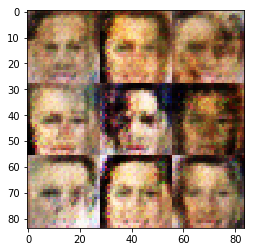

Epoch 1/5... Discriminator Loss: 1.4206... Generator Loss: 0.6425
Epoch 1/5... Discriminator Loss: 1.4652... Generator Loss: 0.6919
Epoch 1/5... Discriminator Loss: 1.4575... Generator Loss: 0.6769
Epoch 1/5... Discriminator Loss: 1.4364... Generator Loss: 0.6655
Epoch 1/5... Discriminator Loss: 1.4144... Generator Loss: 0.6510
Epoch 1/5... Discriminator Loss: 1.4605... Generator Loss: 0.6728
Epoch 1/5... Discriminator Loss: 1.4525... Generator Loss: 0.7077
Epoch 1/5... Discriminator Loss: 1.4555... Generator Loss: 0.6074
Epoch 1/5... Discriminator Loss: 1.4983... Generator Loss: 0.6256
Epoch 1/5... Discriminator Loss: 1.4655... Generator Loss: 0.6556


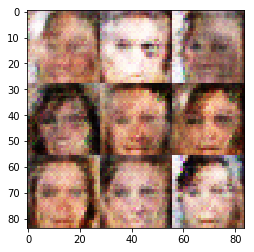

Epoch 1/5... Discriminator Loss: 1.4165... Generator Loss: 0.6898
Epoch 1/5... Discriminator Loss: 1.4885... Generator Loss: 0.6596
Epoch 1/5... Discriminator Loss: 1.4382... Generator Loss: 0.6237
Epoch 1/5... Discriminator Loss: 1.4710... Generator Loss: 0.6419
Epoch 1/5... Discriminator Loss: 1.4910... Generator Loss: 0.6133
Epoch 1/5... Discriminator Loss: 1.4395... Generator Loss: 0.6507
Epoch 1/5... Discriminator Loss: 1.4751... Generator Loss: 0.7009
Epoch 1/5... Discriminator Loss: 1.4182... Generator Loss: 0.6633
Epoch 1/5... Discriminator Loss: 1.4139... Generator Loss: 0.6627
Epoch 1/5... Discriminator Loss: 1.5217... Generator Loss: 0.6055


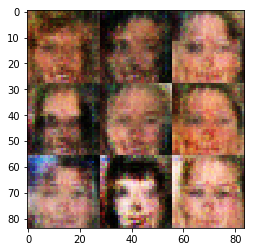

Epoch 1/5... Discriminator Loss: 1.4329... Generator Loss: 0.6622
Epoch 1/5... Discriminator Loss: 1.4427... Generator Loss: 0.6667
Epoch 1/5... Discriminator Loss: 1.4443... Generator Loss: 0.6407
Epoch 1/5... Discriminator Loss: 1.4678... Generator Loss: 0.6779
Epoch 1/5... Discriminator Loss: 1.4337... Generator Loss: 0.6354
Epoch 1/5... Discriminator Loss: 1.4280... Generator Loss: 0.5911
Epoch 1/5... Discriminator Loss: 1.4502... Generator Loss: 0.6234
Epoch 1/5... Discriminator Loss: 1.4686... Generator Loss: 0.6642
Epoch 1/5... Discriminator Loss: 1.4634... Generator Loss: 0.6706
Epoch 1/5... Discriminator Loss: 1.4711... Generator Loss: 0.5981


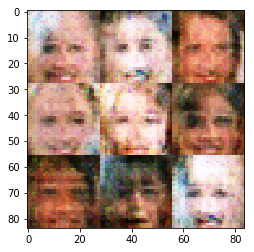

Epoch 1/5... Discriminator Loss: 1.4425... Generator Loss: 0.6947
Epoch 1/5... Discriminator Loss: 1.5070... Generator Loss: 0.6486
Epoch 1/5... Discriminator Loss: 1.4699... Generator Loss: 0.6211
Epoch 1/5... Discriminator Loss: 1.4333... Generator Loss: 0.6267
Epoch 1/5... Discriminator Loss: 1.4533... Generator Loss: 0.6481
Epoch 1/5... Discriminator Loss: 1.4731... Generator Loss: 0.6104
Epoch 1/5... Discriminator Loss: 1.4985... Generator Loss: 0.5800
Epoch 1/5... Discriminator Loss: 1.5122... Generator Loss: 0.6604
Epoch 1/5... Discriminator Loss: 1.4787... Generator Loss: 0.6315
Epoch 1/5... Discriminator Loss: 1.4155... Generator Loss: 0.6607


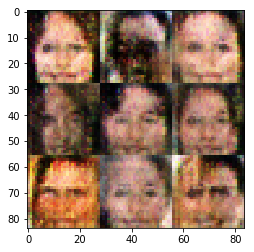

Epoch 1/5... Discriminator Loss: 1.4129... Generator Loss: 0.6643
Epoch 1/5... Discriminator Loss: 1.5361... Generator Loss: 0.6294
Epoch 1/5... Discriminator Loss: 1.4319... Generator Loss: 0.6173
Epoch 1/5... Discriminator Loss: 1.4827... Generator Loss: 0.6453
Epoch 1/5... Discriminator Loss: 1.4343... Generator Loss: 0.5880
Epoch 1/5... Discriminator Loss: 1.4931... Generator Loss: 0.6629
Epoch 1/5... Discriminator Loss: 1.3665... Generator Loss: 0.6986
Epoch 1/5... Discriminator Loss: 1.5490... Generator Loss: 0.6524
Epoch 1/5... Discriminator Loss: 1.4714... Generator Loss: 0.6718
Epoch 1/5... Discriminator Loss: 1.4681... Generator Loss: 0.6418


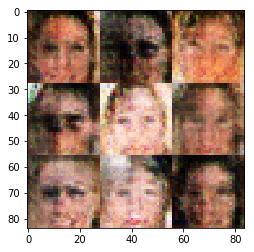

Epoch 1/5... Discriminator Loss: 1.4848... Generator Loss: 0.5756
Epoch 1/5... Discriminator Loss: 1.5285... Generator Loss: 0.6535
Epoch 1/5... Discriminator Loss: 1.4473... Generator Loss: 0.7065
Epoch 1/5... Discriminator Loss: 1.5732... Generator Loss: 0.5958
Epoch 1/5... Discriminator Loss: 1.4463... Generator Loss: 0.6200
Epoch 2/5... Discriminator Loss: 1.4673... Generator Loss: 0.6267
Epoch 2/5... Discriminator Loss: 1.4924... Generator Loss: 0.6669
Epoch 2/5... Discriminator Loss: 1.4337... Generator Loss: 0.6990
Epoch 2/5... Discriminator Loss: 1.5325... Generator Loss: 0.5510
Epoch 2/5... Discriminator Loss: 1.5015... Generator Loss: 0.6286


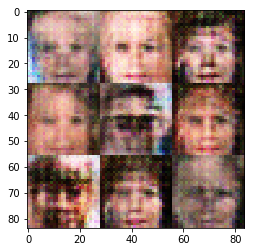

Epoch 2/5... Discriminator Loss: 1.4471... Generator Loss: 0.6289
Epoch 2/5... Discriminator Loss: 1.4909... Generator Loss: 0.6512
Epoch 2/5... Discriminator Loss: 1.4856... Generator Loss: 0.6246
Epoch 2/5... Discriminator Loss: 1.4698... Generator Loss: 0.6356
Epoch 2/5... Discriminator Loss: 1.5127... Generator Loss: 0.5977
Epoch 2/5... Discriminator Loss: 1.4923... Generator Loss: 0.6372
Epoch 2/5... Discriminator Loss: 1.4366... Generator Loss: 0.6708
Epoch 2/5... Discriminator Loss: 1.4347... Generator Loss: 0.6619
Epoch 2/5... Discriminator Loss: 1.4961... Generator Loss: 0.6103
Epoch 2/5... Discriminator Loss: 1.4587... Generator Loss: 0.6209


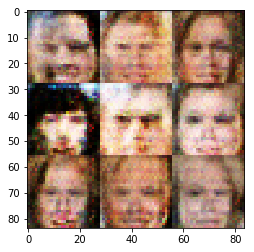

Epoch 2/5... Discriminator Loss: 1.5743... Generator Loss: 0.5870
Epoch 2/5... Discriminator Loss: 1.4021... Generator Loss: 0.6685
Epoch 2/5... Discriminator Loss: 1.4350... Generator Loss: 0.6540
Epoch 2/5... Discriminator Loss: 1.4616... Generator Loss: 0.6588
Epoch 2/5... Discriminator Loss: 1.4767... Generator Loss: 0.6342
Epoch 2/5... Discriminator Loss: 1.4617... Generator Loss: 0.6289
Epoch 2/5... Discriminator Loss: 1.4278... Generator Loss: 0.6857
Epoch 2/5... Discriminator Loss: 1.4362... Generator Loss: 0.6326
Epoch 2/5... Discriminator Loss: 1.4583... Generator Loss: 0.6138
Epoch 2/5... Discriminator Loss: 1.5227... Generator Loss: 0.5857


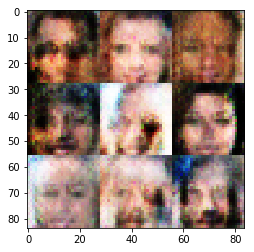

Epoch 2/5... Discriminator Loss: 1.3941... Generator Loss: 0.6883
Epoch 2/5... Discriminator Loss: 1.4669... Generator Loss: 0.6487
Epoch 2/5... Discriminator Loss: 1.4916... Generator Loss: 0.5963
Epoch 2/5... Discriminator Loss: 1.4292... Generator Loss: 0.6236
Epoch 2/5... Discriminator Loss: 1.4674... Generator Loss: 0.6258
Epoch 2/5... Discriminator Loss: 1.4109... Generator Loss: 0.7060
Epoch 2/5... Discriminator Loss: 1.4270... Generator Loss: 0.6373
Epoch 2/5... Discriminator Loss: 1.4748... Generator Loss: 0.6016
Epoch 2/5... Discriminator Loss: 1.4331... Generator Loss: 0.6388
Epoch 2/5... Discriminator Loss: 1.4338... Generator Loss: 0.6607


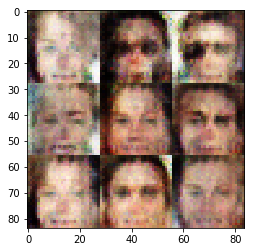

Epoch 2/5... Discriminator Loss: 1.4648... Generator Loss: 0.6579
Epoch 2/5... Discriminator Loss: 1.4095... Generator Loss: 0.6418
Epoch 2/5... Discriminator Loss: 1.4754... Generator Loss: 0.6651
Epoch 2/5... Discriminator Loss: 1.4623... Generator Loss: 0.6185
Epoch 2/5... Discriminator Loss: 1.4195... Generator Loss: 0.7182
Epoch 2/5... Discriminator Loss: 1.4550... Generator Loss: 0.6388
Epoch 2/5... Discriminator Loss: 1.4546... Generator Loss: 0.6805
Epoch 2/5... Discriminator Loss: 1.4375... Generator Loss: 0.6199
Epoch 2/5... Discriminator Loss: 1.4717... Generator Loss: 0.6717
Epoch 2/5... Discriminator Loss: 1.4190... Generator Loss: 0.6684


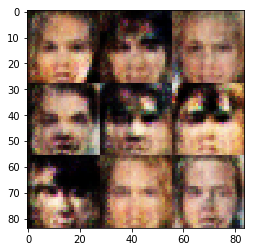

Epoch 2/5... Discriminator Loss: 1.4643... Generator Loss: 0.6591
Epoch 2/5... Discriminator Loss: 1.4889... Generator Loss: 0.6137
Epoch 2/5... Discriminator Loss: 1.4753... Generator Loss: 0.6225
Epoch 2/5... Discriminator Loss: 1.5206... Generator Loss: 0.6123
Epoch 2/5... Discriminator Loss: 1.4437... Generator Loss: 0.6545
Epoch 2/5... Discriminator Loss: 1.4629... Generator Loss: 0.6775
Epoch 2/5... Discriminator Loss: 1.4686... Generator Loss: 0.6303
Epoch 2/5... Discriminator Loss: 1.4136... Generator Loss: 0.6478
Epoch 2/5... Discriminator Loss: 1.4242... Generator Loss: 0.6853
Epoch 2/5... Discriminator Loss: 1.4203... Generator Loss: 0.6684


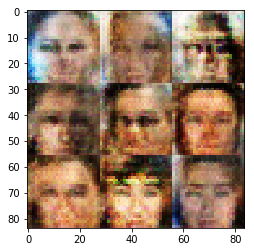

Epoch 2/5... Discriminator Loss: 1.4273... Generator Loss: 0.6984
Epoch 2/5... Discriminator Loss: 1.4039... Generator Loss: 0.6614
Epoch 2/5... Discriminator Loss: 1.4701... Generator Loss: 0.6139
Epoch 2/5... Discriminator Loss: 1.4640... Generator Loss: 0.6532
Epoch 2/5... Discriminator Loss: 1.4501... Generator Loss: 0.6348
Epoch 2/5... Discriminator Loss: 1.4220... Generator Loss: 0.6468
Epoch 2/5... Discriminator Loss: 1.4696... Generator Loss: 0.6140
Epoch 2/5... Discriminator Loss: 1.4127... Generator Loss: 0.7134
Epoch 2/5... Discriminator Loss: 1.4161... Generator Loss: 0.6989
Epoch 2/5... Discriminator Loss: 1.4031... Generator Loss: 0.6754


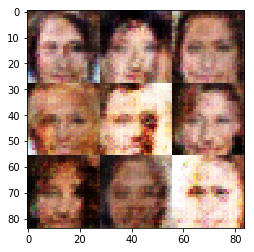

Epoch 2/5... Discriminator Loss: 1.4468... Generator Loss: 0.6435
Epoch 2/5... Discriminator Loss: 1.4823... Generator Loss: 0.6117
Epoch 2/5... Discriminator Loss: 1.4348... Generator Loss: 0.7052
Epoch 2/5... Discriminator Loss: 1.4223... Generator Loss: 0.6845
Epoch 2/5... Discriminator Loss: 1.4303... Generator Loss: 0.6386
Epoch 2/5... Discriminator Loss: 1.4717... Generator Loss: 0.6159
Epoch 2/5... Discriminator Loss: 1.4174... Generator Loss: 0.6769
Epoch 2/5... Discriminator Loss: 1.4564... Generator Loss: 0.6149
Epoch 2/5... Discriminator Loss: 1.4458... Generator Loss: 0.7088
Epoch 2/5... Discriminator Loss: 1.4581... Generator Loss: 0.6736


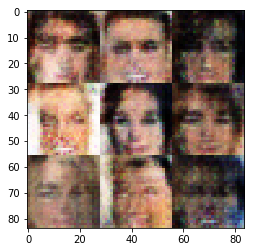

Epoch 2/5... Discriminator Loss: 1.4077... Generator Loss: 0.6748
Epoch 2/5... Discriminator Loss: 1.4536... Generator Loss: 0.6438
Epoch 2/5... Discriminator Loss: 1.4624... Generator Loss: 0.6476
Epoch 2/5... Discriminator Loss: 1.3923... Generator Loss: 0.7035
Epoch 2/5... Discriminator Loss: 1.4838... Generator Loss: 0.6290
Epoch 2/5... Discriminator Loss: 1.4318... Generator Loss: 0.6075
Epoch 2/5... Discriminator Loss: 1.4635... Generator Loss: 0.6472
Epoch 2/5... Discriminator Loss: 1.4593... Generator Loss: 0.6176
Epoch 2/5... Discriminator Loss: 1.4734... Generator Loss: 0.6323
Epoch 2/5... Discriminator Loss: 1.4564... Generator Loss: 0.6768


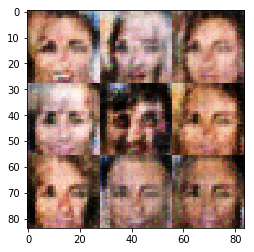

Epoch 2/5... Discriminator Loss: 1.4079... Generator Loss: 0.6498
Epoch 2/5... Discriminator Loss: 1.4788... Generator Loss: 0.6374
Epoch 2/5... Discriminator Loss: 1.4921... Generator Loss: 0.6116
Epoch 2/5... Discriminator Loss: 1.4977... Generator Loss: 0.6239
Epoch 2/5... Discriminator Loss: 1.4053... Generator Loss: 0.6624
Epoch 2/5... Discriminator Loss: 1.4461... Generator Loss: 0.6484
Epoch 2/5... Discriminator Loss: 1.4826... Generator Loss: 0.6188
Epoch 2/5... Discriminator Loss: 1.4828... Generator Loss: 0.6171
Epoch 2/5... Discriminator Loss: 1.4473... Generator Loss: 0.6715
Epoch 2/5... Discriminator Loss: 1.4336... Generator Loss: 0.6836


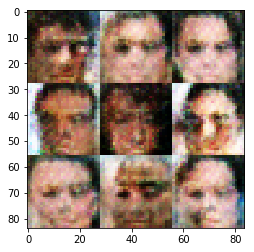

Epoch 2/5... Discriminator Loss: 1.5122... Generator Loss: 0.6419
Epoch 2/5... Discriminator Loss: 1.4139... Generator Loss: 0.6929
Epoch 2/5... Discriminator Loss: 1.4710... Generator Loss: 0.6358
Epoch 2/5... Discriminator Loss: 1.4038... Generator Loss: 0.6776
Epoch 2/5... Discriminator Loss: 1.4788... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.4087... Generator Loss: 0.6461
Epoch 2/5... Discriminator Loss: 1.4711... Generator Loss: 0.6061
Epoch 2/5... Discriminator Loss: 1.4344... Generator Loss: 0.6634
Epoch 2/5... Discriminator Loss: 1.4745... Generator Loss: 0.6536
Epoch 2/5... Discriminator Loss: 1.4249... Generator Loss: 0.6813


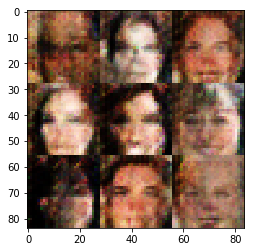

Epoch 2/5... Discriminator Loss: 1.4682... Generator Loss: 0.6463
Epoch 2/5... Discriminator Loss: 1.4133... Generator Loss: 0.6481
Epoch 2/5... Discriminator Loss: 1.5020... Generator Loss: 0.6295
Epoch 2/5... Discriminator Loss: 1.4048... Generator Loss: 0.6516
Epoch 2/5... Discriminator Loss: 1.5229... Generator Loss: 0.6292
Epoch 2/5... Discriminator Loss: 1.4220... Generator Loss: 0.6728
Epoch 2/5... Discriminator Loss: 1.5007... Generator Loss: 0.6684
Epoch 2/5... Discriminator Loss: 1.3957... Generator Loss: 0.6942
Epoch 2/5... Discriminator Loss: 1.4518... Generator Loss: 0.6616
Epoch 2/5... Discriminator Loss: 1.4389... Generator Loss: 0.6350


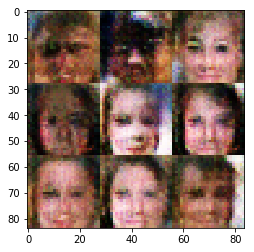

Epoch 2/5... Discriminator Loss: 1.4562... Generator Loss: 0.6257
Epoch 2/5... Discriminator Loss: 1.4501... Generator Loss: 0.6309
Epoch 2/5... Discriminator Loss: 1.4740... Generator Loss: 0.6253
Epoch 2/5... Discriminator Loss: 1.5133... Generator Loss: 0.6464
Epoch 2/5... Discriminator Loss: 1.4636... Generator Loss: 0.7111
Epoch 2/5... Discriminator Loss: 1.4310... Generator Loss: 0.6635
Epoch 2/5... Discriminator Loss: 1.4469... Generator Loss: 0.6261
Epoch 2/5... Discriminator Loss: 1.4161... Generator Loss: 0.6408
Epoch 2/5... Discriminator Loss: 1.4756... Generator Loss: 0.6610
Epoch 2/5... Discriminator Loss: 1.4361... Generator Loss: 0.6625


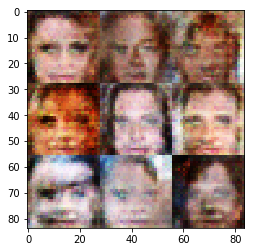

Epoch 2/5... Discriminator Loss: 1.4255... Generator Loss: 0.6671
Epoch 2/5... Discriminator Loss: 1.4392... Generator Loss: 0.6622
Epoch 2/5... Discriminator Loss: 1.4373... Generator Loss: 0.6107
Epoch 2/5... Discriminator Loss: 1.4135... Generator Loss: 0.6628
Epoch 2/5... Discriminator Loss: 1.4422... Generator Loss: 0.6729
Epoch 2/5... Discriminator Loss: 1.4425... Generator Loss: 0.6757
Epoch 2/5... Discriminator Loss: 1.4435... Generator Loss: 0.6522
Epoch 2/5... Discriminator Loss: 1.4368... Generator Loss: 0.6438
Epoch 2/5... Discriminator Loss: 1.4616... Generator Loss: 0.6412
Epoch 2/5... Discriminator Loss: 1.4447... Generator Loss: 0.6410


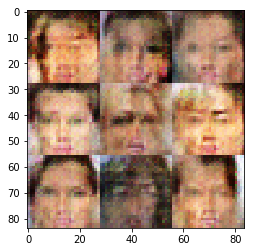

Epoch 2/5... Discriminator Loss: 1.3977... Generator Loss: 0.6871
Epoch 2/5... Discriminator Loss: 1.3974... Generator Loss: 0.6323
Epoch 2/5... Discriminator Loss: 1.4267... Generator Loss: 0.7170
Epoch 2/5... Discriminator Loss: 1.4676... Generator Loss: 0.6019
Epoch 2/5... Discriminator Loss: 1.4437... Generator Loss: 0.6052
Epoch 2/5... Discriminator Loss: 1.4517... Generator Loss: 0.6901
Epoch 2/5... Discriminator Loss: 1.4274... Generator Loss: 0.6277
Epoch 2/5... Discriminator Loss: 1.4488... Generator Loss: 0.6348
Epoch 2/5... Discriminator Loss: 1.4478... Generator Loss: 0.6697
Epoch 2/5... Discriminator Loss: 1.4363... Generator Loss: 0.6537


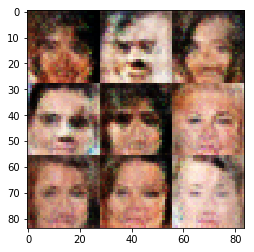

Epoch 2/5... Discriminator Loss: 1.4188... Generator Loss: 0.6399
Epoch 2/5... Discriminator Loss: 1.4488... Generator Loss: 0.6629
Epoch 2/5... Discriminator Loss: 1.4491... Generator Loss: 0.6569
Epoch 2/5... Discriminator Loss: 1.4123... Generator Loss: 0.6400
Epoch 2/5... Discriminator Loss: 1.4383... Generator Loss: 0.6621
Epoch 2/5... Discriminator Loss: 1.4352... Generator Loss: 0.6902
Epoch 2/5... Discriminator Loss: 1.4666... Generator Loss: 0.6678
Epoch 2/5... Discriminator Loss: 1.4187... Generator Loss: 0.6435
Epoch 2/5... Discriminator Loss: 1.4850... Generator Loss: 0.6281
Epoch 2/5... Discriminator Loss: 1.4566... Generator Loss: 0.6178


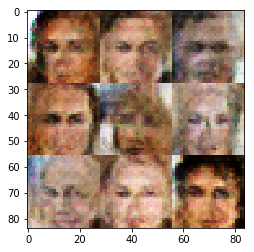

Epoch 2/5... Discriminator Loss: 1.4748... Generator Loss: 0.6300
Epoch 2/5... Discriminator Loss: 1.4321... Generator Loss: 0.6824
Epoch 2/5... Discriminator Loss: 1.4348... Generator Loss: 0.6671
Epoch 2/5... Discriminator Loss: 1.4455... Generator Loss: 0.6595
Epoch 2/5... Discriminator Loss: 1.4455... Generator Loss: 0.6231
Epoch 2/5... Discriminator Loss: 1.4298... Generator Loss: 0.6569
Epoch 2/5... Discriminator Loss: 1.4647... Generator Loss: 0.6381
Epoch 2/5... Discriminator Loss: 1.4115... Generator Loss: 0.6707
Epoch 2/5... Discriminator Loss: 1.4622... Generator Loss: 0.6574
Epoch 2/5... Discriminator Loss: 1.4276... Generator Loss: 0.6478


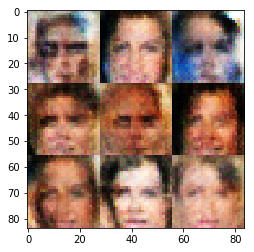

Epoch 2/5... Discriminator Loss: 1.4621... Generator Loss: 0.6772
Epoch 2/5... Discriminator Loss: 1.3930... Generator Loss: 0.6956
Epoch 2/5... Discriminator Loss: 1.4346... Generator Loss: 0.6465
Epoch 2/5... Discriminator Loss: 1.4577... Generator Loss: 0.6430
Epoch 2/5... Discriminator Loss: 1.4307... Generator Loss: 0.6346
Epoch 2/5... Discriminator Loss: 1.4409... Generator Loss: 0.6654
Epoch 2/5... Discriminator Loss: 1.4168... Generator Loss: 0.6744
Epoch 2/5... Discriminator Loss: 1.4276... Generator Loss: 0.6477
Epoch 2/5... Discriminator Loss: 1.3885... Generator Loss: 0.6721
Epoch 2/5... Discriminator Loss: 1.4554... Generator Loss: 0.6609


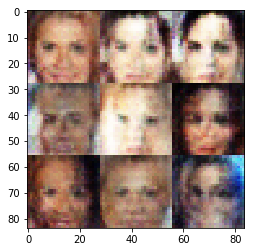

Epoch 2/5... Discriminator Loss: 1.4239... Generator Loss: 0.6702
Epoch 2/5... Discriminator Loss: 1.4269... Generator Loss: 0.6573
Epoch 2/5... Discriminator Loss: 1.4418... Generator Loss: 0.6816
Epoch 2/5... Discriminator Loss: 1.4129... Generator Loss: 0.6664
Epoch 2/5... Discriminator Loss: 1.4465... Generator Loss: 0.6353
Epoch 2/5... Discriminator Loss: 1.4229... Generator Loss: 0.7187
Epoch 2/5... Discriminator Loss: 1.4221... Generator Loss: 0.6991
Epoch 2/5... Discriminator Loss: 1.4002... Generator Loss: 0.6386
Epoch 2/5... Discriminator Loss: 1.4267... Generator Loss: 0.6598
Epoch 2/5... Discriminator Loss: 1.4269... Generator Loss: 0.6695


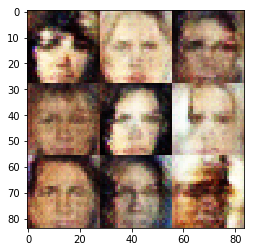

Epoch 2/5... Discriminator Loss: 1.4233... Generator Loss: 0.6642
Epoch 2/5... Discriminator Loss: 1.4088... Generator Loss: 0.6336
Epoch 2/5... Discriminator Loss: 1.4382... Generator Loss: 0.6789
Epoch 2/5... Discriminator Loss: 1.4532... Generator Loss: 0.6393
Epoch 2/5... Discriminator Loss: 1.4242... Generator Loss: 0.6913
Epoch 2/5... Discriminator Loss: 1.4425... Generator Loss: 0.6510
Epoch 2/5... Discriminator Loss: 1.4132... Generator Loss: 0.6606
Epoch 2/5... Discriminator Loss: 1.4455... Generator Loss: 0.6921
Epoch 2/5... Discriminator Loss: 1.4098... Generator Loss: 0.6468
Epoch 2/5... Discriminator Loss: 1.4118... Generator Loss: 0.6441


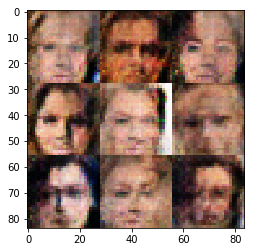

Epoch 2/5... Discriminator Loss: 1.4424... Generator Loss: 0.6505
Epoch 2/5... Discriminator Loss: 1.4533... Generator Loss: 0.6839
Epoch 2/5... Discriminator Loss: 1.4073... Generator Loss: 0.6831
Epoch 2/5... Discriminator Loss: 1.4070... Generator Loss: 0.6519
Epoch 2/5... Discriminator Loss: 1.4232... Generator Loss: 0.6484
Epoch 2/5... Discriminator Loss: 1.4269... Generator Loss: 0.7030
Epoch 2/5... Discriminator Loss: 1.4347... Generator Loss: 0.6472
Epoch 2/5... Discriminator Loss: 1.4296... Generator Loss: 0.6629
Epoch 2/5... Discriminator Loss: 1.4157... Generator Loss: 0.6485
Epoch 2/5... Discriminator Loss: 1.4620... Generator Loss: 0.6608


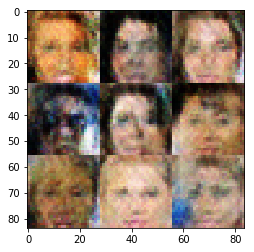

Epoch 2/5... Discriminator Loss: 1.4390... Generator Loss: 0.6639
Epoch 2/5... Discriminator Loss: 1.4197... Generator Loss: 0.6849
Epoch 2/5... Discriminator Loss: 1.4252... Generator Loss: 0.6764
Epoch 2/5... Discriminator Loss: 1.4756... Generator Loss: 0.6075
Epoch 2/5... Discriminator Loss: 1.4126... Generator Loss: 0.6593
Epoch 2/5... Discriminator Loss: 1.4182... Generator Loss: 0.6791
Epoch 2/5... Discriminator Loss: 1.4260... Generator Loss: 0.6537
Epoch 2/5... Discriminator Loss: 1.4328... Generator Loss: 0.6398
Epoch 2/5... Discriminator Loss: 1.4150... Generator Loss: 0.6568
Epoch 2/5... Discriminator Loss: 1.4170... Generator Loss: 0.6864


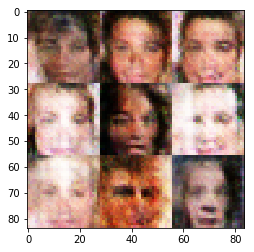

Epoch 2/5... Discriminator Loss: 1.4440... Generator Loss: 0.6246
Epoch 2/5... Discriminator Loss: 1.4272... Generator Loss: 0.6727
Epoch 2/5... Discriminator Loss: 1.4479... Generator Loss: 0.6592
Epoch 2/5... Discriminator Loss: 1.4343... Generator Loss: 0.6690
Epoch 2/5... Discriminator Loss: 1.4565... Generator Loss: 0.6384
Epoch 2/5... Discriminator Loss: 1.4107... Generator Loss: 0.6446
Epoch 2/5... Discriminator Loss: 1.4592... Generator Loss: 0.6831
Epoch 2/5... Discriminator Loss: 1.4547... Generator Loss: 0.6526
Epoch 2/5... Discriminator Loss: 1.4093... Generator Loss: 0.6478
Epoch 2/5... Discriminator Loss: 1.4377... Generator Loss: 0.6934


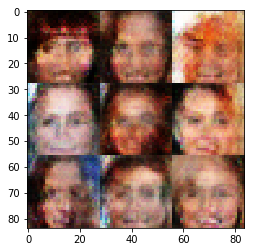

Epoch 2/5... Discriminator Loss: 1.4352... Generator Loss: 0.6285
Epoch 2/5... Discriminator Loss: 1.4076... Generator Loss: 0.6734
Epoch 2/5... Discriminator Loss: 1.4257... Generator Loss: 0.6627
Epoch 2/5... Discriminator Loss: 1.4426... Generator Loss: 0.6316
Epoch 2/5... Discriminator Loss: 1.4397... Generator Loss: 0.6583
Epoch 2/5... Discriminator Loss: 1.4167... Generator Loss: 0.6459
Epoch 2/5... Discriminator Loss: 1.4524... Generator Loss: 0.6509
Epoch 2/5... Discriminator Loss: 1.4432... Generator Loss: 0.6782
Epoch 2/5... Discriminator Loss: 1.4344... Generator Loss: 0.6656
Epoch 2/5... Discriminator Loss: 1.4232... Generator Loss: 0.6498


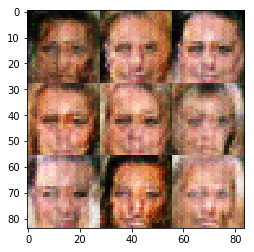

Epoch 2/5... Discriminator Loss: 1.4342... Generator Loss: 0.6865
Epoch 2/5... Discriminator Loss: 1.4350... Generator Loss: 0.6344
Epoch 2/5... Discriminator Loss: 1.4183... Generator Loss: 0.6873
Epoch 2/5... Discriminator Loss: 1.4033... Generator Loss: 0.6691
Epoch 2/5... Discriminator Loss: 1.4222... Generator Loss: 0.6517
Epoch 2/5... Discriminator Loss: 1.4469... Generator Loss: 0.6666
Epoch 2/5... Discriminator Loss: 1.4389... Generator Loss: 0.6539
Epoch 2/5... Discriminator Loss: 1.4339... Generator Loss: 0.6365
Epoch 2/5... Discriminator Loss: 1.4036... Generator Loss: 0.6782
Epoch 2/5... Discriminator Loss: 1.4151... Generator Loss: 0.6607


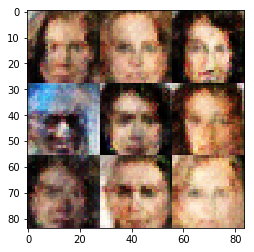

Epoch 2/5... Discriminator Loss: 1.4268... Generator Loss: 0.6604
Epoch 2/5... Discriminator Loss: 1.4185... Generator Loss: 0.6555
Epoch 2/5... Discriminator Loss: 1.4510... Generator Loss: 0.6579
Epoch 2/5... Discriminator Loss: 1.4279... Generator Loss: 0.6764
Epoch 2/5... Discriminator Loss: 1.4032... Generator Loss: 0.6661
Epoch 2/5... Discriminator Loss: 1.4470... Generator Loss: 0.6695
Epoch 2/5... Discriminator Loss: 1.4360... Generator Loss: 0.6634
Epoch 2/5... Discriminator Loss: 1.4172... Generator Loss: 0.6531
Epoch 2/5... Discriminator Loss: 1.4083... Generator Loss: 0.6708
Epoch 2/5... Discriminator Loss: 1.4440... Generator Loss: 0.6586


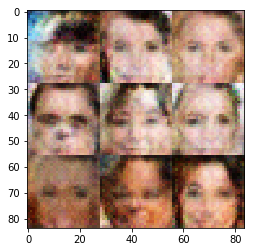

Epoch 2/5... Discriminator Loss: 1.4237... Generator Loss: 0.6626
Epoch 2/5... Discriminator Loss: 1.3889... Generator Loss: 0.6613
Epoch 2/5... Discriminator Loss: 1.4355... Generator Loss: 0.6583
Epoch 2/5... Discriminator Loss: 1.4225... Generator Loss: 0.7077
Epoch 2/5... Discriminator Loss: 1.4264... Generator Loss: 0.6618
Epoch 2/5... Discriminator Loss: 1.4301... Generator Loss: 0.6555
Epoch 2/5... Discriminator Loss: 1.4252... Generator Loss: 0.6306
Epoch 2/5... Discriminator Loss: 1.4226... Generator Loss: 0.6699
Epoch 2/5... Discriminator Loss: 1.4063... Generator Loss: 0.6702
Epoch 2/5... Discriminator Loss: 1.4370... Generator Loss: 0.6363


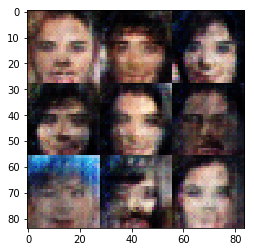

Epoch 2/5... Discriminator Loss: 1.4416... Generator Loss: 0.7055
Epoch 2/5... Discriminator Loss: 1.4124... Generator Loss: 0.6345
Epoch 2/5... Discriminator Loss: 1.4549... Generator Loss: 0.6395
Epoch 2/5... Discriminator Loss: 1.4048... Generator Loss: 0.6854
Epoch 2/5... Discriminator Loss: 1.4030... Generator Loss: 0.6570
Epoch 2/5... Discriminator Loss: 1.4216... Generator Loss: 0.6557
Epoch 2/5... Discriminator Loss: 1.4197... Generator Loss: 0.6759
Epoch 2/5... Discriminator Loss: 1.4086... Generator Loss: 0.6742
Epoch 2/5... Discriminator Loss: 1.4114... Generator Loss: 0.6666
Epoch 2/5... Discriminator Loss: 1.4035... Generator Loss: 0.6716


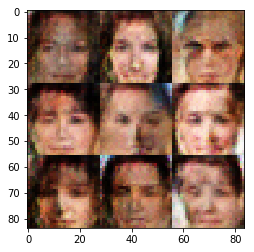

Epoch 2/5... Discriminator Loss: 1.4050... Generator Loss: 0.6891
Epoch 2/5... Discriminator Loss: 1.4301... Generator Loss: 0.6698
Epoch 2/5... Discriminator Loss: 1.4242... Generator Loss: 0.6590
Epoch 2/5... Discriminator Loss: 1.4141... Generator Loss: 0.6645
Epoch 2/5... Discriminator Loss: 1.4257... Generator Loss: 0.6584
Epoch 2/5... Discriminator Loss: 1.4189... Generator Loss: 0.6783
Epoch 2/5... Discriminator Loss: 1.4103... Generator Loss: 0.6620
Epoch 2/5... Discriminator Loss: 1.3968... Generator Loss: 0.6662
Epoch 2/5... Discriminator Loss: 1.4297... Generator Loss: 0.6830
Epoch 2/5... Discriminator Loss: 1.4189... Generator Loss: 0.6641


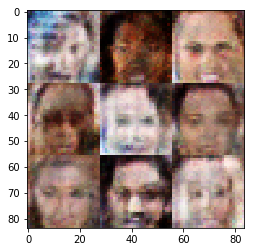

Epoch 2/5... Discriminator Loss: 1.4073... Generator Loss: 0.6454
Epoch 2/5... Discriminator Loss: 1.4280... Generator Loss: 0.6736
Epoch 2/5... Discriminator Loss: 1.4260... Generator Loss: 0.6648
Epoch 2/5... Discriminator Loss: 1.4141... Generator Loss: 0.6651
Epoch 2/5... Discriminator Loss: 1.4026... Generator Loss: 0.7031
Epoch 2/5... Discriminator Loss: 1.4145... Generator Loss: 0.6519
Epoch 2/5... Discriminator Loss: 1.4267... Generator Loss: 0.6603
Epoch 2/5... Discriminator Loss: 1.4033... Generator Loss: 0.6711
Epoch 2/5... Discriminator Loss: 1.4148... Generator Loss: 0.6598
Epoch 2/5... Discriminator Loss: 1.4501... Generator Loss: 0.6835


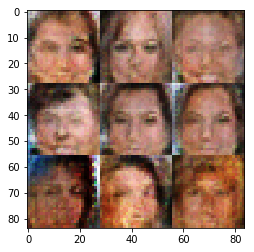

Epoch 2/5... Discriminator Loss: 1.4107... Generator Loss: 0.6808
Epoch 2/5... Discriminator Loss: 1.4254... Generator Loss: 0.6607
Epoch 2/5... Discriminator Loss: 1.4464... Generator Loss: 0.6442
Epoch 2/5... Discriminator Loss: 1.4380... Generator Loss: 0.6095
Epoch 2/5... Discriminator Loss: 1.4174... Generator Loss: 0.6582
Epoch 2/5... Discriminator Loss: 1.4267... Generator Loss: 0.6850
Epoch 2/5... Discriminator Loss: 1.4449... Generator Loss: 0.6901
Epoch 2/5... Discriminator Loss: 1.4100... Generator Loss: 0.6763
Epoch 2/5... Discriminator Loss: 1.4083... Generator Loss: 0.6459
Epoch 2/5... Discriminator Loss: 1.4191... Generator Loss: 0.6905


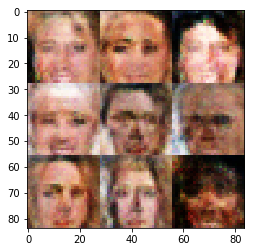

Epoch 2/5... Discriminator Loss: 1.4066... Generator Loss: 0.6708
Epoch 2/5... Discriminator Loss: 1.4160... Generator Loss: 0.6537
Epoch 2/5... Discriminator Loss: 1.4310... Generator Loss: 0.7101
Epoch 2/5... Discriminator Loss: 1.4077... Generator Loss: 0.6740
Epoch 2/5... Discriminator Loss: 1.3776... Generator Loss: 0.6888
Epoch 2/5... Discriminator Loss: 1.4041... Generator Loss: 0.6709
Epoch 2/5... Discriminator Loss: 1.4234... Generator Loss: 0.6794
Epoch 2/5... Discriminator Loss: 1.4106... Generator Loss: 0.6636
Epoch 2/5... Discriminator Loss: 1.4207... Generator Loss: 0.6552
Epoch 2/5... Discriminator Loss: 1.4396... Generator Loss: 0.6720


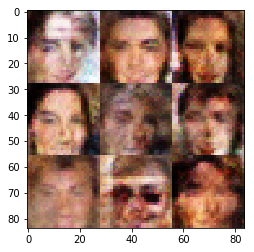

Epoch 2/5... Discriminator Loss: 1.4099... Generator Loss: 0.6700
Epoch 2/5... Discriminator Loss: 1.4111... Generator Loss: 0.6770
Epoch 2/5... Discriminator Loss: 1.4396... Generator Loss: 0.6756
Epoch 2/5... Discriminator Loss: 1.4024... Generator Loss: 0.6592
Epoch 2/5... Discriminator Loss: 1.4091... Generator Loss: 0.6667
Epoch 2/5... Discriminator Loss: 1.4013... Generator Loss: 0.6691
Epoch 2/5... Discriminator Loss: 1.4385... Generator Loss: 0.6652
Epoch 2/5... Discriminator Loss: 1.4244... Generator Loss: 0.6829
Epoch 2/5... Discriminator Loss: 1.3994... Generator Loss: 0.6823
Epoch 2/5... Discriminator Loss: 1.4322... Generator Loss: 0.6602


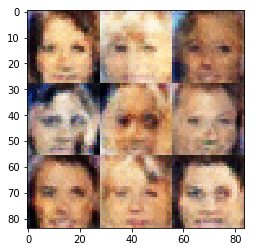

Epoch 2/5... Discriminator Loss: 1.4018... Generator Loss: 0.6690
Epoch 2/5... Discriminator Loss: 1.4180... Generator Loss: 0.6841
Epoch 2/5... Discriminator Loss: 1.4163... Generator Loss: 0.6703
Epoch 2/5... Discriminator Loss: 1.4472... Generator Loss: 0.6233
Epoch 2/5... Discriminator Loss: 1.4064... Generator Loss: 0.6874
Epoch 2/5... Discriminator Loss: 1.4052... Generator Loss: 0.6978
Epoch 2/5... Discriminator Loss: 1.4304... Generator Loss: 0.6869
Epoch 2/5... Discriminator Loss: 1.4121... Generator Loss: 0.6612
Epoch 2/5... Discriminator Loss: 1.4001... Generator Loss: 0.6526
Epoch 2/5... Discriminator Loss: 1.4497... Generator Loss: 0.6460


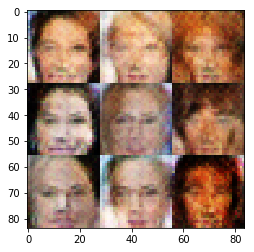

Epoch 2/5... Discriminator Loss: 1.4593... Generator Loss: 0.6720
Epoch 2/5... Discriminator Loss: 1.3992... Generator Loss: 0.6435
Epoch 2/5... Discriminator Loss: 1.4254... Generator Loss: 0.6544
Epoch 2/5... Discriminator Loss: 1.4538... Generator Loss: 0.6776
Epoch 2/5... Discriminator Loss: 1.4071... Generator Loss: 0.6563
Epoch 2/5... Discriminator Loss: 1.4254... Generator Loss: 0.6294
Epoch 2/5... Discriminator Loss: 1.4262... Generator Loss: 0.6602
Epoch 2/5... Discriminator Loss: 1.4399... Generator Loss: 0.6716
Epoch 2/5... Discriminator Loss: 1.4294... Generator Loss: 0.7023
Epoch 2/5... Discriminator Loss: 1.3980... Generator Loss: 0.6507


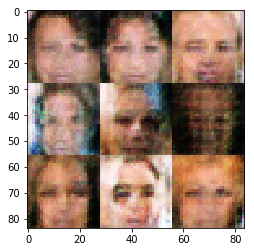

Epoch 2/5... Discriminator Loss: 1.4594... Generator Loss: 0.6150
Epoch 2/5... Discriminator Loss: 1.4146... Generator Loss: 0.6803
Epoch 2/5... Discriminator Loss: 1.4230... Generator Loss: 0.6964
Epoch 2/5... Discriminator Loss: 1.4242... Generator Loss: 0.6641
Epoch 2/5... Discriminator Loss: 1.4078... Generator Loss: 0.6406
Epoch 2/5... Discriminator Loss: 1.4248... Generator Loss: 0.6776
Epoch 2/5... Discriminator Loss: 1.4361... Generator Loss: 0.6816
Epoch 2/5... Discriminator Loss: 1.4142... Generator Loss: 0.6980
Epoch 2/5... Discriminator Loss: 1.4214... Generator Loss: 0.6813
Epoch 2/5... Discriminator Loss: 1.4222... Generator Loss: 0.6665


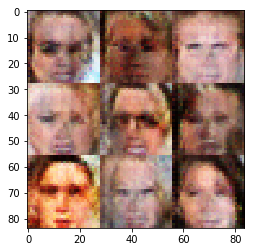

Epoch 2/5... Discriminator Loss: 1.4205... Generator Loss: 0.6561
Epoch 2/5... Discriminator Loss: 1.4484... Generator Loss: 0.6798
Epoch 2/5... Discriminator Loss: 1.4103... Generator Loss: 0.6827
Epoch 2/5... Discriminator Loss: 1.4045... Generator Loss: 0.6634
Epoch 2/5... Discriminator Loss: 1.3960... Generator Loss: 0.6548
Epoch 2/5... Discriminator Loss: 1.4130... Generator Loss: 0.6664
Epoch 2/5... Discriminator Loss: 1.4395... Generator Loss: 0.6386
Epoch 2/5... Discriminator Loss: 1.4060... Generator Loss: 0.6620
Epoch 2/5... Discriminator Loss: 1.4043... Generator Loss: 0.6812
Epoch 2/5... Discriminator Loss: 1.4336... Generator Loss: 0.6634


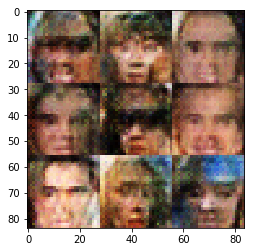

Epoch 2/5... Discriminator Loss: 1.3862... Generator Loss: 0.6539
Epoch 2/5... Discriminator Loss: 1.4272... Generator Loss: 0.6576
Epoch 2/5... Discriminator Loss: 1.4111... Generator Loss: 0.6843
Epoch 2/5... Discriminator Loss: 1.4142... Generator Loss: 0.6695
Epoch 2/5... Discriminator Loss: 1.4195... Generator Loss: 0.6768
Epoch 2/5... Discriminator Loss: 1.4289... Generator Loss: 0.6461
Epoch 2/5... Discriminator Loss: 1.4095... Generator Loss: 0.6701
Epoch 2/5... Discriminator Loss: 1.4047... Generator Loss: 0.6631
Epoch 2/5... Discriminator Loss: 1.4350... Generator Loss: 0.6791
Epoch 2/5... Discriminator Loss: 1.4141... Generator Loss: 0.6835


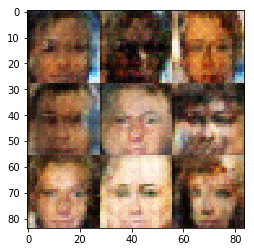

Epoch 2/5... Discriminator Loss: 1.3943... Generator Loss: 0.6884
Epoch 2/5... Discriminator Loss: 1.4070... Generator Loss: 0.6625
Epoch 2/5... Discriminator Loss: 1.4124... Generator Loss: 0.6626
Epoch 2/5... Discriminator Loss: 1.4238... Generator Loss: 0.6812
Epoch 2/5... Discriminator Loss: 1.4051... Generator Loss: 0.6590
Epoch 2/5... Discriminator Loss: 1.4261... Generator Loss: 0.6729
Epoch 2/5... Discriminator Loss: 1.4163... Generator Loss: 0.6562
Epoch 2/5... Discriminator Loss: 1.4186... Generator Loss: 0.6860
Epoch 2/5... Discriminator Loss: 1.4049... Generator Loss: 0.6517
Epoch 2/5... Discriminator Loss: 1.4199... Generator Loss: 0.6841


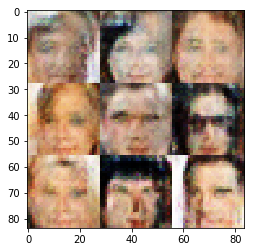

Epoch 2/5... Discriminator Loss: 1.4103... Generator Loss: 0.6561
Epoch 2/5... Discriminator Loss: 1.3984... Generator Loss: 0.6897
Epoch 2/5... Discriminator Loss: 1.4342... Generator Loss: 0.6732
Epoch 2/5... Discriminator Loss: 1.3968... Generator Loss: 0.6512
Epoch 2/5... Discriminator Loss: 1.4231... Generator Loss: 0.6851
Epoch 2/5... Discriminator Loss: 1.4106... Generator Loss: 0.6754
Epoch 2/5... Discriminator Loss: 1.4188... Generator Loss: 0.6504
Epoch 2/5... Discriminator Loss: 1.4378... Generator Loss: 0.6627
Epoch 2/5... Discriminator Loss: 1.4178... Generator Loss: 0.6777
Epoch 2/5... Discriminator Loss: 1.4001... Generator Loss: 0.6838


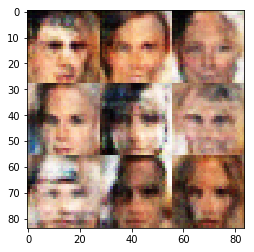

Epoch 2/5... Discriminator Loss: 1.4644... Generator Loss: 0.6395
Epoch 3/5... Discriminator Loss: 1.3960... Generator Loss: 0.6797
Epoch 3/5... Discriminator Loss: 1.4181... Generator Loss: 0.6922
Epoch 3/5... Discriminator Loss: 1.4176... Generator Loss: 0.6478
Epoch 3/5... Discriminator Loss: 1.4265... Generator Loss: 0.6503
Epoch 3/5... Discriminator Loss: 1.3912... Generator Loss: 0.7085
Epoch 3/5... Discriminator Loss: 1.4374... Generator Loss: 0.6603
Epoch 3/5... Discriminator Loss: 1.4261... Generator Loss: 0.6468
Epoch 3/5... Discriminator Loss: 1.4230... Generator Loss: 0.6521
Epoch 3/5... Discriminator Loss: 1.4542... Generator Loss: 0.6476


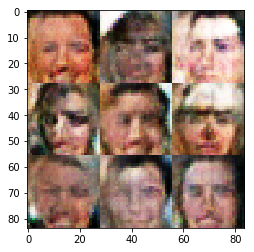

Epoch 3/5... Discriminator Loss: 1.4109... Generator Loss: 0.6811
Epoch 3/5... Discriminator Loss: 1.3960... Generator Loss: 0.6826
Epoch 3/5... Discriminator Loss: 1.4264... Generator Loss: 0.6654
Epoch 3/5... Discriminator Loss: 1.4163... Generator Loss: 0.6830
Epoch 3/5... Discriminator Loss: 1.4328... Generator Loss: 0.6697
Epoch 3/5... Discriminator Loss: 1.4066... Generator Loss: 0.6782
Epoch 3/5... Discriminator Loss: 1.4192... Generator Loss: 0.6547
Epoch 3/5... Discriminator Loss: 1.4118... Generator Loss: 0.6820
Epoch 3/5... Discriminator Loss: 1.4303... Generator Loss: 0.6804
Epoch 3/5... Discriminator Loss: 1.4013... Generator Loss: 0.6605


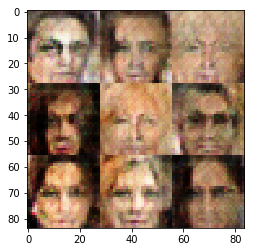

Epoch 3/5... Discriminator Loss: 1.4034... Generator Loss: 0.6713
Epoch 3/5... Discriminator Loss: 1.4212... Generator Loss: 0.6609
Epoch 3/5... Discriminator Loss: 1.4378... Generator Loss: 0.6659
Epoch 3/5... Discriminator Loss: 1.3837... Generator Loss: 0.6780
Epoch 3/5... Discriminator Loss: 1.4451... Generator Loss: 0.6765
Epoch 3/5... Discriminator Loss: 1.4061... Generator Loss: 0.6709
Epoch 3/5... Discriminator Loss: 1.4224... Generator Loss: 0.6685
Epoch 3/5... Discriminator Loss: 1.4086... Generator Loss: 0.6688
Epoch 3/5... Discriminator Loss: 1.4172... Generator Loss: 0.6817
Epoch 3/5... Discriminator Loss: 1.4109... Generator Loss: 0.6911


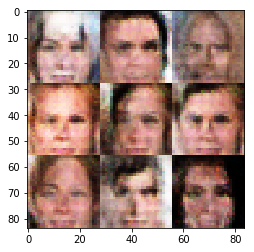

Epoch 3/5... Discriminator Loss: 1.4612... Generator Loss: 0.6247
Epoch 3/5... Discriminator Loss: 1.4206... Generator Loss: 0.6733
Epoch 3/5... Discriminator Loss: 1.4206... Generator Loss: 0.6969
Epoch 3/5... Discriminator Loss: 1.4072... Generator Loss: 0.6454
Epoch 3/5... Discriminator Loss: 1.4314... Generator Loss: 0.6608
Epoch 3/5... Discriminator Loss: 1.4113... Generator Loss: 0.7050
Epoch 3/5... Discriminator Loss: 1.4092... Generator Loss: 0.6687
Epoch 3/5... Discriminator Loss: 1.4064... Generator Loss: 0.6661
Epoch 3/5... Discriminator Loss: 1.4324... Generator Loss: 0.6531
Epoch 3/5... Discriminator Loss: 1.3936... Generator Loss: 0.6803


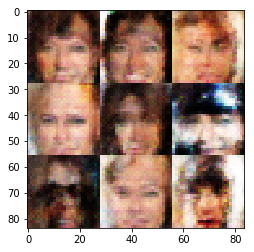

Epoch 3/5... Discriminator Loss: 1.4046... Generator Loss: 0.6970
Epoch 3/5... Discriminator Loss: 1.4161... Generator Loss: 0.6659
Epoch 3/5... Discriminator Loss: 1.3957... Generator Loss: 0.6752
Epoch 3/5... Discriminator Loss: 1.4198... Generator Loss: 0.6653
Epoch 3/5... Discriminator Loss: 1.4221... Generator Loss: 0.6696
Epoch 3/5... Discriminator Loss: 1.4171... Generator Loss: 0.6517
Epoch 3/5... Discriminator Loss: 1.4037... Generator Loss: 0.6904
Epoch 3/5... Discriminator Loss: 1.4174... Generator Loss: 0.6476
Epoch 3/5... Discriminator Loss: 1.4257... Generator Loss: 0.6899
Epoch 3/5... Discriminator Loss: 1.4042... Generator Loss: 0.6577


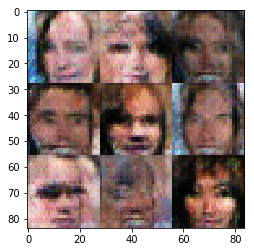

Epoch 3/5... Discriminator Loss: 1.4025... Generator Loss: 0.6701
Epoch 3/5... Discriminator Loss: 1.3916... Generator Loss: 0.6881
Epoch 3/5... Discriminator Loss: 1.4126... Generator Loss: 0.6840
Epoch 3/5... Discriminator Loss: 1.4412... Generator Loss: 0.6326
Epoch 3/5... Discriminator Loss: 1.4341... Generator Loss: 0.6877
Epoch 3/5... Discriminator Loss: 1.4101... Generator Loss: 0.6797
Epoch 3/5... Discriminator Loss: 1.3928... Generator Loss: 0.6949
Epoch 3/5... Discriminator Loss: 1.4253... Generator Loss: 0.6751
Epoch 3/5... Discriminator Loss: 1.4077... Generator Loss: 0.6734
Epoch 3/5... Discriminator Loss: 1.4464... Generator Loss: 0.6532


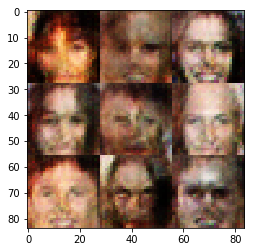

Epoch 3/5... Discriminator Loss: 1.3926... Generator Loss: 0.6735
Epoch 3/5... Discriminator Loss: 1.4277... Generator Loss: 0.6880
Epoch 3/5... Discriminator Loss: 1.3976... Generator Loss: 0.6723
Epoch 3/5... Discriminator Loss: 1.4087... Generator Loss: 0.6756
Epoch 3/5... Discriminator Loss: 1.4102... Generator Loss: 0.6765
Epoch 3/5... Discriminator Loss: 1.4032... Generator Loss: 0.6830
Epoch 3/5... Discriminator Loss: 1.4380... Generator Loss: 0.6486
Epoch 3/5... Discriminator Loss: 1.4542... Generator Loss: 0.6442
Epoch 3/5... Discriminator Loss: 1.3965... Generator Loss: 0.6819
Epoch 3/5... Discriminator Loss: 1.4082... Generator Loss: 0.6883


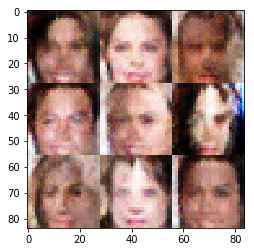

Epoch 3/5... Discriminator Loss: 1.4218... Generator Loss: 0.6536
Epoch 3/5... Discriminator Loss: 1.4257... Generator Loss: 0.6483
Epoch 3/5... Discriminator Loss: 1.4255... Generator Loss: 0.6967
Epoch 3/5... Discriminator Loss: 1.4115... Generator Loss: 0.6717
Epoch 3/5... Discriminator Loss: 1.4109... Generator Loss: 0.6725
Epoch 3/5... Discriminator Loss: 1.4216... Generator Loss: 0.6506
Epoch 3/5... Discriminator Loss: 1.4291... Generator Loss: 0.6602
Epoch 3/5... Discriminator Loss: 1.3945... Generator Loss: 0.6907
Epoch 3/5... Discriminator Loss: 1.4019... Generator Loss: 0.6607
Epoch 3/5... Discriminator Loss: 1.4180... Generator Loss: 0.6430


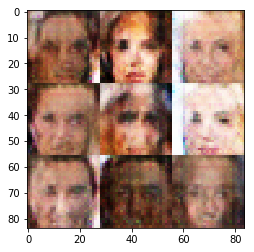

Epoch 3/5... Discriminator Loss: 1.4150... Generator Loss: 0.6825
Epoch 3/5... Discriminator Loss: 1.4090... Generator Loss: 0.7011
Epoch 3/5... Discriminator Loss: 1.4143... Generator Loss: 0.6588
Epoch 3/5... Discriminator Loss: 1.4280... Generator Loss: 0.6665
Epoch 3/5... Discriminator Loss: 1.3900... Generator Loss: 0.7031
Epoch 3/5... Discriminator Loss: 1.4168... Generator Loss: 0.6400
Epoch 3/5... Discriminator Loss: 1.4185... Generator Loss: 0.6504
Epoch 3/5... Discriminator Loss: 1.4276... Generator Loss: 0.6813
Epoch 3/5... Discriminator Loss: 1.4086... Generator Loss: 0.6812
Epoch 3/5... Discriminator Loss: 1.4128... Generator Loss: 0.6935


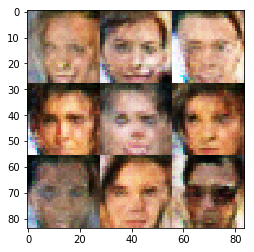

Epoch 3/5... Discriminator Loss: 1.4138... Generator Loss: 0.6815
Epoch 3/5... Discriminator Loss: 1.3918... Generator Loss: 0.6477
Epoch 3/5... Discriminator Loss: 1.3938... Generator Loss: 0.6952
Epoch 3/5... Discriminator Loss: 1.4063... Generator Loss: 0.6646
Epoch 3/5... Discriminator Loss: 1.4244... Generator Loss: 0.6596
Epoch 3/5... Discriminator Loss: 1.4003... Generator Loss: 0.7051
Epoch 3/5... Discriminator Loss: 1.4211... Generator Loss: 0.6542
Epoch 3/5... Discriminator Loss: 1.4012... Generator Loss: 0.6826
Epoch 3/5... Discriminator Loss: 1.4034... Generator Loss: 0.6725
Epoch 3/5... Discriminator Loss: 1.3920... Generator Loss: 0.6659


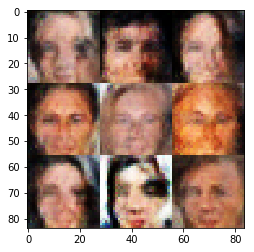

Epoch 3/5... Discriminator Loss: 1.4113... Generator Loss: 0.6898
Epoch 3/5... Discriminator Loss: 1.4123... Generator Loss: 0.6633
Epoch 3/5... Discriminator Loss: 1.3940... Generator Loss: 0.6792
Epoch 3/5... Discriminator Loss: 1.4180... Generator Loss: 0.6652
Epoch 3/5... Discriminator Loss: 1.4190... Generator Loss: 0.6858
Epoch 3/5... Discriminator Loss: 1.4170... Generator Loss: 0.6718
Epoch 3/5... Discriminator Loss: 1.3970... Generator Loss: 0.6833
Epoch 3/5... Discriminator Loss: 1.4116... Generator Loss: 0.6793
Epoch 3/5... Discriminator Loss: 1.4180... Generator Loss: 0.6577
Epoch 3/5... Discriminator Loss: 1.4143... Generator Loss: 0.6667


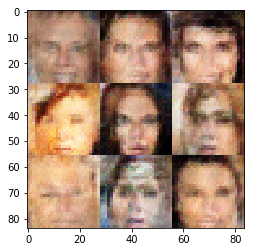

Epoch 3/5... Discriminator Loss: 1.4052... Generator Loss: 0.7091
Epoch 3/5... Discriminator Loss: 1.4087... Generator Loss: 0.6620
Epoch 3/5... Discriminator Loss: 1.4327... Generator Loss: 0.6605
Epoch 3/5... Discriminator Loss: 1.4005... Generator Loss: 0.6865
Epoch 3/5... Discriminator Loss: 1.4050... Generator Loss: 0.6601
Epoch 3/5... Discriminator Loss: 1.4193... Generator Loss: 0.6729
Epoch 3/5... Discriminator Loss: 1.4158... Generator Loss: 0.7053
Epoch 3/5... Discriminator Loss: 1.4154... Generator Loss: 0.6466
Epoch 3/5... Discriminator Loss: 1.4172... Generator Loss: 0.6657
Epoch 3/5... Discriminator Loss: 1.4184... Generator Loss: 0.6712


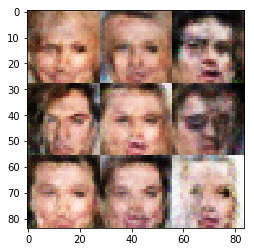

Epoch 3/5... Discriminator Loss: 1.4027... Generator Loss: 0.6818
Epoch 3/5... Discriminator Loss: 1.4135... Generator Loss: 0.6644
Epoch 3/5... Discriminator Loss: 1.4095... Generator Loss: 0.6693
Epoch 3/5... Discriminator Loss: 1.4222... Generator Loss: 0.6748
Epoch 3/5... Discriminator Loss: 1.4077... Generator Loss: 0.6800
Epoch 3/5... Discriminator Loss: 1.4060... Generator Loss: 0.6798
Epoch 3/5... Discriminator Loss: 1.4166... Generator Loss: 0.6659
Epoch 3/5... Discriminator Loss: 1.4126... Generator Loss: 0.6714
Epoch 3/5... Discriminator Loss: 1.4204... Generator Loss: 0.6541
Epoch 3/5... Discriminator Loss: 1.4209... Generator Loss: 0.6643


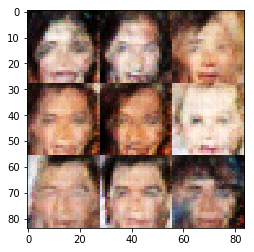

Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6641
Epoch 3/5... Discriminator Loss: 1.4055... Generator Loss: 0.6842
Epoch 3/5... Discriminator Loss: 1.4119... Generator Loss: 0.6825
Epoch 3/5... Discriminator Loss: 1.4354... Generator Loss: 0.6643
Epoch 3/5... Discriminator Loss: 1.4078... Generator Loss: 0.6758
Epoch 3/5... Discriminator Loss: 1.4230... Generator Loss: 0.6656
Epoch 3/5... Discriminator Loss: 1.4153... Generator Loss: 0.6848
Epoch 3/5... Discriminator Loss: 1.4095... Generator Loss: 0.6632
Epoch 3/5... Discriminator Loss: 1.4201... Generator Loss: 0.6818
Epoch 3/5... Discriminator Loss: 1.4009... Generator Loss: 0.6596


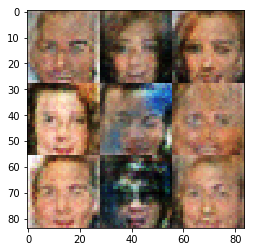

Epoch 3/5... Discriminator Loss: 1.4161... Generator Loss: 0.6726
Epoch 3/5... Discriminator Loss: 1.4092... Generator Loss: 0.6794
Epoch 3/5... Discriminator Loss: 1.4165... Generator Loss: 0.6847
Epoch 3/5... Discriminator Loss: 1.3917... Generator Loss: 0.7013
Epoch 3/5... Discriminator Loss: 1.4306... Generator Loss: 0.6724
Epoch 3/5... Discriminator Loss: 1.4006... Generator Loss: 0.6961
Epoch 3/5... Discriminator Loss: 1.4318... Generator Loss: 0.6566
Epoch 3/5... Discriminator Loss: 1.4468... Generator Loss: 0.6404
Epoch 3/5... Discriminator Loss: 1.3928... Generator Loss: 0.6858
Epoch 3/5... Discriminator Loss: 1.4333... Generator Loss: 0.6411


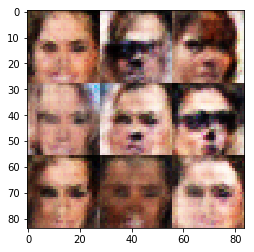

Epoch 3/5... Discriminator Loss: 1.4527... Generator Loss: 0.6465
Epoch 3/5... Discriminator Loss: 1.3942... Generator Loss: 0.6936
Epoch 3/5... Discriminator Loss: 1.4388... Generator Loss: 0.6644
Epoch 3/5... Discriminator Loss: 1.4191... Generator Loss: 0.6612
Epoch 3/5... Discriminator Loss: 1.3991... Generator Loss: 0.6791
Epoch 3/5... Discriminator Loss: 1.4362... Generator Loss: 0.6585
Epoch 3/5... Discriminator Loss: 1.4035... Generator Loss: 0.6700
Epoch 3/5... Discriminator Loss: 1.4113... Generator Loss: 0.6770
Epoch 3/5... Discriminator Loss: 1.4157... Generator Loss: 0.6937
Epoch 3/5... Discriminator Loss: 1.4092... Generator Loss: 0.6665


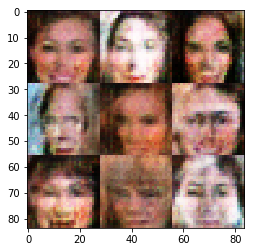

Epoch 3/5... Discriminator Loss: 1.4275... Generator Loss: 0.6562
Epoch 3/5... Discriminator Loss: 1.4257... Generator Loss: 0.6770
Epoch 3/5... Discriminator Loss: 1.3913... Generator Loss: 0.6918
Epoch 3/5... Discriminator Loss: 1.4000... Generator Loss: 0.6734
Epoch 3/5... Discriminator Loss: 1.4089... Generator Loss: 0.6548
Epoch 3/5... Discriminator Loss: 1.4331... Generator Loss: 0.6647
Epoch 3/5... Discriminator Loss: 1.4212... Generator Loss: 0.6801
Epoch 3/5... Discriminator Loss: 1.4230... Generator Loss: 0.6802
Epoch 3/5... Discriminator Loss: 1.3962... Generator Loss: 0.6766
Epoch 3/5... Discriminator Loss: 1.4368... Generator Loss: 0.6543


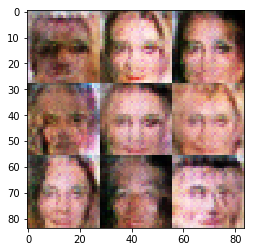

Epoch 3/5... Discriminator Loss: 1.4122... Generator Loss: 0.6699
Epoch 3/5... Discriminator Loss: 1.4066... Generator Loss: 0.6691
Epoch 3/5... Discriminator Loss: 1.4280... Generator Loss: 0.6718
Epoch 3/5... Discriminator Loss: 1.4225... Generator Loss: 0.6594
Epoch 3/5... Discriminator Loss: 1.4389... Generator Loss: 0.6611
Epoch 3/5... Discriminator Loss: 1.4018... Generator Loss: 0.6745
Epoch 3/5... Discriminator Loss: 1.4235... Generator Loss: 0.6641
Epoch 3/5... Discriminator Loss: 1.4050... Generator Loss: 0.6726
Epoch 3/5... Discriminator Loss: 1.4357... Generator Loss: 0.6544
Epoch 3/5... Discriminator Loss: 1.4008... Generator Loss: 0.6537


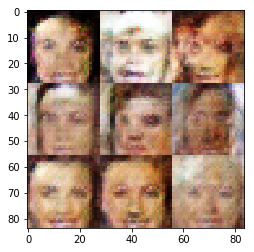

Epoch 3/5... Discriminator Loss: 1.4053... Generator Loss: 0.6467
Epoch 3/5... Discriminator Loss: 1.4337... Generator Loss: 0.6812
Epoch 3/5... Discriminator Loss: 1.4239... Generator Loss: 0.6694
Epoch 3/5... Discriminator Loss: 1.4029... Generator Loss: 0.6756
Epoch 3/5... Discriminator Loss: 1.4126... Generator Loss: 0.6859
Epoch 3/5... Discriminator Loss: 1.4109... Generator Loss: 0.6769
Epoch 3/5... Discriminator Loss: 1.3965... Generator Loss: 0.6574
Epoch 3/5... Discriminator Loss: 1.4273... Generator Loss: 0.6503
Epoch 3/5... Discriminator Loss: 1.4320... Generator Loss: 0.6845
Epoch 3/5... Discriminator Loss: 1.3934... Generator Loss: 0.6791


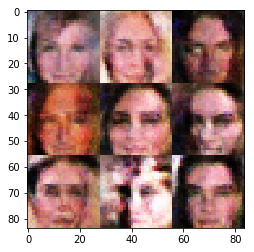

Epoch 3/5... Discriminator Loss: 1.4256... Generator Loss: 0.6687
Epoch 3/5... Discriminator Loss: 1.3965... Generator Loss: 0.6561
Epoch 3/5... Discriminator Loss: 1.4250... Generator Loss: 0.6837
Epoch 3/5... Discriminator Loss: 1.4026... Generator Loss: 0.6950
Epoch 3/5... Discriminator Loss: 1.4054... Generator Loss: 0.6706
Epoch 3/5... Discriminator Loss: 1.4213... Generator Loss: 0.6601
Epoch 3/5... Discriminator Loss: 1.3932... Generator Loss: 0.6689
Epoch 3/5... Discriminator Loss: 1.4098... Generator Loss: 0.6865
Epoch 3/5... Discriminator Loss: 1.4257... Generator Loss: 0.6812
Epoch 3/5... Discriminator Loss: 1.3972... Generator Loss: 0.6749


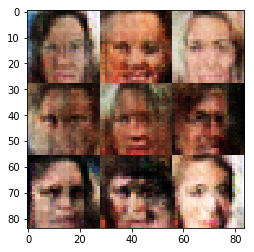

Epoch 3/5... Discriminator Loss: 1.3929... Generator Loss: 0.6845
Epoch 3/5... Discriminator Loss: 1.4103... Generator Loss: 0.6820
Epoch 3/5... Discriminator Loss: 1.4178... Generator Loss: 0.6655
Epoch 3/5... Discriminator Loss: 1.4036... Generator Loss: 0.6801
Epoch 3/5... Discriminator Loss: 1.4026... Generator Loss: 0.6729
Epoch 3/5... Discriminator Loss: 1.4158... Generator Loss: 0.6813
Epoch 3/5... Discriminator Loss: 1.4135... Generator Loss: 0.6704
Epoch 3/5... Discriminator Loss: 1.3966... Generator Loss: 0.6654
Epoch 3/5... Discriminator Loss: 1.4054... Generator Loss: 0.6816
Epoch 3/5... Discriminator Loss: 1.4242... Generator Loss: 0.6752


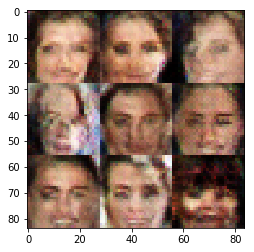

Epoch 3/5... Discriminator Loss: 1.3967... Generator Loss: 0.6838
Epoch 3/5... Discriminator Loss: 1.3865... Generator Loss: 0.6766
Epoch 3/5... Discriminator Loss: 1.4320... Generator Loss: 0.6763
Epoch 3/5... Discriminator Loss: 1.4062... Generator Loss: 0.6935
Epoch 3/5... Discriminator Loss: 1.4048... Generator Loss: 0.6656
Epoch 3/5... Discriminator Loss: 1.3965... Generator Loss: 0.6497
Epoch 3/5... Discriminator Loss: 1.4175... Generator Loss: 0.6718
Epoch 3/5... Discriminator Loss: 1.4241... Generator Loss: 0.6919
Epoch 3/5... Discriminator Loss: 1.4229... Generator Loss: 0.6398
Epoch 3/5... Discriminator Loss: 1.4171... Generator Loss: 0.6763


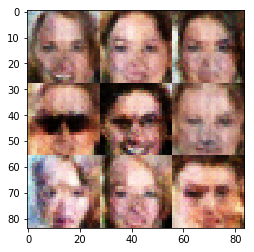

Epoch 3/5... Discriminator Loss: 1.4092... Generator Loss: 0.6681
Epoch 3/5... Discriminator Loss: 1.4133... Generator Loss: 0.6803
Epoch 3/5... Discriminator Loss: 1.4049... Generator Loss: 0.6736
Epoch 3/5... Discriminator Loss: 1.4222... Generator Loss: 0.6728
Epoch 3/5... Discriminator Loss: 1.3917... Generator Loss: 0.6809
Epoch 3/5... Discriminator Loss: 1.4251... Generator Loss: 0.6526
Epoch 3/5... Discriminator Loss: 1.3993... Generator Loss: 0.6640
Epoch 3/5... Discriminator Loss: 1.4142... Generator Loss: 0.6849
Epoch 3/5... Discriminator Loss: 1.3977... Generator Loss: 0.6758
Epoch 3/5... Discriminator Loss: 1.4110... Generator Loss: 0.6809


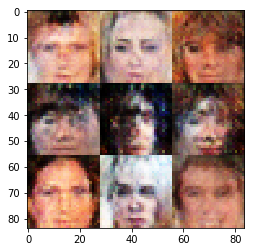

Epoch 3/5... Discriminator Loss: 1.4079... Generator Loss: 0.6825
Epoch 3/5... Discriminator Loss: 1.3979... Generator Loss: 0.6843
Epoch 3/5... Discriminator Loss: 1.4117... Generator Loss: 0.6811
Epoch 3/5... Discriminator Loss: 1.4043... Generator Loss: 0.6779
Epoch 3/5... Discriminator Loss: 1.4211... Generator Loss: 0.6697
Epoch 3/5... Discriminator Loss: 1.3967... Generator Loss: 0.6726
Epoch 3/5... Discriminator Loss: 1.4143... Generator Loss: 0.6721
Epoch 3/5... Discriminator Loss: 1.4025... Generator Loss: 0.6778
Epoch 3/5... Discriminator Loss: 1.4156... Generator Loss: 0.6789
Epoch 3/5... Discriminator Loss: 1.3981... Generator Loss: 0.6797


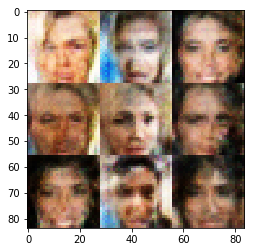

Epoch 3/5... Discriminator Loss: 1.4405... Generator Loss: 0.6681
Epoch 3/5... Discriminator Loss: 1.4056... Generator Loss: 0.6517
Epoch 3/5... Discriminator Loss: 1.3957... Generator Loss: 0.6774
Epoch 3/5... Discriminator Loss: 1.4298... Generator Loss: 0.6629
Epoch 3/5... Discriminator Loss: 1.4072... Generator Loss: 0.6826
Epoch 3/5... Discriminator Loss: 1.4166... Generator Loss: 0.6854
Epoch 3/5... Discriminator Loss: 1.3732... Generator Loss: 0.6892
Epoch 3/5... Discriminator Loss: 1.4513... Generator Loss: 0.6620
Epoch 3/5... Discriminator Loss: 1.4209... Generator Loss: 0.6811
Epoch 3/5... Discriminator Loss: 1.4061... Generator Loss: 0.6662


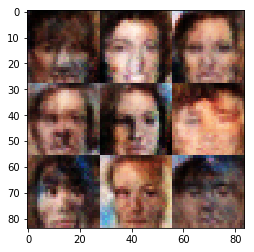

Epoch 3/5... Discriminator Loss: 1.4183... Generator Loss: 0.6726
Epoch 3/5... Discriminator Loss: 1.4465... Generator Loss: 0.6462
Epoch 3/5... Discriminator Loss: 1.4133... Generator Loss: 0.6741
Epoch 3/5... Discriminator Loss: 1.4433... Generator Loss: 0.6577
Epoch 3/5... Discriminator Loss: 1.3993... Generator Loss: 0.6882
Epoch 3/5... Discriminator Loss: 1.4060... Generator Loss: 0.6962
Epoch 3/5... Discriminator Loss: 1.4031... Generator Loss: 0.6800
Epoch 3/5... Discriminator Loss: 1.4004... Generator Loss: 0.6722
Epoch 3/5... Discriminator Loss: 1.3984... Generator Loss: 0.6801
Epoch 3/5... Discriminator Loss: 1.4107... Generator Loss: 0.6899


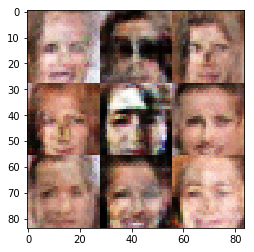

Epoch 3/5... Discriminator Loss: 1.3938... Generator Loss: 0.6742
Epoch 3/5... Discriminator Loss: 1.3946... Generator Loss: 0.6791
Epoch 3/5... Discriminator Loss: 1.4060... Generator Loss: 0.6787
Epoch 3/5... Discriminator Loss: 1.3992... Generator Loss: 0.6812
Epoch 3/5... Discriminator Loss: 1.4113... Generator Loss: 0.6722
Epoch 3/5... Discriminator Loss: 1.3956... Generator Loss: 0.6970
Epoch 3/5... Discriminator Loss: 1.4062... Generator Loss: 0.6720
Epoch 3/5... Discriminator Loss: 1.3942... Generator Loss: 0.6766
Epoch 3/5... Discriminator Loss: 1.4079... Generator Loss: 0.6814
Epoch 3/5... Discriminator Loss: 1.3979... Generator Loss: 0.6805


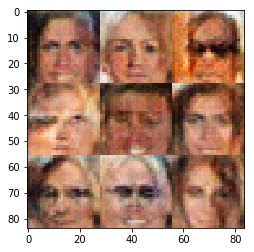

Epoch 3/5... Discriminator Loss: 1.4048... Generator Loss: 0.6841
Epoch 3/5... Discriminator Loss: 1.3970... Generator Loss: 0.6865
Epoch 3/5... Discriminator Loss: 1.4004... Generator Loss: 0.6717
Epoch 3/5... Discriminator Loss: 1.4000... Generator Loss: 0.6827
Epoch 3/5... Discriminator Loss: 1.3976... Generator Loss: 0.6842
Epoch 3/5... Discriminator Loss: 1.3890... Generator Loss: 0.6730
Epoch 3/5... Discriminator Loss: 1.4213... Generator Loss: 0.6929
Epoch 3/5... Discriminator Loss: 1.4065... Generator Loss: 0.6813
Epoch 3/5... Discriminator Loss: 1.3969... Generator Loss: 0.6749
Epoch 3/5... Discriminator Loss: 1.4035... Generator Loss: 0.6790


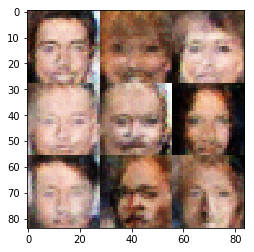

Epoch 3/5... Discriminator Loss: 1.4045... Generator Loss: 0.6835
Epoch 3/5... Discriminator Loss: 1.4178... Generator Loss: 0.6727
Epoch 3/5... Discriminator Loss: 1.4290... Generator Loss: 0.6778
Epoch 3/5... Discriminator Loss: 1.3812... Generator Loss: 0.6743
Epoch 3/5... Discriminator Loss: 1.4166... Generator Loss: 0.6806
Epoch 3/5... Discriminator Loss: 1.3977... Generator Loss: 0.6730
Epoch 3/5... Discriminator Loss: 1.4021... Generator Loss: 0.6685
Epoch 3/5... Discriminator Loss: 1.4097... Generator Loss: 0.6786
Epoch 3/5... Discriminator Loss: 1.4256... Generator Loss: 0.6572
Epoch 3/5... Discriminator Loss: 1.4167... Generator Loss: 0.6841


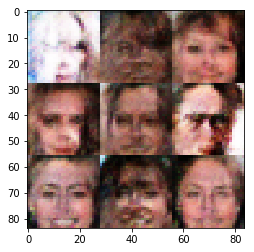

Epoch 3/5... Discriminator Loss: 1.3932... Generator Loss: 0.6865
Epoch 3/5... Discriminator Loss: 1.4033... Generator Loss: 0.6769
Epoch 3/5... Discriminator Loss: 1.4187... Generator Loss: 0.6594
Epoch 3/5... Discriminator Loss: 1.4065... Generator Loss: 0.6749
Epoch 3/5... Discriminator Loss: 1.4115... Generator Loss: 0.6940
Epoch 3/5... Discriminator Loss: 1.4106... Generator Loss: 0.6898
Epoch 3/5... Discriminator Loss: 1.4064... Generator Loss: 0.6627
Epoch 3/5... Discriminator Loss: 1.4095... Generator Loss: 0.6459
Epoch 3/5... Discriminator Loss: 1.4423... Generator Loss: 0.6853
Epoch 3/5... Discriminator Loss: 1.3913... Generator Loss: 0.6751


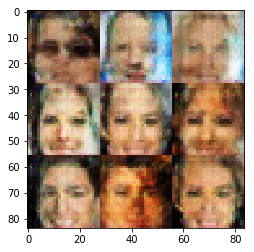

Epoch 3/5... Discriminator Loss: 1.3944... Generator Loss: 0.6710
Epoch 3/5... Discriminator Loss: 1.4178... Generator Loss: 0.6841
Epoch 3/5... Discriminator Loss: 1.4049... Generator Loss: 0.6895
Epoch 3/5... Discriminator Loss: 1.3970... Generator Loss: 0.6879
Epoch 3/5... Discriminator Loss: 1.4030... Generator Loss: 0.6698
Epoch 3/5... Discriminator Loss: 1.4039... Generator Loss: 0.6587
Epoch 3/5... Discriminator Loss: 1.4189... Generator Loss: 0.6752
Epoch 3/5... Discriminator Loss: 1.3987... Generator Loss: 0.6879
Epoch 3/5... Discriminator Loss: 1.4126... Generator Loss: 0.6864
Epoch 3/5... Discriminator Loss: 1.3940... Generator Loss: 0.6902


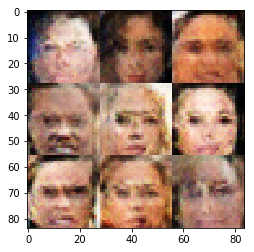

Epoch 3/5... Discriminator Loss: 1.4134... Generator Loss: 0.6706
Epoch 3/5... Discriminator Loss: 1.4099... Generator Loss: 0.6603
Epoch 3/5... Discriminator Loss: 1.3962... Generator Loss: 0.6855
Epoch 3/5... Discriminator Loss: 1.4134... Generator Loss: 0.6697
Epoch 3/5... Discriminator Loss: 1.4015... Generator Loss: 0.6756
Epoch 3/5... Discriminator Loss: 1.3960... Generator Loss: 0.6931
Epoch 3/5... Discriminator Loss: 1.3963... Generator Loss: 0.6955
Epoch 3/5... Discriminator Loss: 1.4232... Generator Loss: 0.6608
Epoch 3/5... Discriminator Loss: 1.4014... Generator Loss: 0.6827
Epoch 3/5... Discriminator Loss: 1.4041... Generator Loss: 0.6676


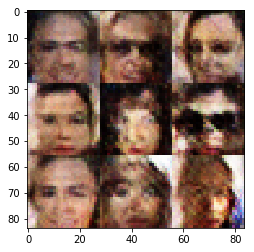

Epoch 3/5... Discriminator Loss: 1.4104... Generator Loss: 0.6884
Epoch 3/5... Discriminator Loss: 1.4246... Generator Loss: 0.6602
Epoch 3/5... Discriminator Loss: 1.4103... Generator Loss: 0.6860
Epoch 3/5... Discriminator Loss: 1.4313... Generator Loss: 0.6611
Epoch 3/5... Discriminator Loss: 1.3985... Generator Loss: 0.6895
Epoch 3/5... Discriminator Loss: 1.4194... Generator Loss: 0.6571
Epoch 3/5... Discriminator Loss: 1.4307... Generator Loss: 0.6815
Epoch 3/5... Discriminator Loss: 1.3980... Generator Loss: 0.6742
Epoch 3/5... Discriminator Loss: 1.4042... Generator Loss: 0.6560
Epoch 3/5... Discriminator Loss: 1.4188... Generator Loss: 0.6842


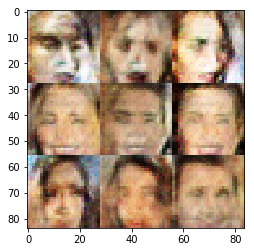

Epoch 3/5... Discriminator Loss: 1.3898... Generator Loss: 0.6846
Epoch 3/5... Discriminator Loss: 1.4173... Generator Loss: 0.6576
Epoch 3/5... Discriminator Loss: 1.4101... Generator Loss: 0.6573
Epoch 3/5... Discriminator Loss: 1.3974... Generator Loss: 0.6970
Epoch 3/5... Discriminator Loss: 1.3914... Generator Loss: 0.6882
Epoch 3/5... Discriminator Loss: 1.4138... Generator Loss: 0.6655
Epoch 3/5... Discriminator Loss: 1.4009... Generator Loss: 0.6914
Epoch 3/5... Discriminator Loss: 1.4095... Generator Loss: 0.6756
Epoch 3/5... Discriminator Loss: 1.4066... Generator Loss: 0.7049
Epoch 3/5... Discriminator Loss: 1.3944... Generator Loss: 0.6776


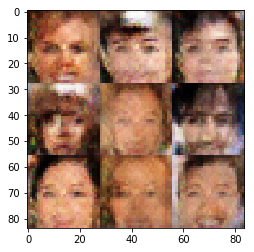

Epoch 3/5... Discriminator Loss: 1.3990... Generator Loss: 0.6658
Epoch 3/5... Discriminator Loss: 1.4017... Generator Loss: 0.6762
Epoch 3/5... Discriminator Loss: 1.4198... Generator Loss: 0.6928
Epoch 3/5... Discriminator Loss: 1.4022... Generator Loss: 0.6825
Epoch 3/5... Discriminator Loss: 1.3961... Generator Loss: 0.6751
Epoch 3/5... Discriminator Loss: 1.4097... Generator Loss: 0.6742
Epoch 3/5... Discriminator Loss: 1.3935... Generator Loss: 0.6850
Epoch 3/5... Discriminator Loss: 1.3990... Generator Loss: 0.6914
Epoch 3/5... Discriminator Loss: 1.4062... Generator Loss: 0.6787
Epoch 3/5... Discriminator Loss: 1.4097... Generator Loss: 0.6629


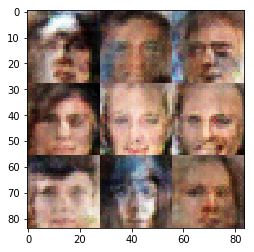

Epoch 3/5... Discriminator Loss: 1.4172... Generator Loss: 0.6838
Epoch 3/5... Discriminator Loss: 1.3880... Generator Loss: 0.6907
Epoch 3/5... Discriminator Loss: 1.3947... Generator Loss: 0.6605
Epoch 3/5... Discriminator Loss: 1.4117... Generator Loss: 0.6740
Epoch 3/5... Discriminator Loss: 1.4080... Generator Loss: 0.6802
Epoch 3/5... Discriminator Loss: 1.4041... Generator Loss: 0.6748
Epoch 3/5... Discriminator Loss: 1.4029... Generator Loss: 0.6687
Epoch 3/5... Discriminator Loss: 1.4093... Generator Loss: 0.6753
Epoch 3/5... Discriminator Loss: 1.4052... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.3807... Generator Loss: 0.6826


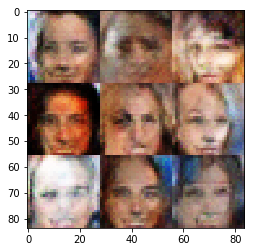

Epoch 3/5... Discriminator Loss: 1.4070... Generator Loss: 0.6906
Epoch 3/5... Discriminator Loss: 1.3932... Generator Loss: 0.6814
Epoch 3/5... Discriminator Loss: 1.4223... Generator Loss: 0.6528
Epoch 3/5... Discriminator Loss: 1.4159... Generator Loss: 0.6706
Epoch 3/5... Discriminator Loss: 1.4043... Generator Loss: 0.6930
Epoch 3/5... Discriminator Loss: 1.4048... Generator Loss: 0.6794
Epoch 3/5... Discriminator Loss: 1.4066... Generator Loss: 0.6796
Epoch 3/5... Discriminator Loss: 1.3958... Generator Loss: 0.6866
Epoch 3/5... Discriminator Loss: 1.4022... Generator Loss: 0.6800
Epoch 3/5... Discriminator Loss: 1.3976... Generator Loss: 0.6864


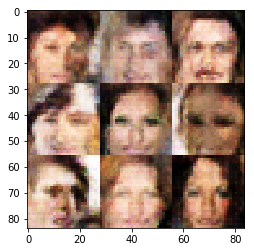

Epoch 3/5... Discriminator Loss: 1.3929... Generator Loss: 0.6652
Epoch 3/5... Discriminator Loss: 1.4218... Generator Loss: 0.6882
Epoch 3/5... Discriminator Loss: 1.4025... Generator Loss: 0.6690
Epoch 3/5... Discriminator Loss: 1.3956... Generator Loss: 0.6782
Epoch 3/5... Discriminator Loss: 1.4022... Generator Loss: 0.6799
Epoch 3/5... Discriminator Loss: 1.4112... Generator Loss: 0.6897
Epoch 3/5... Discriminator Loss: 1.4018... Generator Loss: 0.6816
Epoch 3/5... Discriminator Loss: 1.3964... Generator Loss: 0.6585
Epoch 3/5... Discriminator Loss: 1.4112... Generator Loss: 0.6794
Epoch 3/5... Discriminator Loss: 1.4029... Generator Loss: 0.6829


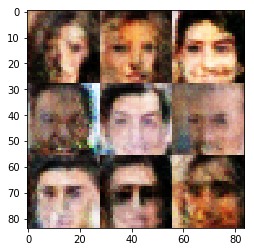

Epoch 3/5... Discriminator Loss: 1.4093... Generator Loss: 0.6659
Epoch 3/5... Discriminator Loss: 1.4007... Generator Loss: 0.6854
Epoch 3/5... Discriminator Loss: 1.3969... Generator Loss: 0.6891
Epoch 3/5... Discriminator Loss: 1.4186... Generator Loss: 0.6630
Epoch 3/5... Discriminator Loss: 1.3980... Generator Loss: 0.6919
Epoch 3/5... Discriminator Loss: 1.3977... Generator Loss: 0.6626
Epoch 3/5... Discriminator Loss: 1.4264... Generator Loss: 0.6759
Epoch 3/5... Discriminator Loss: 1.3990... Generator Loss: 0.6869
Epoch 3/5... Discriminator Loss: 1.4189... Generator Loss: 0.6783
Epoch 3/5... Discriminator Loss: 1.3999... Generator Loss: 0.6762


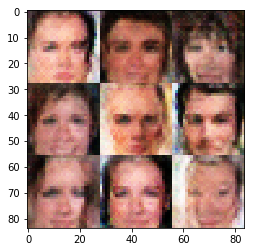

Epoch 3/5... Discriminator Loss: 1.4030... Generator Loss: 0.7009
Epoch 3/5... Discriminator Loss: 1.4224... Generator Loss: 0.6596
Epoch 3/5... Discriminator Loss: 1.4036... Generator Loss: 0.6639
Epoch 3/5... Discriminator Loss: 1.4226... Generator Loss: 0.6654
Epoch 3/5... Discriminator Loss: 1.4243... Generator Loss: 0.6854
Epoch 3/5... Discriminator Loss: 1.4140... Generator Loss: 0.6590
Epoch 4/5... Discriminator Loss: 1.4048... Generator Loss: 0.6838
Epoch 4/5... Discriminator Loss: 1.4058... Generator Loss: 0.6820
Epoch 4/5... Discriminator Loss: 1.4134... Generator Loss: 0.6841
Epoch 4/5... Discriminator Loss: 1.4005... Generator Loss: 0.6716


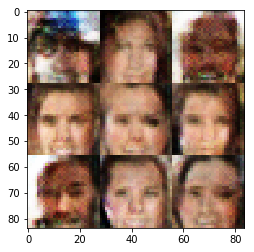

Epoch 4/5... Discriminator Loss: 1.4059... Generator Loss: 0.6694
Epoch 4/5... Discriminator Loss: 1.4164... Generator Loss: 0.6747
Epoch 4/5... Discriminator Loss: 1.3962... Generator Loss: 0.6821
Epoch 4/5... Discriminator Loss: 1.4129... Generator Loss: 0.6667
Epoch 4/5... Discriminator Loss: 1.4384... Generator Loss: 0.6828
Epoch 4/5... Discriminator Loss: 1.4017... Generator Loss: 0.6940
Epoch 4/5... Discriminator Loss: 1.4057... Generator Loss: 0.6606
Epoch 4/5... Discriminator Loss: 1.3962... Generator Loss: 0.6578
Epoch 4/5... Discriminator Loss: 1.4182... Generator Loss: 0.6867
Epoch 4/5... Discriminator Loss: 1.3982... Generator Loss: 0.6921


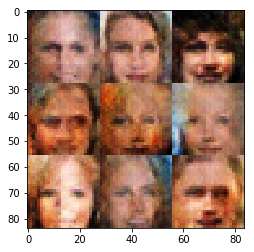

Epoch 4/5... Discriminator Loss: 1.4020... Generator Loss: 0.6696
Epoch 4/5... Discriminator Loss: 1.4235... Generator Loss: 0.6696
Epoch 4/5... Discriminator Loss: 1.4114... Generator Loss: 0.6636
Epoch 4/5... Discriminator Loss: 1.3988... Generator Loss: 0.6932
Epoch 4/5... Discriminator Loss: 1.4086... Generator Loss: 0.6784
Epoch 4/5... Discriminator Loss: 1.4094... Generator Loss: 0.6811
Epoch 4/5... Discriminator Loss: 1.4172... Generator Loss: 0.6498
Epoch 4/5... Discriminator Loss: 1.4206... Generator Loss: 0.6920
Epoch 4/5... Discriminator Loss: 1.4047... Generator Loss: 0.6739
Epoch 4/5... Discriminator Loss: 1.4025... Generator Loss: 0.6764


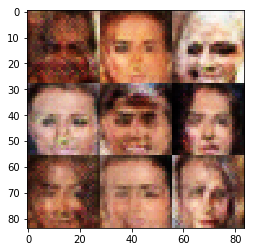

Epoch 4/5... Discriminator Loss: 1.4079... Generator Loss: 0.6747
Epoch 4/5... Discriminator Loss: 1.4020... Generator Loss: 0.6860
Epoch 4/5... Discriminator Loss: 1.4060... Generator Loss: 0.6834
Epoch 4/5... Discriminator Loss: 1.3976... Generator Loss: 0.6847
Epoch 4/5... Discriminator Loss: 1.4010... Generator Loss: 0.6809
Epoch 4/5... Discriminator Loss: 1.4007... Generator Loss: 0.6741
Epoch 4/5... Discriminator Loss: 1.4106... Generator Loss: 0.6677
Epoch 4/5... Discriminator Loss: 1.4089... Generator Loss: 0.6751
Epoch 4/5... Discriminator Loss: 1.4053... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.4111... Generator Loss: 0.6672


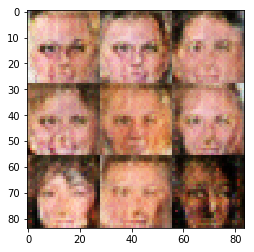

Epoch 4/5... Discriminator Loss: 1.4123... Generator Loss: 0.6694
Epoch 4/5... Discriminator Loss: 1.3964... Generator Loss: 0.6766
Epoch 4/5... Discriminator Loss: 1.4016... Generator Loss: 0.6687
Epoch 4/5... Discriminator Loss: 1.4371... Generator Loss: 0.6816
Epoch 4/5... Discriminator Loss: 1.4205... Generator Loss: 0.6764
Epoch 4/5... Discriminator Loss: 1.3971... Generator Loss: 0.6793
Epoch 4/5... Discriminator Loss: 1.4001... Generator Loss: 0.6857
Epoch 4/5... Discriminator Loss: 1.4079... Generator Loss: 0.6842
Epoch 4/5... Discriminator Loss: 1.3950... Generator Loss: 0.6785
Epoch 4/5... Discriminator Loss: 1.4076... Generator Loss: 0.6690


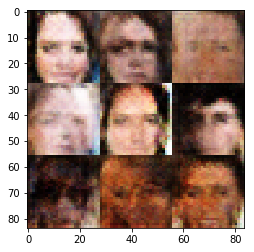

Epoch 4/5... Discriminator Loss: 1.4088... Generator Loss: 0.6829
Epoch 4/5... Discriminator Loss: 1.4121... Generator Loss: 0.6907
Epoch 4/5... Discriminator Loss: 1.4023... Generator Loss: 0.6950
Epoch 4/5... Discriminator Loss: 1.4181... Generator Loss: 0.6577
Epoch 4/5... Discriminator Loss: 1.4105... Generator Loss: 0.6747
Epoch 4/5... Discriminator Loss: 1.4036... Generator Loss: 0.6858
Epoch 4/5... Discriminator Loss: 1.3965... Generator Loss: 0.6761
Epoch 4/5... Discriminator Loss: 1.4145... Generator Loss: 0.6707
Epoch 4/5... Discriminator Loss: 1.4146... Generator Loss: 0.6799
Epoch 4/5... Discriminator Loss: 1.3849... Generator Loss: 0.7035


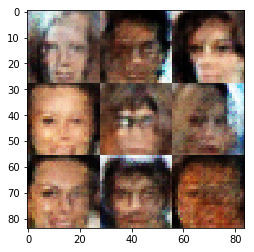

Epoch 4/5... Discriminator Loss: 1.4080... Generator Loss: 0.6792
Epoch 4/5... Discriminator Loss: 1.4134... Generator Loss: 0.6658
Epoch 4/5... Discriminator Loss: 1.3940... Generator Loss: 0.6735
Epoch 4/5... Discriminator Loss: 1.4168... Generator Loss: 0.6689
Epoch 4/5... Discriminator Loss: 1.4209... Generator Loss: 0.6855
Epoch 4/5... Discriminator Loss: 1.3944... Generator Loss: 0.6952
Epoch 4/5... Discriminator Loss: 1.4072... Generator Loss: 0.6741
Epoch 4/5... Discriminator Loss: 1.4083... Generator Loss: 0.6670
Epoch 4/5... Discriminator Loss: 1.4196... Generator Loss: 0.6745
Epoch 4/5... Discriminator Loss: 1.3942... Generator Loss: 0.6807


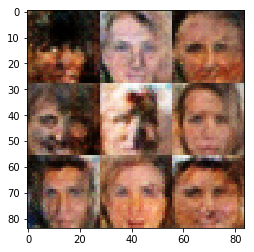

Epoch 4/5... Discriminator Loss: 1.4178... Generator Loss: 0.6570
Epoch 4/5... Discriminator Loss: 1.4126... Generator Loss: 0.6819
Epoch 4/5... Discriminator Loss: 1.4107... Generator Loss: 0.6779
Epoch 4/5... Discriminator Loss: 1.3950... Generator Loss: 0.6784
Epoch 4/5... Discriminator Loss: 1.4383... Generator Loss: 0.6685
Epoch 4/5... Discriminator Loss: 1.4069... Generator Loss: 0.6693
Epoch 4/5... Discriminator Loss: 1.4087... Generator Loss: 0.6811
Epoch 4/5... Discriminator Loss: 1.4092... Generator Loss: 0.6826
Epoch 4/5... Discriminator Loss: 1.4248... Generator Loss: 0.6518
Epoch 4/5... Discriminator Loss: 1.4061... Generator Loss: 0.6825


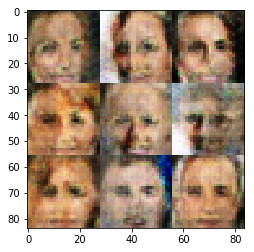

Epoch 4/5... Discriminator Loss: 1.4052... Generator Loss: 0.6843
Epoch 4/5... Discriminator Loss: 1.4201... Generator Loss: 0.6790
Epoch 4/5... Discriminator Loss: 1.3991... Generator Loss: 0.6731
Epoch 4/5... Discriminator Loss: 1.4174... Generator Loss: 0.6675
Epoch 4/5... Discriminator Loss: 1.3994... Generator Loss: 0.6829
Epoch 4/5... Discriminator Loss: 1.4045... Generator Loss: 0.6801
Epoch 4/5... Discriminator Loss: 1.4159... Generator Loss: 0.6647
Epoch 4/5... Discriminator Loss: 1.4063... Generator Loss: 0.6809
Epoch 4/5... Discriminator Loss: 1.3947... Generator Loss: 0.6762
Epoch 4/5... Discriminator Loss: 1.4086... Generator Loss: 0.6756


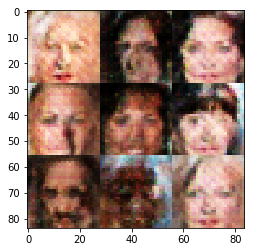

Epoch 4/5... Discriminator Loss: 1.4041... Generator Loss: 0.6779
Epoch 4/5... Discriminator Loss: 1.4030... Generator Loss: 0.6749
Epoch 4/5... Discriminator Loss: 1.4067... Generator Loss: 0.6841
Epoch 4/5... Discriminator Loss: 1.4015... Generator Loss: 0.6803
Epoch 4/5... Discriminator Loss: 1.3983... Generator Loss: 0.6870
Epoch 4/5... Discriminator Loss: 1.4115... Generator Loss: 0.6732
Epoch 4/5... Discriminator Loss: 1.4109... Generator Loss: 0.6811
Epoch 4/5... Discriminator Loss: 1.4012... Generator Loss: 0.6744
Epoch 4/5... Discriminator Loss: 1.4072... Generator Loss: 0.6765
Epoch 4/5... Discriminator Loss: 1.4026... Generator Loss: 0.6804


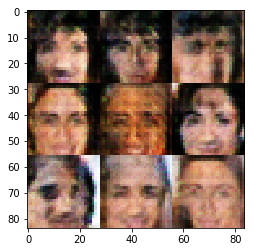

Epoch 4/5... Discriminator Loss: 1.4065... Generator Loss: 0.6913
Epoch 4/5... Discriminator Loss: 1.3882... Generator Loss: 0.6941
Epoch 4/5... Discriminator Loss: 1.3940... Generator Loss: 0.6763
Epoch 4/5... Discriminator Loss: 1.4240... Generator Loss: 0.6672
Epoch 4/5... Discriminator Loss: 1.3979... Generator Loss: 0.6871
Epoch 4/5... Discriminator Loss: 1.4227... Generator Loss: 0.6837
Epoch 4/5... Discriminator Loss: 1.4190... Generator Loss: 0.6661
Epoch 4/5... Discriminator Loss: 1.3881... Generator Loss: 0.6840
Epoch 4/5... Discriminator Loss: 1.4013... Generator Loss: 0.6817
Epoch 4/5... Discriminator Loss: 1.4031... Generator Loss: 0.6850


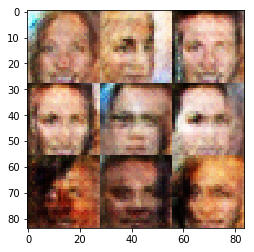

Epoch 4/5... Discriminator Loss: 1.3903... Generator Loss: 0.6774
Epoch 4/5... Discriminator Loss: 1.4197... Generator Loss: 0.6620
Epoch 4/5... Discriminator Loss: 1.4152... Generator Loss: 0.6750
Epoch 4/5... Discriminator Loss: 1.3957... Generator Loss: 0.6738
Epoch 4/5... Discriminator Loss: 1.4113... Generator Loss: 0.6625
Epoch 4/5... Discriminator Loss: 1.4014... Generator Loss: 0.6810
Epoch 4/5... Discriminator Loss: 1.4056... Generator Loss: 0.6868
Epoch 4/5... Discriminator Loss: 1.4032... Generator Loss: 0.6794
Epoch 4/5... Discriminator Loss: 1.3936... Generator Loss: 0.6721
Epoch 4/5... Discriminator Loss: 1.4076... Generator Loss: 0.6894


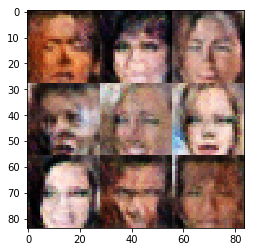

Epoch 4/5... Discriminator Loss: 1.3974... Generator Loss: 0.6886
Epoch 4/5... Discriminator Loss: 1.4088... Generator Loss: 0.6624
Epoch 4/5... Discriminator Loss: 1.3918... Generator Loss: 0.6878
Epoch 4/5... Discriminator Loss: 1.4093... Generator Loss: 0.6687
Epoch 4/5... Discriminator Loss: 1.4146... Generator Loss: 0.6792
Epoch 4/5... Discriminator Loss: 1.4055... Generator Loss: 0.6750
Epoch 4/5... Discriminator Loss: 1.4078... Generator Loss: 0.6854
Epoch 4/5... Discriminator Loss: 1.4071... Generator Loss: 0.6740
Epoch 4/5... Discriminator Loss: 1.4083... Generator Loss: 0.6837
Epoch 4/5... Discriminator Loss: 1.4085... Generator Loss: 0.6790


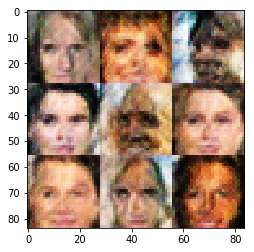

Epoch 4/5... Discriminator Loss: 1.3935... Generator Loss: 0.6852
Epoch 4/5... Discriminator Loss: 1.4069... Generator Loss: 0.6865
Epoch 4/5... Discriminator Loss: 1.3984... Generator Loss: 0.6804
Epoch 4/5... Discriminator Loss: 1.3980... Generator Loss: 0.6813
Epoch 4/5... Discriminator Loss: 1.4075... Generator Loss: 0.6935
Epoch 4/5... Discriminator Loss: 1.3885... Generator Loss: 0.6850
Epoch 4/5... Discriminator Loss: 1.3969... Generator Loss: 0.6726
Epoch 4/5... Discriminator Loss: 1.4053... Generator Loss: 0.6744
Epoch 4/5... Discriminator Loss: 1.4028... Generator Loss: 0.6856
Epoch 4/5... Discriminator Loss: 1.3949... Generator Loss: 0.6852


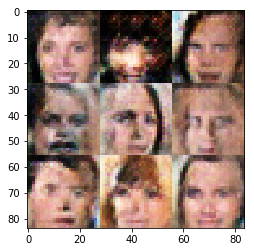

Epoch 4/5... Discriminator Loss: 1.4003... Generator Loss: 0.6710
Epoch 4/5... Discriminator Loss: 1.4053... Generator Loss: 0.6769
Epoch 4/5... Discriminator Loss: 1.4030... Generator Loss: 0.6871
Epoch 4/5... Discriminator Loss: 1.4017... Generator Loss: 0.6804
Epoch 4/5... Discriminator Loss: 1.3975... Generator Loss: 0.6819
Epoch 4/5... Discriminator Loss: 1.3898... Generator Loss: 0.6844
Epoch 4/5... Discriminator Loss: 1.4167... Generator Loss: 0.6815
Epoch 4/5... Discriminator Loss: 1.4033... Generator Loss: 0.6607
Epoch 4/5... Discriminator Loss: 1.3931... Generator Loss: 0.6688
Epoch 4/5... Discriminator Loss: 1.4047... Generator Loss: 0.6801


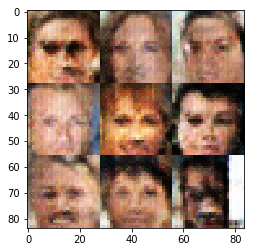

Epoch 4/5... Discriminator Loss: 1.3990... Generator Loss: 0.6848
Epoch 4/5... Discriminator Loss: 1.4010... Generator Loss: 0.6716
Epoch 4/5... Discriminator Loss: 1.4026... Generator Loss: 0.6869
Epoch 4/5... Discriminator Loss: 1.4037... Generator Loss: 0.6837
Epoch 4/5... Discriminator Loss: 1.4034... Generator Loss: 0.6727
Epoch 4/5... Discriminator Loss: 1.3912... Generator Loss: 0.6762
Epoch 4/5... Discriminator Loss: 1.4064... Generator Loss: 0.6907
Epoch 4/5... Discriminator Loss: 1.3966... Generator Loss: 0.6996
Epoch 4/5... Discriminator Loss: 1.4042... Generator Loss: 0.6667
Epoch 4/5... Discriminator Loss: 1.3920... Generator Loss: 0.6780


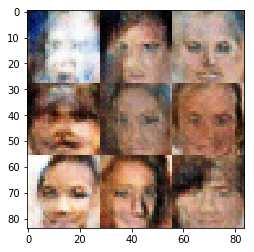

Epoch 4/5... Discriminator Loss: 1.3993... Generator Loss: 0.6784
Epoch 4/5... Discriminator Loss: 1.3957... Generator Loss: 0.6928
Epoch 4/5... Discriminator Loss: 1.3977... Generator Loss: 0.6837
Epoch 4/5... Discriminator Loss: 1.3914... Generator Loss: 0.6812
Epoch 4/5... Discriminator Loss: 1.4070... Generator Loss: 0.6920
Epoch 4/5... Discriminator Loss: 1.3954... Generator Loss: 0.6769
Epoch 4/5... Discriminator Loss: 1.3982... Generator Loss: 0.6856
Epoch 4/5... Discriminator Loss: 1.4103... Generator Loss: 0.6671
Epoch 4/5... Discriminator Loss: 1.3998... Generator Loss: 0.6803
Epoch 4/5... Discriminator Loss: 1.4030... Generator Loss: 0.6775


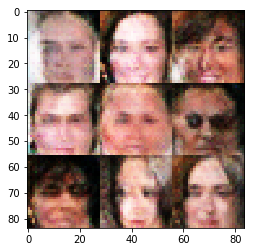

Epoch 4/5... Discriminator Loss: 1.4045... Generator Loss: 0.6809
Epoch 4/5... Discriminator Loss: 1.3885... Generator Loss: 0.6930
Epoch 4/5... Discriminator Loss: 1.4105... Generator Loss: 0.6751
Epoch 4/5... Discriminator Loss: 1.3921... Generator Loss: 0.6900
Epoch 4/5... Discriminator Loss: 1.3996... Generator Loss: 0.6696
Epoch 4/5... Discriminator Loss: 1.3904... Generator Loss: 0.6760
Epoch 4/5... Discriminator Loss: 1.3979... Generator Loss: 0.6840
Epoch 4/5... Discriminator Loss: 1.4156... Generator Loss: 0.6771
Epoch 4/5... Discriminator Loss: 1.4017... Generator Loss: 0.6867
Epoch 4/5... Discriminator Loss: 1.3961... Generator Loss: 0.6874


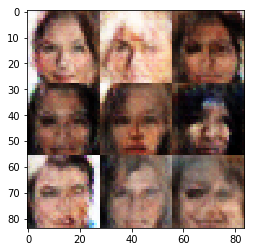

Epoch 4/5... Discriminator Loss: 1.3933... Generator Loss: 0.6849
Epoch 4/5... Discriminator Loss: 1.4073... Generator Loss: 0.6752
Epoch 4/5... Discriminator Loss: 1.3993... Generator Loss: 0.6709
Epoch 4/5... Discriminator Loss: 1.4116... Generator Loss: 0.6793
Epoch 4/5... Discriminator Loss: 1.3925... Generator Loss: 0.6850
Epoch 4/5... Discriminator Loss: 1.4046... Generator Loss: 0.6763
Epoch 4/5... Discriminator Loss: 1.4105... Generator Loss: 0.6968
Epoch 4/5... Discriminator Loss: 1.3972... Generator Loss: 0.6909
Epoch 4/5... Discriminator Loss: 1.3944... Generator Loss: 0.6711
Epoch 4/5... Discriminator Loss: 1.3931... Generator Loss: 0.6791


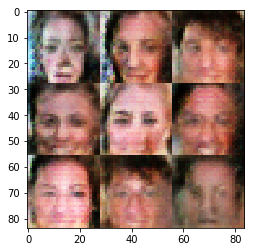

Epoch 4/5... Discriminator Loss: 1.4141... Generator Loss: 0.6815
Epoch 4/5... Discriminator Loss: 1.3974... Generator Loss: 0.6861
Epoch 4/5... Discriminator Loss: 1.4064... Generator Loss: 0.6700
Epoch 4/5... Discriminator Loss: 1.4003... Generator Loss: 0.6827
Epoch 4/5... Discriminator Loss: 1.3922... Generator Loss: 0.6795
Epoch 4/5... Discriminator Loss: 1.3988... Generator Loss: 0.6754
Epoch 4/5... Discriminator Loss: 1.3922... Generator Loss: 0.6908
Epoch 4/5... Discriminator Loss: 1.3966... Generator Loss: 0.6889
Epoch 4/5... Discriminator Loss: 1.3949... Generator Loss: 0.6817
Epoch 4/5... Discriminator Loss: 1.4017... Generator Loss: 0.6788


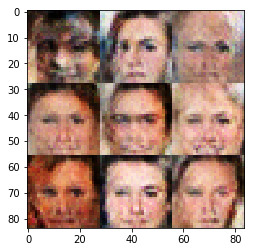

Epoch 4/5... Discriminator Loss: 1.4013... Generator Loss: 0.6924
Epoch 4/5... Discriminator Loss: 1.3980... Generator Loss: 0.6801
Epoch 4/5... Discriminator Loss: 1.3956... Generator Loss: 0.6843
Epoch 4/5... Discriminator Loss: 1.4022... Generator Loss: 0.6665
Epoch 4/5... Discriminator Loss: 1.3979... Generator Loss: 0.6878
Epoch 4/5... Discriminator Loss: 1.4011... Generator Loss: 0.6729
Epoch 4/5... Discriminator Loss: 1.4010... Generator Loss: 0.6824
Epoch 4/5... Discriminator Loss: 1.4049... Generator Loss: 0.6912
Epoch 4/5... Discriminator Loss: 1.3998... Generator Loss: 0.6757
Epoch 4/5... Discriminator Loss: 1.3975... Generator Loss: 0.6556


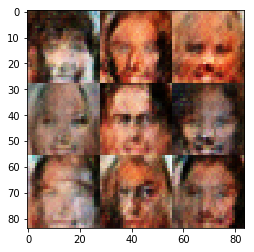

Epoch 4/5... Discriminator Loss: 1.4055... Generator Loss: 0.6896
Epoch 4/5... Discriminator Loss: 1.3906... Generator Loss: 0.6905
Epoch 4/5... Discriminator Loss: 1.4048... Generator Loss: 0.6745
Epoch 4/5... Discriminator Loss: 1.3996... Generator Loss: 0.6813
Epoch 4/5... Discriminator Loss: 1.3948... Generator Loss: 0.6871
Epoch 4/5... Discriminator Loss: 1.4032... Generator Loss: 0.6835
Epoch 4/5... Discriminator Loss: 1.3969... Generator Loss: 0.6881
Epoch 4/5... Discriminator Loss: 1.3918... Generator Loss: 0.6915
Epoch 4/5... Discriminator Loss: 1.3965... Generator Loss: 0.6796
Epoch 4/5... Discriminator Loss: 1.3984... Generator Loss: 0.6837


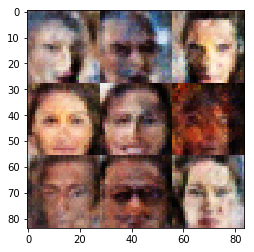

Epoch 4/5... Discriminator Loss: 1.4014... Generator Loss: 0.6841
Epoch 4/5... Discriminator Loss: 1.3986... Generator Loss: 0.6826
Epoch 4/5... Discriminator Loss: 1.3996... Generator Loss: 0.6749
Epoch 4/5... Discriminator Loss: 1.4039... Generator Loss: 0.6946
Epoch 4/5... Discriminator Loss: 1.3958... Generator Loss: 0.6828
Epoch 4/5... Discriminator Loss: 1.4103... Generator Loss: 0.6733
Epoch 4/5... Discriminator Loss: 1.3896... Generator Loss: 0.6789
Epoch 4/5... Discriminator Loss: 1.3959... Generator Loss: 0.6881
Epoch 4/5... Discriminator Loss: 1.3917... Generator Loss: 0.6852
Epoch 4/5... Discriminator Loss: 1.3974... Generator Loss: 0.6885


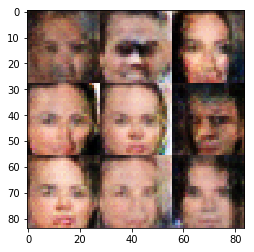

Epoch 4/5... Discriminator Loss: 1.3896... Generator Loss: 0.6851
Epoch 4/5... Discriminator Loss: 1.4094... Generator Loss: 0.6727
Epoch 4/5... Discriminator Loss: 1.4072... Generator Loss: 0.6842
Epoch 4/5... Discriminator Loss: 1.3923... Generator Loss: 0.6850
Epoch 4/5... Discriminator Loss: 1.4050... Generator Loss: 0.6865
Epoch 4/5... Discriminator Loss: 1.3971... Generator Loss: 0.6900
Epoch 4/5... Discriminator Loss: 1.4030... Generator Loss: 0.6722
Epoch 4/5... Discriminator Loss: 1.3936... Generator Loss: 0.6846
Epoch 4/5... Discriminator Loss: 1.4019... Generator Loss: 0.6711
Epoch 4/5... Discriminator Loss: 1.4149... Generator Loss: 0.6690


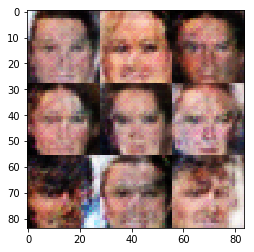

Epoch 4/5... Discriminator Loss: 1.3958... Generator Loss: 0.6821
Epoch 4/5... Discriminator Loss: 1.4149... Generator Loss: 0.6840
Epoch 4/5... Discriminator Loss: 1.3998... Generator Loss: 0.6777
Epoch 4/5... Discriminator Loss: 1.3942... Generator Loss: 0.6806
Epoch 4/5... Discriminator Loss: 1.4129... Generator Loss: 0.6828
Epoch 4/5... Discriminator Loss: 1.3962... Generator Loss: 0.6833
Epoch 4/5... Discriminator Loss: 1.3863... Generator Loss: 0.6892
Epoch 4/5... Discriminator Loss: 1.4020... Generator Loss: 0.6852
Epoch 4/5... Discriminator Loss: 1.3995... Generator Loss: 0.6800
Epoch 4/5... Discriminator Loss: 1.4013... Generator Loss: 0.6844


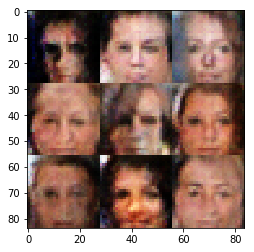

Epoch 4/5... Discriminator Loss: 1.3955... Generator Loss: 0.6860
Epoch 4/5... Discriminator Loss: 1.4001... Generator Loss: 0.6775
Epoch 4/5... Discriminator Loss: 1.4078... Generator Loss: 0.6656
Epoch 4/5... Discriminator Loss: 1.3922... Generator Loss: 0.6756
Epoch 4/5... Discriminator Loss: 1.4075... Generator Loss: 0.6631
Epoch 4/5... Discriminator Loss: 1.4227... Generator Loss: 0.6698
Epoch 4/5... Discriminator Loss: 1.4009... Generator Loss: 0.6753
Epoch 4/5... Discriminator Loss: 1.4090... Generator Loss: 0.6868
Epoch 4/5... Discriminator Loss: 1.4045... Generator Loss: 0.6598
Epoch 4/5... Discriminator Loss: 1.4274... Generator Loss: 0.6809


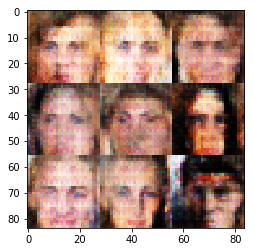

Epoch 4/5... Discriminator Loss: 1.3924... Generator Loss: 0.7002
Epoch 4/5... Discriminator Loss: 1.4152... Generator Loss: 0.6697
Epoch 4/5... Discriminator Loss: 1.3931... Generator Loss: 0.6737
Epoch 4/5... Discriminator Loss: 1.3988... Generator Loss: 0.6896
Epoch 4/5... Discriminator Loss: 1.3979... Generator Loss: 0.7018
Epoch 4/5... Discriminator Loss: 1.3963... Generator Loss: 0.6866
Epoch 4/5... Discriminator Loss: 1.3973... Generator Loss: 0.6729
Epoch 4/5... Discriminator Loss: 1.4025... Generator Loss: 0.6799
Epoch 4/5... Discriminator Loss: 1.3952... Generator Loss: 0.6863
Epoch 4/5... Discriminator Loss: 1.4057... Generator Loss: 0.6846


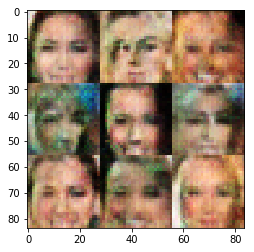

Epoch 4/5... Discriminator Loss: 1.4064... Generator Loss: 0.6676
Epoch 4/5... Discriminator Loss: 1.4046... Generator Loss: 0.6817
Epoch 4/5... Discriminator Loss: 1.4011... Generator Loss: 0.6812
Epoch 4/5... Discriminator Loss: 1.3833... Generator Loss: 0.6832
Epoch 4/5... Discriminator Loss: 1.4028... Generator Loss: 0.6773
Epoch 4/5... Discriminator Loss: 1.4006... Generator Loss: 0.6856
Epoch 4/5... Discriminator Loss: 1.3977... Generator Loss: 0.6739
Epoch 4/5... Discriminator Loss: 1.3946... Generator Loss: 0.6911
Epoch 4/5... Discriminator Loss: 1.3950... Generator Loss: 0.6797
Epoch 4/5... Discriminator Loss: 1.3974... Generator Loss: 0.6786


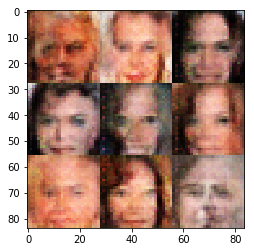

Epoch 4/5... Discriminator Loss: 1.4024... Generator Loss: 0.6774
Epoch 4/5... Discriminator Loss: 1.4033... Generator Loss: 0.6822
Epoch 4/5... Discriminator Loss: 1.3937... Generator Loss: 0.6925
Epoch 4/5... Discriminator Loss: 1.4005... Generator Loss: 0.6786
Epoch 4/5... Discriminator Loss: 1.3978... Generator Loss: 0.6760
Epoch 4/5... Discriminator Loss: 1.3846... Generator Loss: 0.6869
Epoch 4/5... Discriminator Loss: 1.4113... Generator Loss: 0.6791
Epoch 4/5... Discriminator Loss: 1.3962... Generator Loss: 0.6873
Epoch 4/5... Discriminator Loss: 1.3974... Generator Loss: 0.6781
Epoch 4/5... Discriminator Loss: 1.4089... Generator Loss: 0.6844


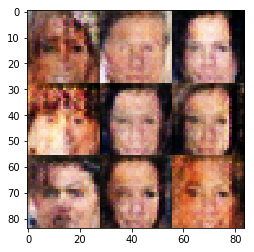

Epoch 4/5... Discriminator Loss: 1.3968... Generator Loss: 0.6870
Epoch 4/5... Discriminator Loss: 1.3887... Generator Loss: 0.6904
Epoch 4/5... Discriminator Loss: 1.3952... Generator Loss: 0.6910
Epoch 4/5... Discriminator Loss: 1.4065... Generator Loss: 0.6797
Epoch 4/5... Discriminator Loss: 1.4013... Generator Loss: 0.6832
Epoch 4/5... Discriminator Loss: 1.3899... Generator Loss: 0.6937
Epoch 4/5... Discriminator Loss: 1.3989... Generator Loss: 0.6816
Epoch 4/5... Discriminator Loss: 1.3986... Generator Loss: 0.6719
Epoch 4/5... Discriminator Loss: 1.3890... Generator Loss: 0.6866
Epoch 4/5... Discriminator Loss: 1.4059... Generator Loss: 0.6797


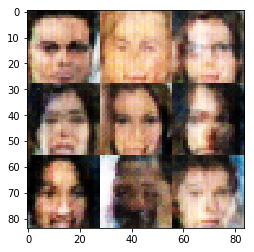

Epoch 4/5... Discriminator Loss: 1.3980... Generator Loss: 0.6864
Epoch 4/5... Discriminator Loss: 1.4117... Generator Loss: 0.6751
Epoch 4/5... Discriminator Loss: 1.4014... Generator Loss: 0.6787
Epoch 4/5... Discriminator Loss: 1.3999... Generator Loss: 0.6881
Epoch 4/5... Discriminator Loss: 1.4096... Generator Loss: 0.6721
Epoch 4/5... Discriminator Loss: 1.3940... Generator Loss: 0.6763
Epoch 4/5... Discriminator Loss: 1.4020... Generator Loss: 0.6735
Epoch 4/5... Discriminator Loss: 1.4118... Generator Loss: 0.6839
Epoch 4/5... Discriminator Loss: 1.3980... Generator Loss: 0.6818
Epoch 4/5... Discriminator Loss: 1.3867... Generator Loss: 0.6879


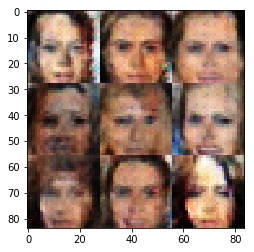

Epoch 4/5... Discriminator Loss: 1.4069... Generator Loss: 0.6838
Epoch 4/5... Discriminator Loss: 1.4025... Generator Loss: 0.6824
Epoch 4/5... Discriminator Loss: 1.3910... Generator Loss: 0.6891
Epoch 4/5... Discriminator Loss: 1.3969... Generator Loss: 0.6823
Epoch 4/5... Discriminator Loss: 1.3990... Generator Loss: 0.6748
Epoch 4/5... Discriminator Loss: 1.4092... Generator Loss: 0.6770
Epoch 4/5... Discriminator Loss: 1.4013... Generator Loss: 0.6795
Epoch 4/5... Discriminator Loss: 1.3929... Generator Loss: 0.6891
Epoch 4/5... Discriminator Loss: 1.4048... Generator Loss: 0.6788
Epoch 4/5... Discriminator Loss: 1.3962... Generator Loss: 0.6889


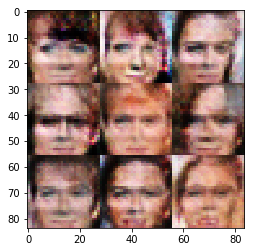

Epoch 4/5... Discriminator Loss: 1.3900... Generator Loss: 0.6875
Epoch 4/5... Discriminator Loss: 1.3986... Generator Loss: 0.6869
Epoch 4/5... Discriminator Loss: 1.3983... Generator Loss: 0.6866
Epoch 4/5... Discriminator Loss: 1.4009... Generator Loss: 0.6758
Epoch 4/5... Discriminator Loss: 1.3979... Generator Loss: 0.6846
Epoch 4/5... Discriminator Loss: 1.3913... Generator Loss: 0.6888
Epoch 4/5... Discriminator Loss: 1.3982... Generator Loss: 0.6791
Epoch 4/5... Discriminator Loss: 1.3994... Generator Loss: 0.6899
Epoch 4/5... Discriminator Loss: 1.3904... Generator Loss: 0.6931
Epoch 4/5... Discriminator Loss: 1.4050... Generator Loss: 0.6800


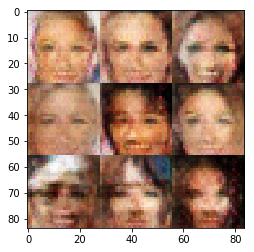

Epoch 4/5... Discriminator Loss: 1.3908... Generator Loss: 0.6762
Epoch 4/5... Discriminator Loss: 1.3879... Generator Loss: 0.6797
Epoch 4/5... Discriminator Loss: 1.4037... Generator Loss: 0.6843
Epoch 4/5... Discriminator Loss: 1.4000... Generator Loss: 0.6905
Epoch 4/5... Discriminator Loss: 1.3926... Generator Loss: 0.6847
Epoch 4/5... Discriminator Loss: 1.4003... Generator Loss: 0.6873
Epoch 4/5... Discriminator Loss: 1.3912... Generator Loss: 0.6879
Epoch 4/5... Discriminator Loss: 1.4009... Generator Loss: 0.6749
Epoch 4/5... Discriminator Loss: 1.3971... Generator Loss: 0.6817
Epoch 4/5... Discriminator Loss: 1.4039... Generator Loss: 0.6883


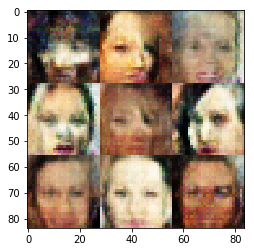

Epoch 4/5... Discriminator Loss: 1.4039... Generator Loss: 0.6884
Epoch 4/5... Discriminator Loss: 1.3975... Generator Loss: 0.6829
Epoch 4/5... Discriminator Loss: 1.3977... Generator Loss: 0.6744
Epoch 4/5... Discriminator Loss: 1.3969... Generator Loss: 0.6850
Epoch 4/5... Discriminator Loss: 1.3949... Generator Loss: 0.6920
Epoch 4/5... Discriminator Loss: 1.3934... Generator Loss: 0.6880
Epoch 4/5... Discriminator Loss: 1.3956... Generator Loss: 0.6742
Epoch 4/5... Discriminator Loss: 1.3913... Generator Loss: 0.6808
Epoch 4/5... Discriminator Loss: 1.3988... Generator Loss: 0.6940
Epoch 4/5... Discriminator Loss: 1.3931... Generator Loss: 0.6911


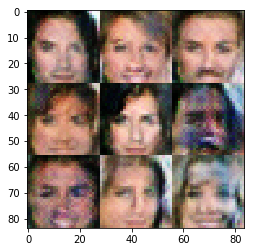

Epoch 4/5... Discriminator Loss: 1.3959... Generator Loss: 0.6810
Epoch 4/5... Discriminator Loss: 1.3966... Generator Loss: 0.6770
Epoch 4/5... Discriminator Loss: 1.3930... Generator Loss: 0.6798
Epoch 4/5... Discriminator Loss: 1.3979... Generator Loss: 0.6842
Epoch 4/5... Discriminator Loss: 1.3944... Generator Loss: 0.6937
Epoch 4/5... Discriminator Loss: 1.3940... Generator Loss: 0.6775
Epoch 4/5... Discriminator Loss: 1.3956... Generator Loss: 0.6772
Epoch 4/5... Discriminator Loss: 1.4073... Generator Loss: 0.6848
Epoch 4/5... Discriminator Loss: 1.4008... Generator Loss: 0.6878
Epoch 4/5... Discriminator Loss: 1.3891... Generator Loss: 0.6951


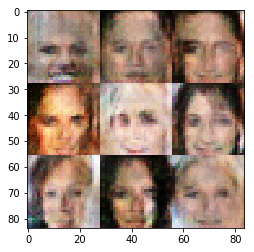

Epoch 4/5... Discriminator Loss: 1.3973... Generator Loss: 0.6773
Epoch 4/5... Discriminator Loss: 1.3923... Generator Loss: 0.6812
Epoch 4/5... Discriminator Loss: 1.3998... Generator Loss: 0.6877
Epoch 4/5... Discriminator Loss: 1.3961... Generator Loss: 0.6854
Epoch 4/5... Discriminator Loss: 1.4047... Generator Loss: 0.6805
Epoch 4/5... Discriminator Loss: 1.3905... Generator Loss: 0.6868
Epoch 4/5... Discriminator Loss: 1.4029... Generator Loss: 0.6896
Epoch 4/5... Discriminator Loss: 1.4010... Generator Loss: 0.6725
Epoch 4/5... Discriminator Loss: 1.3979... Generator Loss: 0.6759
Epoch 4/5... Discriminator Loss: 1.3940... Generator Loss: 0.6766


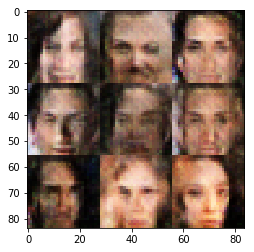

Epoch 4/5... Discriminator Loss: 1.3933... Generator Loss: 0.6876
Epoch 4/5... Discriminator Loss: 1.3991... Generator Loss: 0.6823
Epoch 4/5... Discriminator Loss: 1.3961... Generator Loss: 0.6812
Epoch 4/5... Discriminator Loss: 1.3959... Generator Loss: 0.6860
Epoch 4/5... Discriminator Loss: 1.3965... Generator Loss: 0.6944
Epoch 4/5... Discriminator Loss: 1.3947... Generator Loss: 0.6893
Epoch 4/5... Discriminator Loss: 1.4004... Generator Loss: 0.6768
Epoch 4/5... Discriminator Loss: 1.3925... Generator Loss: 0.6922
Epoch 4/5... Discriminator Loss: 1.3970... Generator Loss: 0.6831
Epoch 4/5... Discriminator Loss: 1.3966... Generator Loss: 0.6891


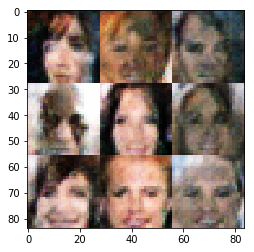

Epoch 4/5... Discriminator Loss: 1.3954... Generator Loss: 0.6833
Epoch 4/5... Discriminator Loss: 1.4016... Generator Loss: 0.6850
Epoch 4/5... Discriminator Loss: 1.3966... Generator Loss: 0.6840
Epoch 4/5... Discriminator Loss: 1.3951... Generator Loss: 0.6875
Epoch 4/5... Discriminator Loss: 1.3981... Generator Loss: 0.6878
Epoch 4/5... Discriminator Loss: 1.3989... Generator Loss: 0.6792
Epoch 4/5... Discriminator Loss: 1.3942... Generator Loss: 0.6793
Epoch 4/5... Discriminator Loss: 1.3885... Generator Loss: 0.6803
Epoch 4/5... Discriminator Loss: 1.3959... Generator Loss: 0.6844
Epoch 4/5... Discriminator Loss: 1.3884... Generator Loss: 0.6862


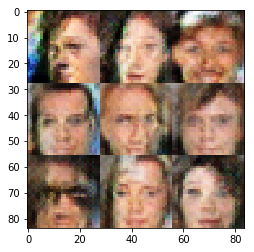

Epoch 4/5... Discriminator Loss: 1.4074... Generator Loss: 0.6745
Epoch 4/5... Discriminator Loss: 1.3891... Generator Loss: 0.6896
Epoch 4/5... Discriminator Loss: 1.4039... Generator Loss: 0.6821
Epoch 4/5... Discriminator Loss: 1.4001... Generator Loss: 0.6866
Epoch 4/5... Discriminator Loss: 1.3880... Generator Loss: 0.6820
Epoch 4/5... Discriminator Loss: 1.3973... Generator Loss: 0.6872
Epoch 4/5... Discriminator Loss: 1.4049... Generator Loss: 0.6781
Epoch 4/5... Discriminator Loss: 1.3874... Generator Loss: 0.6879
Epoch 4/5... Discriminator Loss: 1.4001... Generator Loss: 0.6795
Epoch 4/5... Discriminator Loss: 1.3947... Generator Loss: 0.6819


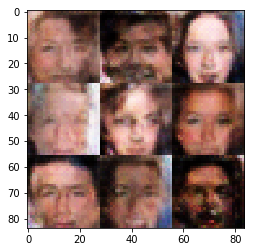

Epoch 4/5... Discriminator Loss: 1.3961... Generator Loss: 0.6886
Epoch 4/5... Discriminator Loss: 1.3969... Generator Loss: 0.6868
Epoch 5/5... Discriminator Loss: 1.3958... Generator Loss: 0.6854
Epoch 5/5... Discriminator Loss: 1.3961... Generator Loss: 0.6850
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3901... Generator Loss: 0.6823
Epoch 5/5... Discriminator Loss: 1.3951... Generator Loss: 0.6859
Epoch 5/5... Discriminator Loss: 1.3982... Generator Loss: 0.6897
Epoch 5/5... Discriminator Loss: 1.3878... Generator Loss: 0.6935
Epoch 5/5... Discriminator Loss: 1.3979... Generator Loss: 0.6781


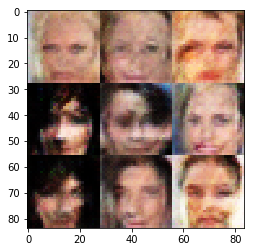

Epoch 5/5... Discriminator Loss: 1.4033... Generator Loss: 0.6913
Epoch 5/5... Discriminator Loss: 1.3923... Generator Loss: 0.6895
Epoch 5/5... Discriminator Loss: 1.3903... Generator Loss: 0.6862
Epoch 5/5... Discriminator Loss: 1.3961... Generator Loss: 0.6819
Epoch 5/5... Discriminator Loss: 1.4039... Generator Loss: 0.6810
Epoch 5/5... Discriminator Loss: 1.3914... Generator Loss: 0.6890
Epoch 5/5... Discriminator Loss: 1.3870... Generator Loss: 0.6908
Epoch 5/5... Discriminator Loss: 1.3960... Generator Loss: 0.6825
Epoch 5/5... Discriminator Loss: 1.3960... Generator Loss: 0.6784
Epoch 5/5... Discriminator Loss: 1.3924... Generator Loss: 0.6828


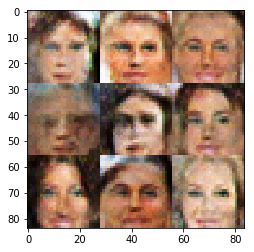

Epoch 5/5... Discriminator Loss: 1.3906... Generator Loss: 0.6935
Epoch 5/5... Discriminator Loss: 1.3927... Generator Loss: 0.6923
Epoch 5/5... Discriminator Loss: 1.4045... Generator Loss: 0.6800
Epoch 5/5... Discriminator Loss: 1.3948... Generator Loss: 0.6793
Epoch 5/5... Discriminator Loss: 1.3940... Generator Loss: 0.6829
Epoch 5/5... Discriminator Loss: 1.4008... Generator Loss: 0.6852
Epoch 5/5... Discriminator Loss: 1.3943... Generator Loss: 0.6825
Epoch 5/5... Discriminator Loss: 1.3980... Generator Loss: 0.6794
Epoch 5/5... Discriminator Loss: 1.4000... Generator Loss: 0.6767
Epoch 5/5... Discriminator Loss: 1.3916... Generator Loss: 0.6829


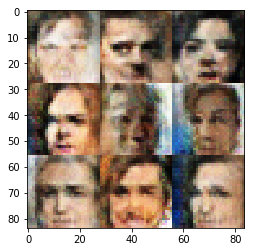

Epoch 5/5... Discriminator Loss: 1.3980... Generator Loss: 0.6838
Epoch 5/5... Discriminator Loss: 1.3961... Generator Loss: 0.6789
Epoch 5/5... Discriminator Loss: 1.3924... Generator Loss: 0.6851
Epoch 5/5... Discriminator Loss: 1.3956... Generator Loss: 0.6930
Epoch 5/5... Discriminator Loss: 1.4017... Generator Loss: 0.6838
Epoch 5/5... Discriminator Loss: 1.3918... Generator Loss: 0.6796
Epoch 5/5... Discriminator Loss: 1.3968... Generator Loss: 0.6756
Epoch 5/5... Discriminator Loss: 1.4060... Generator Loss: 0.6807
Epoch 5/5... Discriminator Loss: 1.4079... Generator Loss: 0.6799
Epoch 5/5... Discriminator Loss: 1.3965... Generator Loss: 0.6816


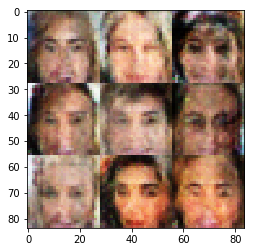

Epoch 5/5... Discriminator Loss: 1.4066... Generator Loss: 0.6876
Epoch 5/5... Discriminator Loss: 1.3862... Generator Loss: 0.6928
Epoch 5/5... Discriminator Loss: 1.3977... Generator Loss: 0.6787
Epoch 5/5... Discriminator Loss: 1.3980... Generator Loss: 0.6796
Epoch 5/5... Discriminator Loss: 1.3908... Generator Loss: 0.6845
Epoch 5/5... Discriminator Loss: 1.4062... Generator Loss: 0.6773
Epoch 5/5... Discriminator Loss: 1.4032... Generator Loss: 0.6774
Epoch 5/5... Discriminator Loss: 1.3908... Generator Loss: 0.6860
Epoch 5/5... Discriminator Loss: 1.4088... Generator Loss: 0.6738
Epoch 5/5... Discriminator Loss: 1.4013... Generator Loss: 0.6864


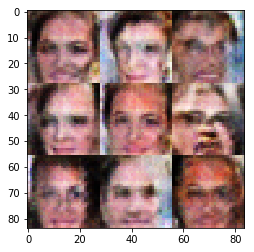

Epoch 5/5... Discriminator Loss: 1.3972... Generator Loss: 0.6851
Epoch 5/5... Discriminator Loss: 1.3949... Generator Loss: 0.6748
Epoch 5/5... Discriminator Loss: 1.3938... Generator Loss: 0.6776
Epoch 5/5... Discriminator Loss: 1.4016... Generator Loss: 0.6772
Epoch 5/5... Discriminator Loss: 1.3937... Generator Loss: 0.6836
Epoch 5/5... Discriminator Loss: 1.3992... Generator Loss: 0.6751
Epoch 5/5... Discriminator Loss: 1.3966... Generator Loss: 0.6859
Epoch 5/5... Discriminator Loss: 1.3943... Generator Loss: 0.6953
Epoch 5/5... Discriminator Loss: 1.3969... Generator Loss: 0.6909
Epoch 5/5... Discriminator Loss: 1.3934... Generator Loss: 0.6911


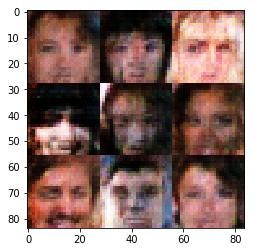

Epoch 5/5... Discriminator Loss: 1.3909... Generator Loss: 0.6810
Epoch 5/5... Discriminator Loss: 1.3970... Generator Loss: 0.6821
Epoch 5/5... Discriminator Loss: 1.3976... Generator Loss: 0.6887
Epoch 5/5... Discriminator Loss: 1.3922... Generator Loss: 0.6932
Epoch 5/5... Discriminator Loss: 1.3997... Generator Loss: 0.6809
Epoch 5/5... Discriminator Loss: 1.3913... Generator Loss: 0.6835
Epoch 5/5... Discriminator Loss: 1.3966... Generator Loss: 0.6799
Epoch 5/5... Discriminator Loss: 1.3917... Generator Loss: 0.6891
Epoch 5/5... Discriminator Loss: 1.3930... Generator Loss: 0.6864
Epoch 5/5... Discriminator Loss: 1.3961... Generator Loss: 0.6807


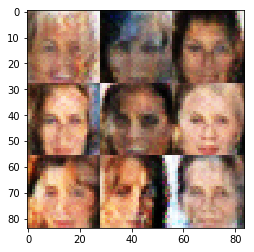

Epoch 5/5... Discriminator Loss: 1.3858... Generator Loss: 0.6889
Epoch 5/5... Discriminator Loss: 1.3951... Generator Loss: 0.6850
Epoch 5/5... Discriminator Loss: 1.4045... Generator Loss: 0.6819
Epoch 5/5... Discriminator Loss: 1.3932... Generator Loss: 0.6834
Epoch 5/5... Discriminator Loss: 1.3924... Generator Loss: 0.6855
Epoch 5/5... Discriminator Loss: 1.3992... Generator Loss: 0.6819
Epoch 5/5... Discriminator Loss: 1.3952... Generator Loss: 0.6866
Epoch 5/5... Discriminator Loss: 1.4004... Generator Loss: 0.6833
Epoch 5/5... Discriminator Loss: 1.3948... Generator Loss: 0.6869
Epoch 5/5... Discriminator Loss: 1.3906... Generator Loss: 0.6840


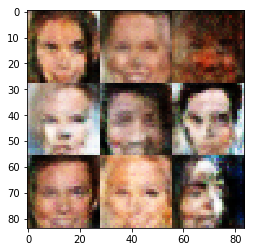

Epoch 5/5... Discriminator Loss: 1.3921... Generator Loss: 0.6874
Epoch 5/5... Discriminator Loss: 1.3935... Generator Loss: 0.6839
Epoch 5/5... Discriminator Loss: 1.3912... Generator Loss: 0.6920
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6862
Epoch 5/5... Discriminator Loss: 1.3991... Generator Loss: 0.6828
Epoch 5/5... Discriminator Loss: 1.4027... Generator Loss: 0.6893
Epoch 5/5... Discriminator Loss: 1.3944... Generator Loss: 0.6807
Epoch 5/5... Discriminator Loss: 1.3916... Generator Loss: 0.6869
Epoch 5/5... Discriminator Loss: 1.4025... Generator Loss: 0.6848
Epoch 5/5... Discriminator Loss: 1.3935... Generator Loss: 0.6812


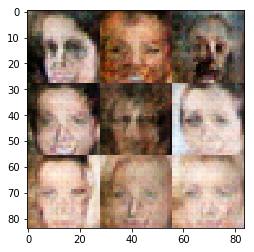

Epoch 5/5... Discriminator Loss: 1.3990... Generator Loss: 0.6846
Epoch 5/5... Discriminator Loss: 1.3929... Generator Loss: 0.6893
Epoch 5/5... Discriminator Loss: 1.3970... Generator Loss: 0.6817
Epoch 5/5... Discriminator Loss: 1.3985... Generator Loss: 0.6844
Epoch 5/5... Discriminator Loss: 1.3935... Generator Loss: 0.6878
Epoch 5/5... Discriminator Loss: 1.3931... Generator Loss: 0.6843
Epoch 5/5... Discriminator Loss: 1.3953... Generator Loss: 0.6881
Epoch 5/5... Discriminator Loss: 1.3910... Generator Loss: 0.6868
Epoch 5/5... Discriminator Loss: 1.3863... Generator Loss: 0.6912
Epoch 5/5... Discriminator Loss: 1.3959... Generator Loss: 0.6826


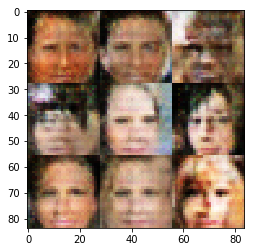

Epoch 5/5... Discriminator Loss: 1.4021... Generator Loss: 0.6744
Epoch 5/5... Discriminator Loss: 1.3924... Generator Loss: 0.6845
Epoch 5/5... Discriminator Loss: 1.4014... Generator Loss: 0.6817
Epoch 5/5... Discriminator Loss: 1.3964... Generator Loss: 0.6827
Epoch 5/5... Discriminator Loss: 1.3958... Generator Loss: 0.6822
Epoch 5/5... Discriminator Loss: 1.3916... Generator Loss: 0.6897
Epoch 5/5... Discriminator Loss: 1.3936... Generator Loss: 0.6931
Epoch 5/5... Discriminator Loss: 1.3976... Generator Loss: 0.6877
Epoch 5/5... Discriminator Loss: 1.3923... Generator Loss: 0.6880
Epoch 5/5... Discriminator Loss: 1.3959... Generator Loss: 0.6852


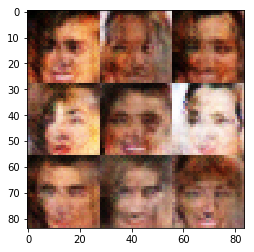

Epoch 5/5... Discriminator Loss: 1.3949... Generator Loss: 0.6923
Epoch 5/5... Discriminator Loss: 1.3957... Generator Loss: 0.6876
Epoch 5/5... Discriminator Loss: 1.4006... Generator Loss: 0.6806
Epoch 5/5... Discriminator Loss: 1.3955... Generator Loss: 0.6823
Epoch 5/5... Discriminator Loss: 1.3969... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.3933... Generator Loss: 0.6905
Epoch 5/5... Discriminator Loss: 1.3943... Generator Loss: 0.6908
Epoch 5/5... Discriminator Loss: 1.3947... Generator Loss: 0.6887
Epoch 5/5... Discriminator Loss: 1.3918... Generator Loss: 0.6850
Epoch 5/5... Discriminator Loss: 1.3912... Generator Loss: 0.6943


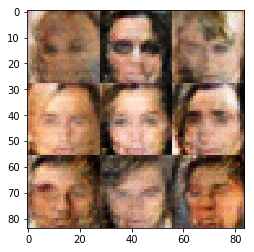

Epoch 5/5... Discriminator Loss: 1.3994... Generator Loss: 0.6783
Epoch 5/5... Discriminator Loss: 1.3948... Generator Loss: 0.6814
Epoch 5/5... Discriminator Loss: 1.4066... Generator Loss: 0.6754
Epoch 5/5... Discriminator Loss: 1.3899... Generator Loss: 0.6883
Epoch 5/5... Discriminator Loss: 1.3961... Generator Loss: 0.6906
Epoch 5/5... Discriminator Loss: 1.3909... Generator Loss: 0.6902
Epoch 5/5... Discriminator Loss: 1.3962... Generator Loss: 0.6841
Epoch 5/5... Discriminator Loss: 1.3965... Generator Loss: 0.6828
Epoch 5/5... Discriminator Loss: 1.3914... Generator Loss: 0.6860
Epoch 5/5... Discriminator Loss: 1.3905... Generator Loss: 0.6916


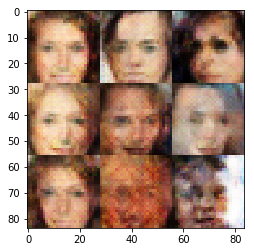

Epoch 5/5... Discriminator Loss: 1.3934... Generator Loss: 0.6876
Epoch 5/5... Discriminator Loss: 1.3962... Generator Loss: 0.6829
Epoch 5/5... Discriminator Loss: 1.3912... Generator Loss: 0.6801
Epoch 5/5... Discriminator Loss: 1.3903... Generator Loss: 0.6806
Epoch 5/5... Discriminator Loss: 1.3959... Generator Loss: 0.6858
Epoch 5/5... Discriminator Loss: 1.3984... Generator Loss: 0.6846
Epoch 5/5... Discriminator Loss: 1.3946... Generator Loss: 0.6908
Epoch 5/5... Discriminator Loss: 1.3958... Generator Loss: 0.6912
Epoch 5/5... Discriminator Loss: 1.3904... Generator Loss: 0.6875
Epoch 5/5... Discriminator Loss: 1.3960... Generator Loss: 0.6847


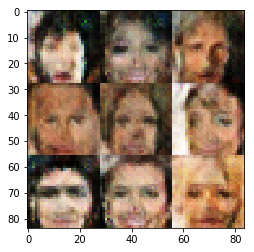

Epoch 5/5... Discriminator Loss: 1.3894... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3923... Generator Loss: 0.6886
Epoch 5/5... Discriminator Loss: 1.3932... Generator Loss: 0.6873
Epoch 5/5... Discriminator Loss: 1.3920... Generator Loss: 0.6902
Epoch 5/5... Discriminator Loss: 1.3913... Generator Loss: 0.6924
Epoch 5/5... Discriminator Loss: 1.3905... Generator Loss: 0.6884
Epoch 5/5... Discriminator Loss: 1.3903... Generator Loss: 0.6876
Epoch 5/5... Discriminator Loss: 1.3909... Generator Loss: 0.6877
Epoch 5/5... Discriminator Loss: 1.3912... Generator Loss: 0.6862
Epoch 5/5... Discriminator Loss: 1.3914... Generator Loss: 0.6944


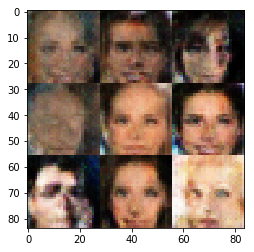

Epoch 5/5... Discriminator Loss: 1.3921... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.3911... Generator Loss: 0.6813
Epoch 5/5... Discriminator Loss: 1.3884... Generator Loss: 0.6845
Epoch 5/5... Discriminator Loss: 1.3951... Generator Loss: 0.6893
Epoch 5/5... Discriminator Loss: 1.3905... Generator Loss: 0.6926
Epoch 5/5... Discriminator Loss: 1.3918... Generator Loss: 0.6895
Epoch 5/5... Discriminator Loss: 1.3932... Generator Loss: 0.6896
Epoch 5/5... Discriminator Loss: 1.3921... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.4053... Generator Loss: 0.6790
Epoch 5/5... Discriminator Loss: 1.3934... Generator Loss: 0.6889


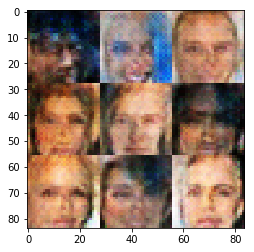

Epoch 5/5... Discriminator Loss: 1.3920... Generator Loss: 0.6810
Epoch 5/5... Discriminator Loss: 1.3957... Generator Loss: 0.6847
Epoch 5/5... Discriminator Loss: 1.3922... Generator Loss: 0.6845
Epoch 5/5... Discriminator Loss: 1.3955... Generator Loss: 0.6913
Epoch 5/5... Discriminator Loss: 1.3917... Generator Loss: 0.6916
Epoch 5/5... Discriminator Loss: 1.3897... Generator Loss: 0.6877
Epoch 5/5... Discriminator Loss: 1.3925... Generator Loss: 0.6817
Epoch 5/5... Discriminator Loss: 1.3971... Generator Loss: 0.6803
Epoch 5/5... Discriminator Loss: 1.3971... Generator Loss: 0.6802
Epoch 5/5... Discriminator Loss: 1.3959... Generator Loss: 0.6844


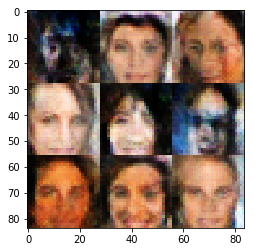

Epoch 5/5... Discriminator Loss: 1.3952... Generator Loss: 0.6820
Epoch 5/5... Discriminator Loss: 1.3984... Generator Loss: 0.6851
Epoch 5/5... Discriminator Loss: 1.3951... Generator Loss: 0.6867
Epoch 5/5... Discriminator Loss: 1.3932... Generator Loss: 0.6881
Epoch 5/5... Discriminator Loss: 1.3913... Generator Loss: 0.6885
Epoch 5/5... Discriminator Loss: 1.3999... Generator Loss: 0.6812
Epoch 5/5... Discriminator Loss: 1.3963... Generator Loss: 0.6871
Epoch 5/5... Discriminator Loss: 1.3859... Generator Loss: 0.6888
Epoch 5/5... Discriminator Loss: 1.3926... Generator Loss: 0.6878
Epoch 5/5... Discriminator Loss: 1.3952... Generator Loss: 0.6909


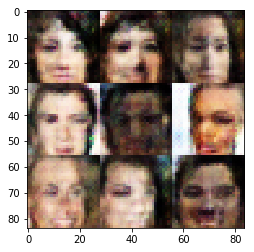

Epoch 5/5... Discriminator Loss: 1.3949... Generator Loss: 0.6869
Epoch 5/5... Discriminator Loss: 1.3921... Generator Loss: 0.6829
Epoch 5/5... Discriminator Loss: 1.3896... Generator Loss: 0.6861
Epoch 5/5... Discriminator Loss: 1.3899... Generator Loss: 0.6922
Epoch 5/5... Discriminator Loss: 1.3941... Generator Loss: 0.6878
Epoch 5/5... Discriminator Loss: 1.3945... Generator Loss: 0.6880
Epoch 5/5... Discriminator Loss: 1.3944... Generator Loss: 0.6835
Epoch 5/5... Discriminator Loss: 1.3897... Generator Loss: 0.6905
Epoch 5/5... Discriminator Loss: 1.3976... Generator Loss: 0.6767
Epoch 5/5... Discriminator Loss: 1.3979... Generator Loss: 0.6822


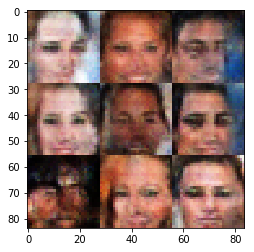

Epoch 5/5... Discriminator Loss: 1.3905... Generator Loss: 0.6878
Epoch 5/5... Discriminator Loss: 1.3961... Generator Loss: 0.6838
Epoch 5/5... Discriminator Loss: 1.3921... Generator Loss: 0.6857
Epoch 5/5... Discriminator Loss: 1.3978... Generator Loss: 0.6833
Epoch 5/5... Discriminator Loss: 1.3957... Generator Loss: 0.6838
Epoch 5/5... Discriminator Loss: 1.3928... Generator Loss: 0.6895
Epoch 5/5... Discriminator Loss: 1.3998... Generator Loss: 0.6883
Epoch 5/5... Discriminator Loss: 1.3933... Generator Loss: 0.6853
Epoch 5/5... Discriminator Loss: 1.3942... Generator Loss: 0.6800
Epoch 5/5... Discriminator Loss: 1.3901... Generator Loss: 0.6820


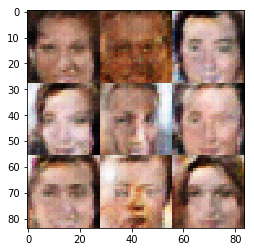

Epoch 5/5... Discriminator Loss: 1.3985... Generator Loss: 0.6772
Epoch 5/5... Discriminator Loss: 1.3962... Generator Loss: 0.6898
Epoch 5/5... Discriminator Loss: 1.3991... Generator Loss: 0.6858
Epoch 5/5... Discriminator Loss: 1.3943... Generator Loss: 0.6909
Epoch 5/5... Discriminator Loss: 1.3908... Generator Loss: 0.6949
Epoch 5/5... Discriminator Loss: 1.3924... Generator Loss: 0.6865
Epoch 5/5... Discriminator Loss: 1.3958... Generator Loss: 0.6823
Epoch 5/5... Discriminator Loss: 1.3921... Generator Loss: 0.6916
Epoch 5/5... Discriminator Loss: 1.3945... Generator Loss: 0.6876
Epoch 5/5... Discriminator Loss: 1.3859... Generator Loss: 0.6852


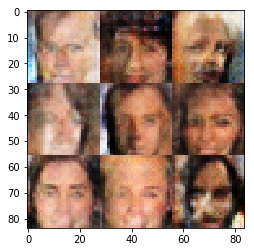

Epoch 5/5... Discriminator Loss: 1.4009... Generator Loss: 0.6784
Epoch 5/5... Discriminator Loss: 1.3958... Generator Loss: 0.6883
Epoch 5/5... Discriminator Loss: 1.3915... Generator Loss: 0.6866
Epoch 5/5... Discriminator Loss: 1.3944... Generator Loss: 0.6876
Epoch 5/5... Discriminator Loss: 1.3896... Generator Loss: 0.6919
Epoch 5/5... Discriminator Loss: 1.3934... Generator Loss: 0.6906
Epoch 5/5... Discriminator Loss: 1.3962... Generator Loss: 0.6804
Epoch 5/5... Discriminator Loss: 1.3899... Generator Loss: 0.6871
Epoch 5/5... Discriminator Loss: 1.3979... Generator Loss: 0.6842
Epoch 5/5... Discriminator Loss: 1.3998... Generator Loss: 0.6838


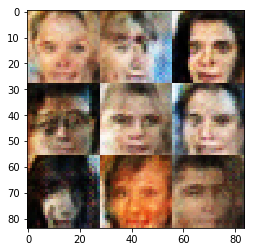

Epoch 5/5... Discriminator Loss: 1.3893... Generator Loss: 0.6879
Epoch 5/5... Discriminator Loss: 1.3920... Generator Loss: 0.6869
Epoch 5/5... Discriminator Loss: 1.3949... Generator Loss: 0.6849
Epoch 5/5... Discriminator Loss: 1.3933... Generator Loss: 0.6817
Epoch 5/5... Discriminator Loss: 1.3891... Generator Loss: 0.6902
Epoch 5/5... Discriminator Loss: 1.3968... Generator Loss: 0.6843
Epoch 5/5... Discriminator Loss: 1.3893... Generator Loss: 0.6881
Epoch 5/5... Discriminator Loss: 1.3891... Generator Loss: 0.6859
Epoch 5/5... Discriminator Loss: 1.3956... Generator Loss: 0.6954
Epoch 5/5... Discriminator Loss: 1.3852... Generator Loss: 0.6926


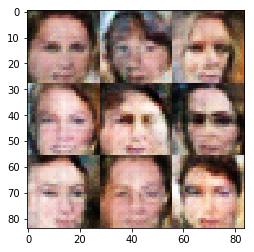

Epoch 5/5... Discriminator Loss: 1.3948... Generator Loss: 0.6812
Epoch 5/5... Discriminator Loss: 1.3966... Generator Loss: 0.6833
Epoch 5/5... Discriminator Loss: 1.3926... Generator Loss: 0.6863
Epoch 5/5... Discriminator Loss: 1.4009... Generator Loss: 0.6810
Epoch 5/5... Discriminator Loss: 1.3925... Generator Loss: 0.6824
Epoch 5/5... Discriminator Loss: 1.3910... Generator Loss: 0.6933
Epoch 5/5... Discriminator Loss: 1.3977... Generator Loss: 0.6833
Epoch 5/5... Discriminator Loss: 1.3900... Generator Loss: 0.6793
Epoch 5/5... Discriminator Loss: 1.3915... Generator Loss: 0.6862
Epoch 5/5... Discriminator Loss: 1.3911... Generator Loss: 0.6926


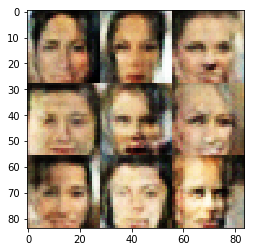

Epoch 5/5... Discriminator Loss: 1.3883... Generator Loss: 0.6919
Epoch 5/5... Discriminator Loss: 1.3946... Generator Loss: 0.6826
Epoch 5/5... Discriminator Loss: 1.3967... Generator Loss: 0.6862
Epoch 5/5... Discriminator Loss: 1.3923... Generator Loss: 0.6887
Epoch 5/5... Discriminator Loss: 1.3869... Generator Loss: 0.6907
Epoch 5/5... Discriminator Loss: 1.3991... Generator Loss: 0.6832
Epoch 5/5... Discriminator Loss: 1.3873... Generator Loss: 0.6857
Epoch 5/5... Discriminator Loss: 1.3968... Generator Loss: 0.6884
Epoch 5/5... Discriminator Loss: 1.4020... Generator Loss: 0.6943
Epoch 5/5... Discriminator Loss: 1.3934... Generator Loss: 0.6903


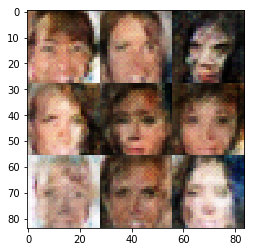

Epoch 5/5... Discriminator Loss: 1.3916... Generator Loss: 0.6873
Epoch 5/5... Discriminator Loss: 1.3973... Generator Loss: 0.6852
Epoch 5/5... Discriminator Loss: 1.3979... Generator Loss: 0.6927
Epoch 5/5... Discriminator Loss: 1.3850... Generator Loss: 0.6967
Epoch 5/5... Discriminator Loss: 1.3914... Generator Loss: 0.6837
Epoch 5/5... Discriminator Loss: 1.3994... Generator Loss: 0.6795
Epoch 5/5... Discriminator Loss: 1.3962... Generator Loss: 0.6890
Epoch 5/5... Discriminator Loss: 1.3949... Generator Loss: 0.6879
Epoch 5/5... Discriminator Loss: 1.3924... Generator Loss: 0.6883
Epoch 5/5... Discriminator Loss: 1.3958... Generator Loss: 0.6822


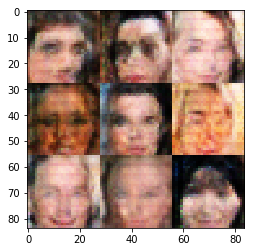

Epoch 5/5... Discriminator Loss: 1.3986... Generator Loss: 0.6879
Epoch 5/5... Discriminator Loss: 1.3913... Generator Loss: 0.6870
Epoch 5/5... Discriminator Loss: 1.3891... Generator Loss: 0.6884
Epoch 5/5... Discriminator Loss: 1.3904... Generator Loss: 0.6850
Epoch 5/5... Discriminator Loss: 1.3941... Generator Loss: 0.6870
Epoch 5/5... Discriminator Loss: 1.3908... Generator Loss: 0.6856
Epoch 5/5... Discriminator Loss: 1.3912... Generator Loss: 0.6903
Epoch 5/5... Discriminator Loss: 1.3940... Generator Loss: 0.6856
Epoch 5/5... Discriminator Loss: 1.4106... Generator Loss: 0.6798
Epoch 5/5... Discriminator Loss: 1.3940... Generator Loss: 0.6884


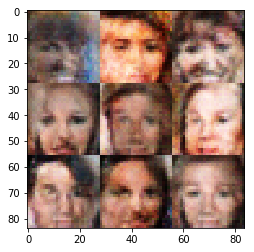

Epoch 5/5... Discriminator Loss: 1.3922... Generator Loss: 0.6835
Epoch 5/5... Discriminator Loss: 1.3953... Generator Loss: 0.6793
Epoch 5/5... Discriminator Loss: 1.3915... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.3905... Generator Loss: 0.6845
Epoch 5/5... Discriminator Loss: 1.3956... Generator Loss: 0.6921
Epoch 5/5... Discriminator Loss: 1.3913... Generator Loss: 0.6873
Epoch 5/5... Discriminator Loss: 1.3941... Generator Loss: 0.6842
Epoch 5/5... Discriminator Loss: 1.3993... Generator Loss: 0.6861
Epoch 5/5... Discriminator Loss: 1.3916... Generator Loss: 0.6886
Epoch 5/5... Discriminator Loss: 1.3919... Generator Loss: 0.6874


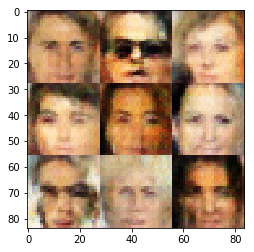

Epoch 5/5... Discriminator Loss: 1.3971... Generator Loss: 0.6847
Epoch 5/5... Discriminator Loss: 1.3973... Generator Loss: 0.6825
Epoch 5/5... Discriminator Loss: 1.4045... Generator Loss: 0.6854
Epoch 5/5... Discriminator Loss: 1.3928... Generator Loss: 0.6850
Epoch 5/5... Discriminator Loss: 1.3980... Generator Loss: 0.6758
Epoch 5/5... Discriminator Loss: 1.3925... Generator Loss: 0.6832
Epoch 5/5... Discriminator Loss: 1.3957... Generator Loss: 0.6832
Epoch 5/5... Discriminator Loss: 1.3952... Generator Loss: 0.6833
Epoch 5/5... Discriminator Loss: 1.3938... Generator Loss: 0.6895
Epoch 5/5... Discriminator Loss: 1.3949... Generator Loss: 0.6821


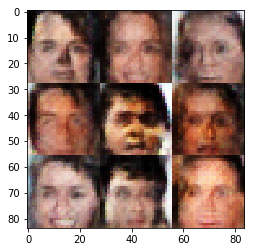

Epoch 5/5... Discriminator Loss: 1.3928... Generator Loss: 0.6872
Epoch 5/5... Discriminator Loss: 1.3872... Generator Loss: 0.6897
Epoch 5/5... Discriminator Loss: 1.3878... Generator Loss: 0.6936
Epoch 5/5... Discriminator Loss: 1.3921... Generator Loss: 0.6863
Epoch 5/5... Discriminator Loss: 1.3964... Generator Loss: 0.6853
Epoch 5/5... Discriminator Loss: 1.3882... Generator Loss: 0.6927
Epoch 5/5... Discriminator Loss: 1.3958... Generator Loss: 0.6855
Epoch 5/5... Discriminator Loss: 1.3937... Generator Loss: 0.6860
Epoch 5/5... Discriminator Loss: 1.3904... Generator Loss: 0.6904
Epoch 5/5... Discriminator Loss: 1.3931... Generator Loss: 0.6831


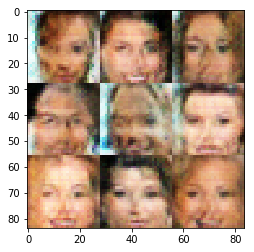

Epoch 5/5... Discriminator Loss: 1.3941... Generator Loss: 0.6865
Epoch 5/5... Discriminator Loss: 1.3938... Generator Loss: 0.6850
Epoch 5/5... Discriminator Loss: 1.3970... Generator Loss: 0.6845
Epoch 5/5... Discriminator Loss: 1.3921... Generator Loss: 0.6888
Epoch 5/5... Discriminator Loss: 1.3923... Generator Loss: 0.6858
Epoch 5/5... Discriminator Loss: 1.3923... Generator Loss: 0.6873
Epoch 5/5... Discriminator Loss: 1.3926... Generator Loss: 0.6839
Epoch 5/5... Discriminator Loss: 1.3940... Generator Loss: 0.6854
Epoch 5/5... Discriminator Loss: 1.3968... Generator Loss: 0.6870
Epoch 5/5... Discriminator Loss: 1.3893... Generator Loss: 0.6944


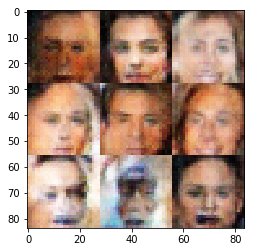

Epoch 5/5... Discriminator Loss: 1.3987... Generator Loss: 0.6881
Epoch 5/5... Discriminator Loss: 1.3927... Generator Loss: 0.6878
Epoch 5/5... Discriminator Loss: 1.3938... Generator Loss: 0.6854
Epoch 5/5... Discriminator Loss: 1.3920... Generator Loss: 0.6904
Epoch 5/5... Discriminator Loss: 1.3926... Generator Loss: 0.6878
Epoch 5/5... Discriminator Loss: 1.3943... Generator Loss: 0.6857
Epoch 5/5... Discriminator Loss: 1.3971... Generator Loss: 0.6865
Epoch 5/5... Discriminator Loss: 1.3902... Generator Loss: 0.6937
Epoch 5/5... Discriminator Loss: 1.3962... Generator Loss: 0.6805
Epoch 5/5... Discriminator Loss: 1.3996... Generator Loss: 0.6850


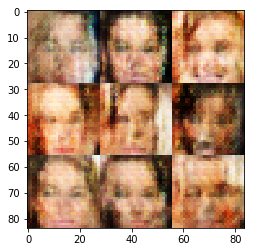

Epoch 5/5... Discriminator Loss: 1.3929... Generator Loss: 0.6751
Epoch 5/5... Discriminator Loss: 1.4025... Generator Loss: 0.6840
Epoch 5/5... Discriminator Loss: 1.3913... Generator Loss: 0.6915
Epoch 5/5... Discriminator Loss: 1.3946... Generator Loss: 0.6893
Epoch 5/5... Discriminator Loss: 1.3925... Generator Loss: 0.6859
Epoch 5/5... Discriminator Loss: 1.3933... Generator Loss: 0.6910
Epoch 5/5... Discriminator Loss: 1.3925... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.3917... Generator Loss: 0.6893
Epoch 5/5... Discriminator Loss: 1.3946... Generator Loss: 0.6871
Epoch 5/5... Discriminator Loss: 1.3871... Generator Loss: 0.6913


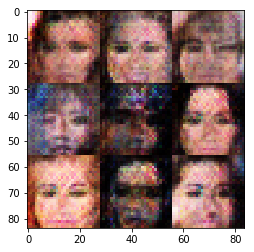

Epoch 5/5... Discriminator Loss: 1.3948... Generator Loss: 0.6873
Epoch 5/5... Discriminator Loss: 1.3898... Generator Loss: 0.6911
Epoch 5/5... Discriminator Loss: 1.3867... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3943... Generator Loss: 0.6873
Epoch 5/5... Discriminator Loss: 1.3901... Generator Loss: 0.6887
Epoch 5/5... Discriminator Loss: 1.3944... Generator Loss: 0.6871
Epoch 5/5... Discriminator Loss: 1.3839... Generator Loss: 0.6921
Epoch 5/5... Discriminator Loss: 1.3907... Generator Loss: 0.6935
Epoch 5/5... Discriminator Loss: 1.3883... Generator Loss: 0.6826
Epoch 5/5... Discriminator Loss: 1.3943... Generator Loss: 0.6903


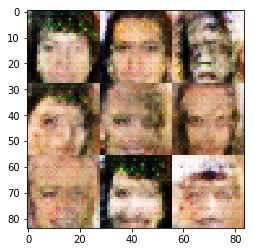

Epoch 5/5... Discriminator Loss: 1.3862... Generator Loss: 0.6910
Epoch 5/5... Discriminator Loss: 1.3857... Generator Loss: 0.6927
Epoch 5/5... Discriminator Loss: 1.4043... Generator Loss: 0.6816
Epoch 5/5... Discriminator Loss: 1.3831... Generator Loss: 0.6933
Epoch 5/5... Discriminator Loss: 1.3983... Generator Loss: 0.6843
Epoch 5/5... Discriminator Loss: 1.3990... Generator Loss: 0.6880
Epoch 5/5... Discriminator Loss: 1.3899... Generator Loss: 0.6907
Epoch 5/5... Discriminator Loss: 1.3890... Generator Loss: 0.6930
Epoch 5/5... Discriminator Loss: 1.3960... Generator Loss: 0.6881
Epoch 5/5... Discriminator Loss: 1.3932... Generator Loss: 0.6877


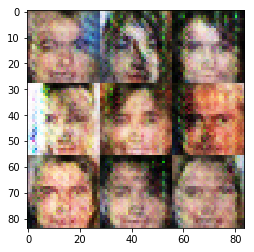

Epoch 5/5... Discriminator Loss: 1.3895... Generator Loss: 0.6892
Epoch 5/5... Discriminator Loss: 1.3935... Generator Loss: 0.6863
Epoch 5/5... Discriminator Loss: 1.3939... Generator Loss: 0.6901
Epoch 5/5... Discriminator Loss: 1.3898... Generator Loss: 0.6907
Epoch 5/5... Discriminator Loss: 1.3885... Generator Loss: 0.6922
Epoch 5/5... Discriminator Loss: 1.3901... Generator Loss: 0.6895
Epoch 5/5... Discriminator Loss: 1.3900... Generator Loss: 0.6914
Epoch 5/5... Discriminator Loss: 1.3904... Generator Loss: 0.6917
Epoch 5/5... Discriminator Loss: 1.3922... Generator Loss: 0.6903
Epoch 5/5... Discriminator Loss: 1.3907... Generator Loss: 0.6907


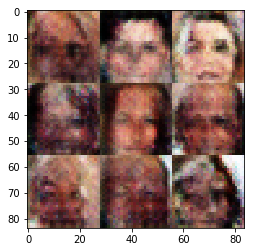

Epoch 5/5... Discriminator Loss: 1.3947... Generator Loss: 0.6875
Epoch 5/5... Discriminator Loss: 1.3915... Generator Loss: 0.6887
Epoch 5/5... Discriminator Loss: 1.3903... Generator Loss: 0.6881
Epoch 5/5... Discriminator Loss: 1.3915... Generator Loss: 0.6881
Epoch 5/5... Discriminator Loss: 1.3876... Generator Loss: 0.6900
Epoch 5/5... Discriminator Loss: 1.3903... Generator Loss: 0.6896
Epoch 5/5... Discriminator Loss: 1.3946... Generator Loss: 0.6892
Epoch 5/5... Discriminator Loss: 1.3898... Generator Loss: 0.6924
Epoch 5/5... Discriminator Loss: 1.3881... Generator Loss: 0.6937
Epoch 5/5... Discriminator Loss: 1.3888... Generator Loss: 0.6937


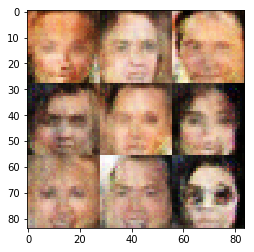

Epoch 5/5... Discriminator Loss: 1.3877... Generator Loss: 0.6859
Epoch 5/5... Discriminator Loss: 1.3936... Generator Loss: 0.6902
Epoch 5/5... Discriminator Loss: 1.3910... Generator Loss: 0.6894
Epoch 5/5... Discriminator Loss: 1.3954... Generator Loss: 0.6883
Epoch 5/5... Discriminator Loss: 1.3919... Generator Loss: 0.6909
Epoch 5/5... Discriminator Loss: 1.3858... Generator Loss: 0.6909
Epoch 5/5... Discriminator Loss: 1.3960... Generator Loss: 0.6835
Epoch 5/5... Discriminator Loss: 1.3953... Generator Loss: 0.6862
Epoch 5/5... Discriminator Loss: 1.3910... Generator Loss: 0.6918
Epoch 5/5... Discriminator Loss: 1.3827... Generator Loss: 0.6933


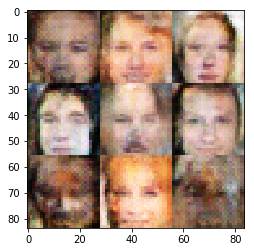

Epoch 5/5... Discriminator Loss: 1.3987... Generator Loss: 0.6860
Epoch 5/5... Discriminator Loss: 1.3996... Generator Loss: 0.6841
Epoch 5/5... Discriminator Loss: 1.3820... Generator Loss: 0.6918
Epoch 5/5... Discriminator Loss: 1.3950... Generator Loss: 0.6840
Epoch 5/5... Discriminator Loss: 1.3995... Generator Loss: 0.6853
Epoch 5/5... Discriminator Loss: 1.3917... Generator Loss: 0.6881
Epoch 5/5... Discriminator Loss: 1.3937... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3849... Generator Loss: 0.6910
Epoch 5/5... Discriminator Loss: 1.3879... Generator Loss: 0.6862
Epoch 5/5... Discriminator Loss: 1.4133... Generator Loss: 0.6808


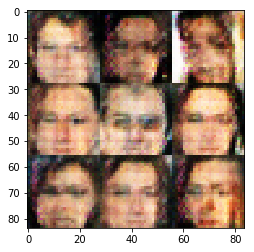

Epoch 5/5... Discriminator Loss: 1.3992... Generator Loss: 0.6899
Epoch 5/5... Discriminator Loss: 1.3840... Generator Loss: 0.6930
Epoch 5/5... Discriminator Loss: 1.3966... Generator Loss: 0.6840
Epoch 5/5... Discriminator Loss: 1.4031... Generator Loss: 0.6919
Epoch 5/5... Discriminator Loss: 1.3914... Generator Loss: 0.6906
Epoch 5/5... Discriminator Loss: 1.3894... Generator Loss: 0.6910
Epoch 5/5... Discriminator Loss: 1.3883... Generator Loss: 0.6875
-------Done-------


In [13]:
batch_size = 128
z_dim = 200
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.